# Part 2 - Classification

## Second problem

In [1]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from sklearn.metrics import mean_squared_error
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.layers.experimental import preprocessing
import keras.backend as K
from tensorflow.keras.metrics import Metric
from sklearn.model_selection import RepeatedStratifiedKFold, StratifiedKFold
from tensorflow.python.keras.utils import metrics_utils
from tensorflow.python.ops import init_ops
from tensorflow.python.ops import math_ops
from tensorflow.python.keras.utils.generic_utils import to_list

from tensorflow import keras
from keras.models import Sequential,Input,Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization, AveragePooling2D, Dropout
from keras.layers.advanced_activations import LeakyReLU
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score
from sklearn.metrics import fbeta_score
from keras.callbacks import Callback

from collections import Counter 
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils import class_weight
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from keras.models import load_model

from sklearn.svm import SVC
from sklearn.cluster import KMeans

from sklearn.feature_extraction import image
from sklearn.metrics import balanced_accuracy_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GridSearchCV
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import random
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE


C:\Users\maria\anaconda3\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.8.0 and strictly below 2.11.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.6.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [2]:
# Load variables
x_train_dataset = np.load('Xtrain_Classification2.npy');
y_train_dataset = np.load('Ytrain_Classification2.npy');
x_test = np.load('Xtest_Classification2.npy');

In [3]:
# check dimensions
print('X train dataset dimensions = ', x_train_dataset.shape)
print('Y train dataset dimensions = ', y_train_dataset.shape)
print('X test dataset dimensions = ', x_test.shape)

X train dataset dimensions =  (50700, 75)
Y train dataset dimensions =  (50700,)
X test dataset dimensions =  (33800, 75)


Classified as:  0


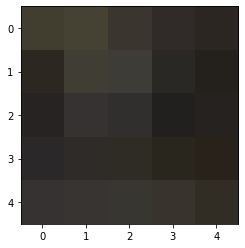

Classified as:  0


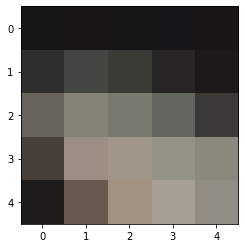

Classified as:  0


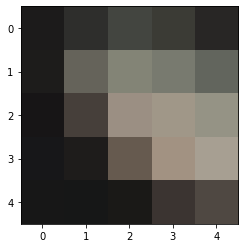

Classified as:  1


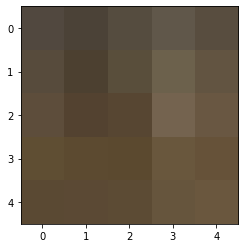

Classified as:  1


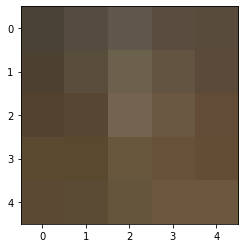

Classified as:  1


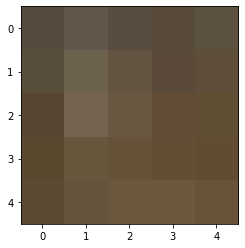

Classified as:  2


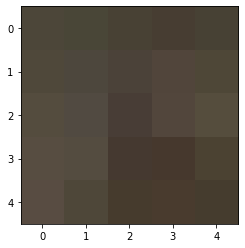

Classified as:  2


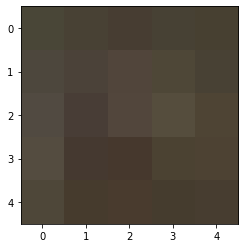

Classified as:  2


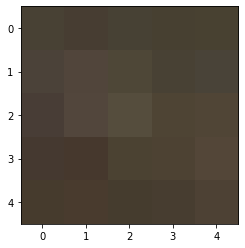

In [4]:
# Show image i

class0_example = np.where(y_train_dataset == 0)[0][0:3]
class1_example = np.where(y_train_dataset == 1)[0][0:3]
class2_example = np.where(y_train_dataset == 2)[0][0:3]

image_idx = np.append(class0_example, class1_example) 
image_idx = np.append(image_idx, class2_example)

for i in image_idx:
    print("Classified as: ", y_train_dataset[i])
    image_i = x_train_dataset[i,:]
    image_i = image_i.reshape(5, 5, 3)
    plt.imshow(image_i, cmap = 'cividis')
    plt.show()

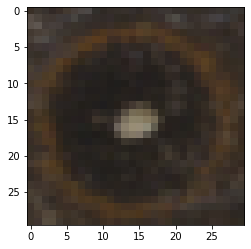

In [5]:
#50700/(26*26) = 75 
x_train_dataset_imaged = x_train_dataset.reshape((75, 676, 5, 5, 3))

image_reconstructed = image.reconstruct_from_patches_2d(x_train_dataset_imaged[3, :, :, :, :], (30,30,3)) 

plt.imshow(image_reconstructed/255)
plt.show()

In [6]:
print(Counter(y_train_dataset))

Counter({1: 40438, 2: 8694, 0: 1568})


## 1. Multilayer Perceptrons

In [245]:
def multilayer_perceptron(model, x_train_dataset, y_train_dataset, epochs, BATCH_SIZE, patience):
    
    class_names = ['Center', 'Rings', 'Background']
    
    # Normalize the dataset (re-scaling the data)
    x_train_dataset_n = x_train_dataset / 255.0
    
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset_n, y_train_dataset, test_size=0.1, stratify = y_train_dataset)
    
    # Convert labels into one-hot-encoding format
    y_test_val = Ytest
    Ytrain = to_categorical(Ytrain)
    Ytest = to_categorical(Ytest)
        
    # Define patience    
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)
        
    # tf.keras.optimizers.SGD 
    model.compile(optimizer='sgd',
                  loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
                  metrics=[tf.keras.metrics.CategoricalAccuracy()])
    
    history = model.fit(Xtrain, Ytrain, batch_size=BATCH_SIZE, epochs=epochs, callbacks=[es], validation_data=(Xtest, Ytest))
            
    test_loss, test_acc = model.evaluate(Xtest,  Ytest, verbose=1)

    print('\nTest categorical acurrancy-score:', test_acc)
    
    # predicting the testing set
    ypred = model.predict(Xtest)

    # Find the class with maximum probability
    y_test = []

    for i in range(len(ypred)):
        y_test.append(np.argmax(ypred[i]))
    
    balacc = balanced_accuracy_score(y_test_val, y_test)
    print('\n Balanced accuracy:', balacc)
    
    # ---------- plot learning curves:
    # Plot the training and validation data
    tacc=history.history['categorical_accuracy']
    tloss=history.history['loss']
    vacc=history.history['val_categorical_accuracy']
    vloss=history.history['val_loss']
    
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1)
    vc_label='best epoch= '+ str(index_acc + 1)
    
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
    axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training categorical accuracy score')
    axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation categorical accuracy score')
    axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation F1 score')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('categorical accuracy score')
    axes[1].legend()
    plt.tight_layout
    plt.show()
    
    clr = classification_report(y_test_val, y_test, target_names=class_names)
    print("Classification Report:\n----------------------\n", clr)
    
    # -------------------
    return balacc

Epoch 1/100
713/713 [==============================] - 1s 2ms/step - loss: 0.6512 - categorical_accuracy: 0.7889 - val_loss: 0.6031 - val_categorical_accuracy: 0.7976
Epoch 2/100
713/713 [==============================] - 1s 2ms/step - loss: 0.5788 - categorical_accuracy: 0.7977 - val_loss: 0.5584 - val_categorical_accuracy: 0.7976
Epoch 3/100
713/713 [==============================] - 1s 2ms/step - loss: 0.5437 - categorical_accuracy: 0.7980 - val_loss: 0.5298 - val_categorical_accuracy: 0.7976
Epoch 4/100
713/713 [==============================] - 1s 2ms/step - loss: 0.5212 - categorical_accuracy: 0.8001 - val_loss: 0.5111 - val_categorical_accuracy: 0.8006
Epoch 5/100
713/713 [==============================] - 1s 2ms/step - loss: 0.5068 - categorical_accuracy: 0.8019 - val_loss: 0.4994 - val_categorical_accuracy: 0.8043
Epoch 6/100
713/713 [==============================] - 1s 925us/step - loss: 0.4966 - categorical_accuracy: 0.8041 - val_loss: 0.4910 - val_categorical_accuracy: 0.8

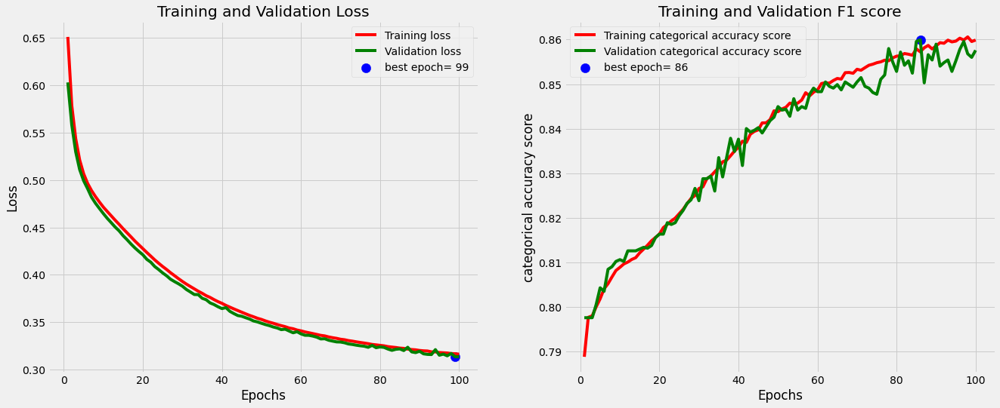

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.82      0.62      0.71       157
       Rings       0.89      0.94      0.91      4044
  Background       0.66      0.51      0.58       869

    accuracy                           0.86      5070
   macro avg       0.79      0.69      0.73      5070
weighted avg       0.85      0.86      0.85      5070

Epoch 1/100
713/713 [==============================] - 1s 1ms/step - loss: 0.6531 - categorical_accuracy: 0.7913 - val_loss: 0.6090 - val_categorical_accuracy: 0.7976
Epoch 2/100
713/713 [==============================] - 1s 1ms/step - loss: 0.5885 - categorical_accuracy: 0.7976 - val_loss: 0.5695 - val_categorical_accuracy: 0.7982
Epoch 3/100
713/713 [==============================] - 1s 2ms/step - loss: 0.5529 - categorical_accuracy: 0.7978 - val_loss: 0.5405 - val_categorical_accuracy: 0.7992
Epoch 4/100
713/713 [==============================] - 1s 2ms/step - lo

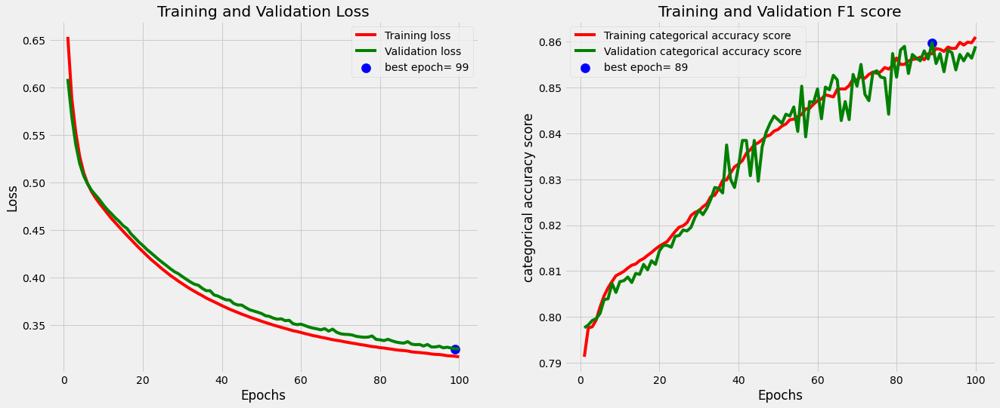

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.76      0.47      0.58       157
       Rings       0.88      0.96      0.92      4044
  Background       0.72      0.46      0.56       869

    accuracy                           0.86      5070
   macro avg       0.79      0.63      0.69      5070
weighted avg       0.85      0.86      0.85      5070

Epoch 1/100
713/713 [==============================] - 1s 1ms/step - loss: 0.6562 - categorical_accuracy: 0.7949 - val_loss: 0.6160 - val_categorical_accuracy: 0.7976
Epoch 2/100
713/713 [==============================] - 1s 2ms/step - loss: 0.5926 - categorical_accuracy: 0.7976 - val_loss: 0.5698 - val_categorical_accuracy: 0.7980
Epoch 3/100
713/713 [==============================] - 1s 2ms/step - loss: 0.5570 - categorical_accuracy: 0.7980 - val_loss: 0.5376 - val_categorical_accuracy: 0.7968
Epoch 4/100
713/713 [==============================] - 1s 2ms/step - lo

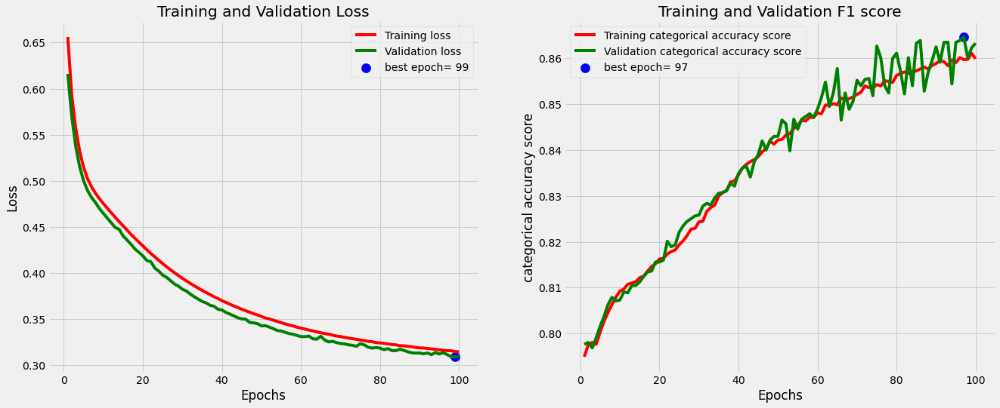

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.79      0.74      0.76       157
       Rings       0.89      0.94      0.92      4044
  Background       0.69      0.51      0.58       869

    accuracy                           0.86      5070
   macro avg       0.79      0.73      0.76      5070
weighted avg       0.85      0.86      0.86      5070

Epoch 1/100
713/713 [==============================] - 2s 2ms/step - loss: 0.6504 - categorical_accuracy: 0.7976 - val_loss: 0.6080 - val_categorical_accuracy: 0.7976
Epoch 2/100
713/713 [==============================] - 1s 2ms/step - loss: 0.5866 - categorical_accuracy: 0.7977 - val_loss: 0.5666 - val_categorical_accuracy: 0.7988
Epoch 3/100
713/713 [==============================] - 1s 1ms/step - loss: 0.5507 - categorical_accuracy: 0.7976 - val_loss: 0.5397 - val_categorical_accuracy: 0.7976
Epoch 4/100
713/713 [==============================] - 1s 993us/step - 

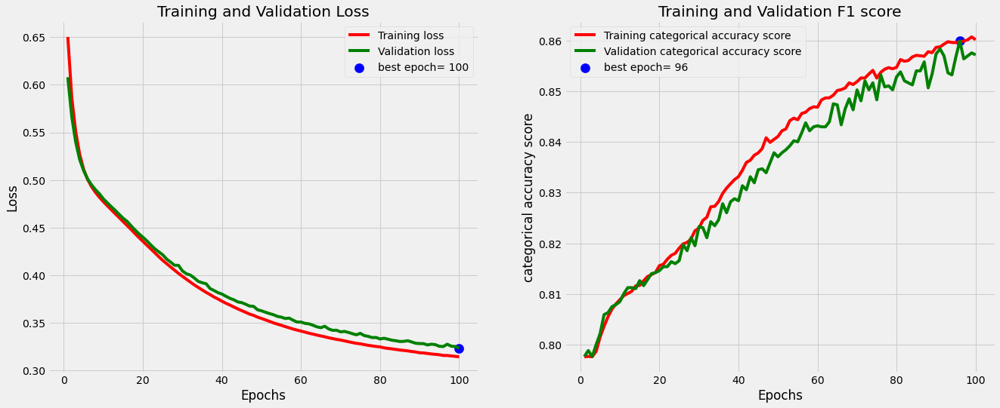

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.84      0.66      0.74       157
       Rings       0.88      0.96      0.91      4044
  Background       0.70      0.43      0.53       869

    accuracy                           0.86      5070
   macro avg       0.81      0.68      0.73      5070
weighted avg       0.85      0.86      0.84      5070

Epoch 1/100
713/713 [==============================] - 2s 2ms/step - loss: 0.6547 - categorical_accuracy: 0.7906 - val_loss: 0.6090 - val_categorical_accuracy: 0.7976
Epoch 2/100
713/713 [==============================] - 2s 2ms/step - loss: 0.5898 - categorical_accuracy: 0.7976 - val_loss: 0.5749 - val_categorical_accuracy: 0.7976
Epoch 3/100
713/713 [==============================] - 2s 2ms/step - loss: 0.5585 - categorical_accuracy: 0.7978 - val_loss: 0.5493 - val_categorical_accuracy: 0.7966
Epoch 4/100
713/713 [==============================] - 2s 2ms/step - lo

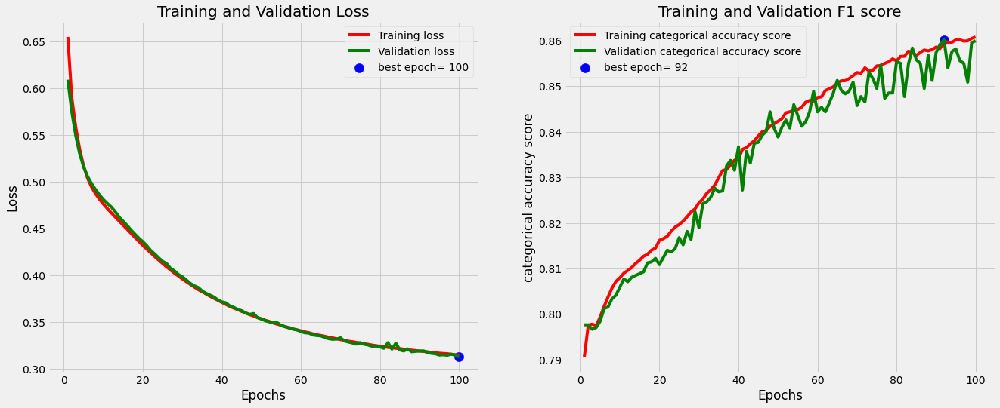

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.84      0.64      0.72       157
       Rings       0.88      0.95      0.92      4044
  Background       0.70      0.47      0.56       869

    accuracy                           0.86      5070
   macro avg       0.81      0.69      0.73      5070
weighted avg       0.85      0.86      0.85      5070

Model Performance (balanced accuracy) =  0.6895501660701691


In [246]:
for i in range(5):
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(3, activation='softmax')
    ])
    
    bacc = multilayer_perceptron(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10)
    baccs.append(bacc)

bacc = np.mean(baccs)
print("Model Performance (balanced accuracy) = ", bacc)

Epoch 1/100
713/713 [==============================] - 2s 2ms/step - loss: 0.6705 - categorical_accuracy: 0.7929 - val_loss: 0.6146 - val_categorical_accuracy: 0.7976
Epoch 2/100
713/713 [==============================] - 1s 1ms/step - loss: 0.6012 - categorical_accuracy: 0.7976 - val_loss: 0.5753 - val_categorical_accuracy: 0.7976
Epoch 3/100
713/713 [==============================] - 1s 1ms/step - loss: 0.5666 - categorical_accuracy: 0.7977 - val_loss: 0.5468 - val_categorical_accuracy: 0.7972
Epoch 4/100
713/713 [==============================] - 1s 1ms/step - loss: 0.5395 - categorical_accuracy: 0.7989 - val_loss: 0.5261 - val_categorical_accuracy: 0.7994
Epoch 5/100
713/713 [==============================] - 1s 1ms/step - loss: 0.5250 - categorical_accuracy: 0.8003 - val_loss: 0.5124 - val_categorical_accuracy: 0.8018
Epoch 6/100
713/713 [==============================] - 1s 1ms/step - loss: 0.5126 - categorical_accuracy: 0.8025 - val_loss: 0.5022 - val_categorical_accuracy: 0.802

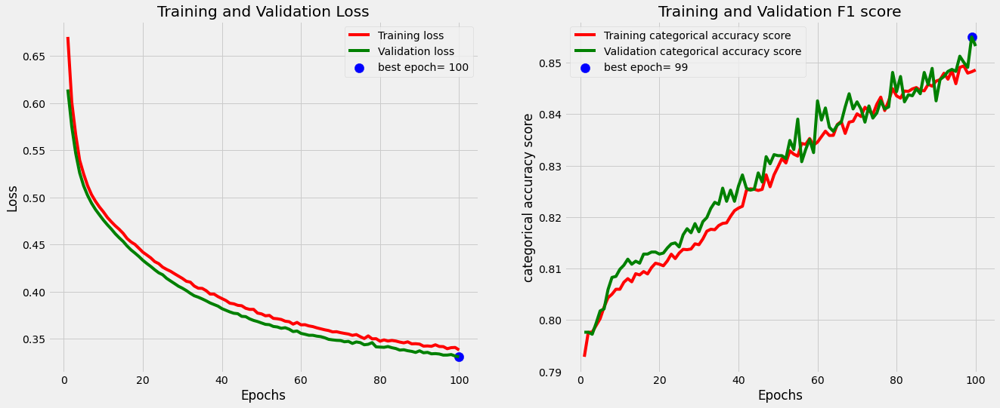

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.83      0.69      0.75       157
       Rings       0.87      0.97      0.91      4044
  Background       0.72      0.35      0.47       869

    accuracy                           0.85      5070
   macro avg       0.81      0.67      0.71      5070
weighted avg       0.84      0.85      0.83      5070

Epoch 1/100
713/713 [==============================] - 2s 3ms/step - loss: 0.6567 - categorical_accuracy: 0.7950 - val_loss: 0.6045 - val_categorical_accuracy: 0.7976
Epoch 2/100
713/713 [==============================] - 2s 3ms/step - loss: 0.5940 - categorical_accuracy: 0.7977 - val_loss: 0.5633 - val_categorical_accuracy: 0.7984
Epoch 3/100
713/713 [==============================] - 2s 3ms/step - loss: 0.5594 - categorical_accuracy: 0.7979 - val_loss: 0.5369 - val_categorical_accuracy: 0.7990
Epoch 4/100
713/713 [==============================] - 1s 2ms/step - lo

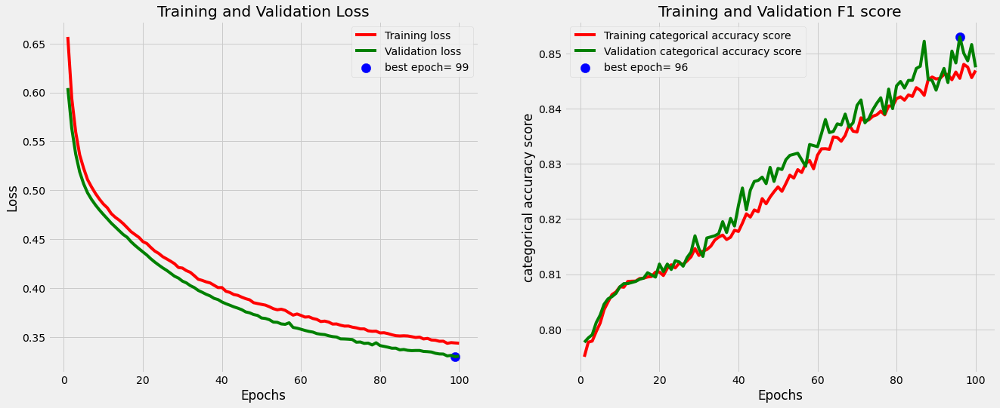

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.79      0.64      0.71       157
       Rings       0.86      0.98      0.91      4044
  Background       0.76      0.29      0.42       869

    accuracy                           0.85      5070
   macro avg       0.80      0.64      0.68      5070
weighted avg       0.84      0.85      0.82      5070

Epoch 1/100
713/713 [==============================] - 1s 2ms/step - loss: 0.6658 - categorical_accuracy: 0.7913 - val_loss: 0.6063 - val_categorical_accuracy: 0.7976
Epoch 2/100
713/713 [==============================] - 1s 1ms/step - loss: 0.5970 - categorical_accuracy: 0.7976 - val_loss: 0.5691 - val_categorical_accuracy: 0.7976
Epoch 3/100
713/713 [==============================] - 1s 1ms/step - loss: 0.5641 - categorical_accuracy: 0.7977 - val_loss: 0.5417 - val_categorical_accuracy: 0.7980
Epoch 4/100
713/713 [==============================] - 1s 1ms/step - lo

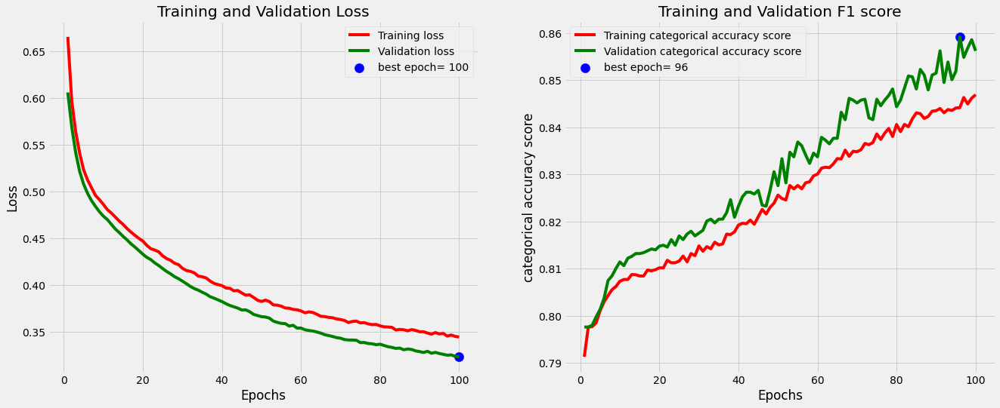

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.82      0.74      0.78       157
       Rings       0.87      0.97      0.92      4044
  Background       0.74      0.35      0.48       869

    accuracy                           0.86      5070
   macro avg       0.81      0.69      0.72      5070
weighted avg       0.84      0.86      0.84      5070

Epoch 1/100
713/713 [==============================] - 2s 2ms/step - loss: 0.6674 - categorical_accuracy: 0.7947 - val_loss: 0.6155 - val_categorical_accuracy: 0.7976
Epoch 2/100
713/713 [==============================] - 1s 1ms/step - loss: 0.6024 - categorical_accuracy: 0.7976 - val_loss: 0.5773 - val_categorical_accuracy: 0.7976
Epoch 3/100
713/713 [==============================] - 1s 1ms/step - loss: 0.5681 - categorical_accuracy: 0.7980 - val_loss: 0.5488 - val_categorical_accuracy: 0.7978
Epoch 4/100
713/713 [==============================] - 1s 1ms/step - lo

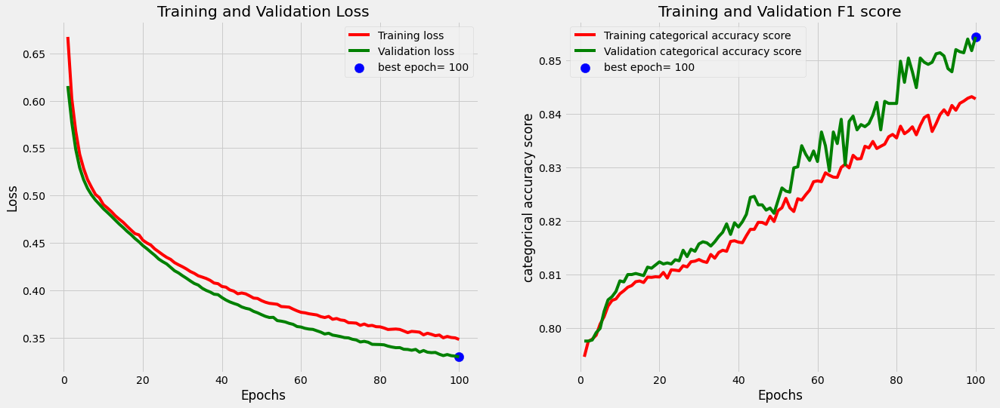

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.82      0.68      0.75       157
       Rings       0.86      0.97      0.91      4044
  Background       0.76      0.33      0.46       869

    accuracy                           0.85      5070
   macro avg       0.82      0.66      0.71      5070
weighted avg       0.84      0.85      0.83      5070

Epoch 1/100
713/713 [==============================] - 2s 3ms/step - loss: 0.6757 - categorical_accuracy: 0.7876 - val_loss: 0.6170 - val_categorical_accuracy: 0.7976
Epoch 2/100
713/713 [==============================] - 1s 2ms/step - loss: 0.6079 - categorical_accuracy: 0.7976 - val_loss: 0.5830 - val_categorical_accuracy: 0.7976
Epoch 3/100
713/713 [==============================] - 1s 2ms/step - loss: 0.5743 - categorical_accuracy: 0.7980 - val_loss: 0.5559 - val_categorical_accuracy: 0.7978
Epoch 4/100
713/713 [==============================] - 1s 2ms/step - lo

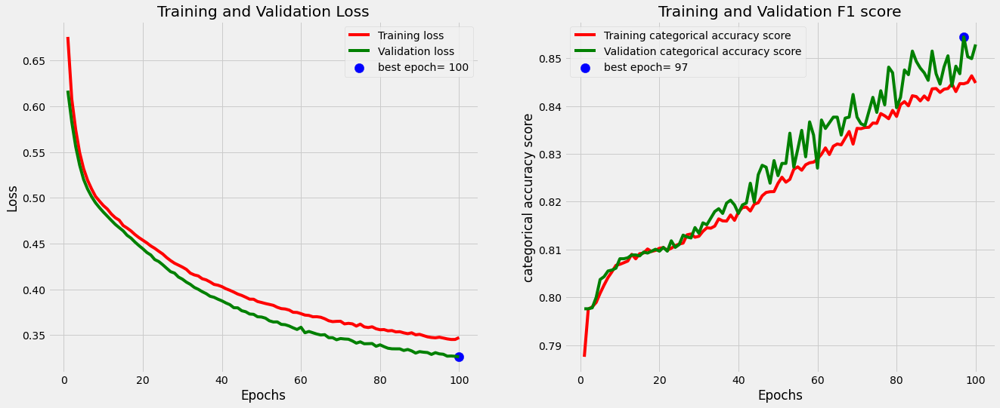

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.83      0.62      0.71       157
       Rings       0.86      0.97      0.91      4044
  Background       0.74      0.35      0.47       869

    accuracy                           0.85      5070
   macro avg       0.81      0.65      0.70      5070
weighted avg       0.84      0.85      0.83      5070

Model Performance (balanced accuracy) =  0.6600036624100512


In [249]:
baccs = []
for i in range(5):
    
    # Define Model
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.5), 
        tf.keras.layers.Dense(3, activation='softmax')
    ])
    
    bacc = multilayer_perceptron(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10)
    baccs.append(bacc)

bacc = np.mean(baccs)
print("Model Performance (balanced accuracy) = ", bacc)

## 2. Multilayer Perceptrons weighted

In [250]:
cw = class_weight.compute_class_weight(class_weight = 'balanced', classes = np.unique(y_train_dataset), y = y_train_dataset)

weights1 = dict(zip(np.unique(y_train_dataset),cw))

print(weights1)

{0: 10.778061224489797, 1: 0.4179237351006479, 2: 1.943869335173683}


In [253]:
def multilayer_perceptron_weighted(model, x_train_dataset, y_train_dataset, BATCH_SIZE, epochs, patience, class_weights):
    
    class_names = ['Center', 'Rings', 'Background']

    # Normalize the dataset (re-scaling the data)
    x_train_dataset_n = x_train_dataset / 255.0
    
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset_n, y_train_dataset, test_size=0.1, stratify = y_train_dataset)
    
    # Convert labels into one-hot-encoding format
    y_test_val = Ytest
    Ytrain = to_categorical(Ytrain)
    Ytest = to_categorical(Ytest)
    
    # Define patience    
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)
        
    # tf.keras.optimizers.SGD 
    model.compile(optimizer='sgd',
                  loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
                  metrics=[tf.keras.metrics.CategoricalAccuracy()])
    
    history = model.fit(Xtrain, Ytrain, batch_size=BATCH_SIZE, epochs=epochs, callbacks=[es], class_weight=class_weights, validation_data=(Xtest, Ytest))
            
    test_loss, test_acc = model.evaluate(Xtest,  Ytest, verbose=1)

    print('\nTest categorical accuracy:', test_acc)
    
    # predicting the testing set
    ypred = model.predict(Xtest)
    
    # Find the class with maximum probability
    y_test = []

    for i in range(len(ypred)):
        y_test.append(np.argmax(ypred[i]))
    
    balacc = balanced_accuracy_score(y_test_val, y_test)
    print('\n Balanced accuracy:', balacc)
    
    # predicting the testing set
    ypred = model.predict(Xtest)
    
    
    # ---------- plot learning curves:
    # Plot the training and validation data
    tacc=history.history['categorical_accuracy']
    tloss=history.history['loss']
    vacc=history.history['val_categorical_accuracy']
    vloss=history.history['val_loss']
    
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1)
    vc_label='best epoch= '+ str(index_acc + 1)
    
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
    axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training categorical accuracy score')
    axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation categorical accuracy score')
    axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation categorical accuracy score')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('categorical accuracy score')
    axes[1].legend()
    plt.tight_layout
    plt.show()
    
    clr = classification_report(y_test_val, y_test, target_names=class_names)
    print("Classification Report:\n----------------------\n", clr)
    
    return balacc

Epoch 1/100
713/713 [==============================] - 2s 2ms/step - loss: 0.9302 - categorical_accuracy: 0.3918 - val_loss: 0.9380 - val_categorical_accuracy: 0.6832
Epoch 2/100
713/713 [==============================] - 1s 1ms/step - loss: 0.7417 - categorical_accuracy: 0.6760 - val_loss: 0.8440 - val_categorical_accuracy: 0.6736
Epoch 3/100
713/713 [==============================] - 1s 1ms/step - loss: 0.6684 - categorical_accuracy: 0.6896 - val_loss: 0.7953 - val_categorical_accuracy: 0.6718
Epoch 4/100
713/713 [==============================] - 1s 1ms/step - loss: 0.6353 - categorical_accuracy: 0.6964 - val_loss: 0.7905 - val_categorical_accuracy: 0.6690
Epoch 5/100
713/713 [==============================] - 1s 1ms/step - loss: 0.6137 - categorical_accuracy: 0.7027 - val_loss: 0.7184 - val_categorical_accuracy: 0.7256
Epoch 6/100
713/713 [==============================] - 1s 2ms/step - loss: 0.5984 - categorical_accuracy: 0.7107 - val_loss: 0.7318 - val_categorical_accuracy: 0.709

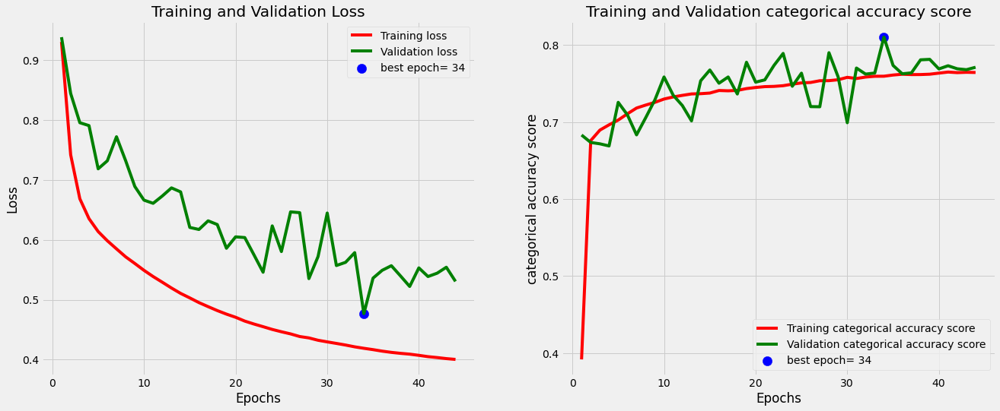

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.60      0.94      0.73       157
       Rings       0.97      0.74      0.84      4044
  Background       0.44      0.87      0.59       869

    accuracy                           0.77      5070
   macro avg       0.67      0.85      0.72      5070
weighted avg       0.86      0.77      0.79      5070

Epoch 1/100
713/713 [==============================] - 1s 1ms/step - loss: 0.9257 - categorical_accuracy: 0.4735 - val_loss: 0.9196 - val_categorical_accuracy: 0.7320
Epoch 2/100
713/713 [==============================] - 1s 1ms/step - loss: 0.7367 - categorical_accuracy: 0.7069 - val_loss: 0.8285 - val_categorical_accuracy: 0.6817
Epoch 3/100
713/713 [==============================] - 1s 1ms/step - loss: 0.6638 - categorical_accuracy: 0.7007 - val_loss: 0.7710 - val_categorical_accuracy: 0.7065
Epoch 4/100
713/713 [==============================] - 1s 1ms/step - lo

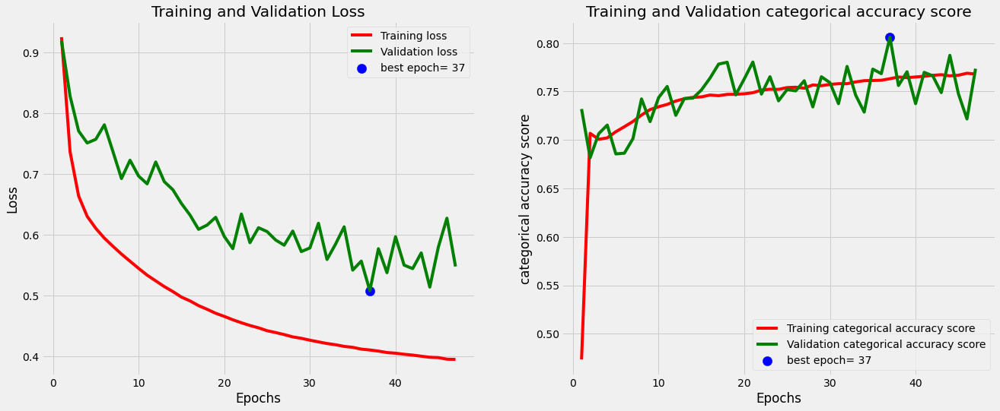

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.53      0.93      0.67       157
       Rings       0.96      0.75      0.84      4044
  Background       0.45      0.84      0.59       869

    accuracy                           0.77      5070
   macro avg       0.65      0.84      0.70      5070
weighted avg       0.86      0.77      0.79      5070

Epoch 1/100
713/713 [==============================] - 1s 2ms/step - loss: 0.9226 - categorical_accuracy: 0.3376 - val_loss: 0.9375 - val_categorical_accuracy: 0.6538
Epoch 2/100
713/713 [==============================] - 2s 2ms/step - loss: 0.7440 - categorical_accuracy: 0.6409 - val_loss: 0.8494 - val_categorical_accuracy: 0.6671
Epoch 3/100
713/713 [==============================] - 1s 2ms/step - loss: 0.6716 - categorical_accuracy: 0.6847 - val_loss: 0.8295 - val_categorical_accuracy: 0.6464
Epoch 4/100
713/713 [==============================] - 2s 2ms/step - lo

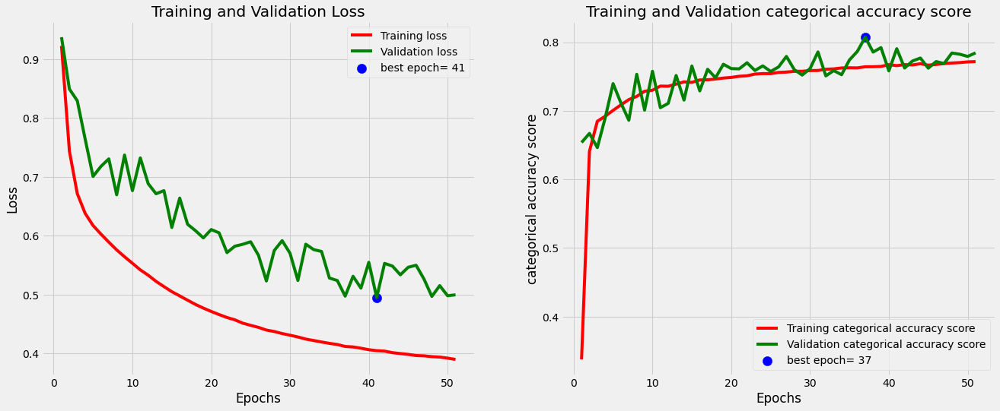

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.57      0.96      0.72       157
       Rings       0.96      0.76      0.85      4044
  Background       0.46      0.85      0.60       869

    accuracy                           0.78      5070
   macro avg       0.67      0.86      0.72      5070
weighted avg       0.86      0.78      0.80      5070

Epoch 1/100
713/713 [==============================] - 1s 1ms/step - loss: 0.9129 - categorical_accuracy: 0.4463 - val_loss: 0.9251 - val_categorical_accuracy: 0.6673
Epoch 2/100
713/713 [==============================] - 1s 1ms/step - loss: 0.7330 - categorical_accuracy: 0.6748 - val_loss: 0.8351 - val_categorical_accuracy: 0.6684
Epoch 3/100
713/713 [==============================] - 1s 1ms/step - loss: 0.6661 - categorical_accuracy: 0.6949 - val_loss: 0.8072 - val_categorical_accuracy: 0.6783
Epoch 4/100
713/713 [==============================] - 1s 1ms/step - lo

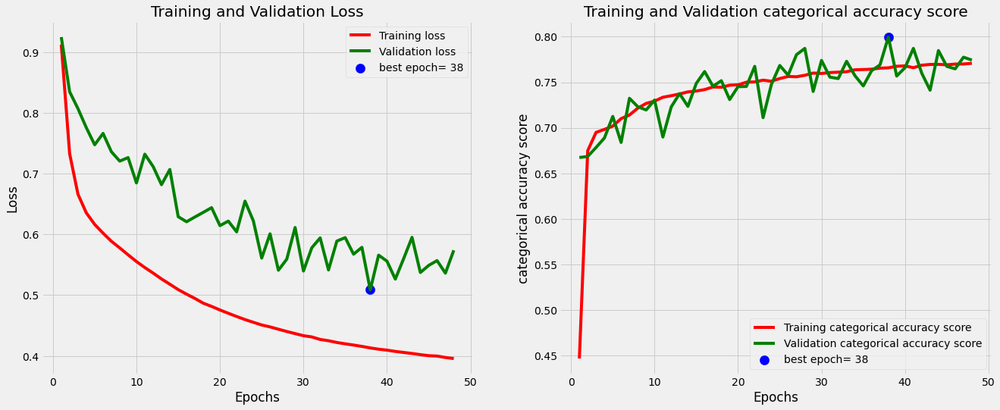

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.44      0.98      0.60       157
       Rings       0.96      0.75      0.84      4044
  Background       0.47      0.84      0.60       869

    accuracy                           0.77      5070
   macro avg       0.62      0.86      0.68      5070
weighted avg       0.86      0.77      0.80      5070

Epoch 1/100
713/713 [==============================] - 1s 2ms/step - loss: 0.9118 - categorical_accuracy: 0.4056 - val_loss: 0.9403 - val_categorical_accuracy: 0.6375
Epoch 2/100
713/713 [==============================] - 1s 2ms/step - loss: 0.7347 - categorical_accuracy: 0.6766 - val_loss: 0.8521 - val_categorical_accuracy: 0.6637
Epoch 3/100
713/713 [==============================] - 1s 2ms/step - loss: 0.6676 - categorical_accuracy: 0.6934 - val_loss: 0.7723 - val_categorical_accuracy: 0.7203
Epoch 4/100
713/713 [==============================] - 1s 2ms/step - lo

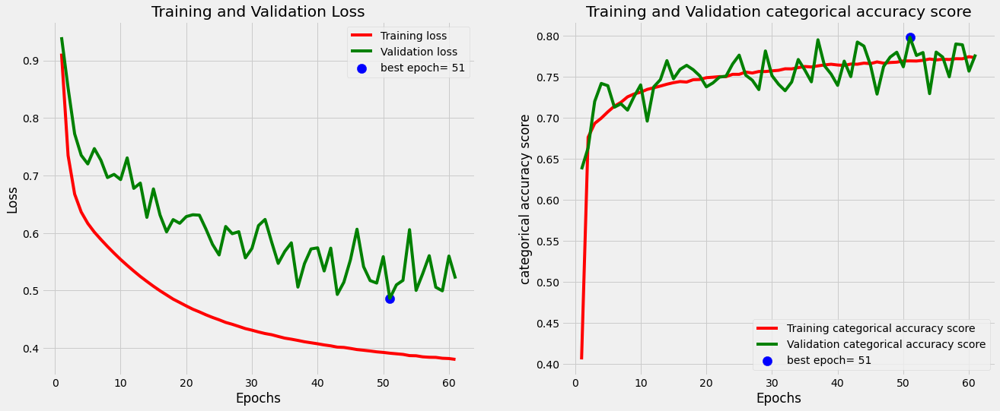

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.51      0.96      0.67       157
       Rings       0.97      0.75      0.84      4044
  Background       0.46      0.88      0.61       869

    accuracy                           0.78      5070
   macro avg       0.65      0.86      0.71      5070
weighted avg       0.87      0.78      0.80      5070

Model Performance (balanced accuracy) = =  0.8545024660375091


In [254]:
baccs = []
for i in range(5):
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(3, activation='softmax')
    ])
    
    bacc = multilayer_perceptron_weighted(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10, class_weights = weights1) 
    baccs.append(bacc)

bacc = np.mean(baccs)
print("Model Performance (balanced accuracy) = ", bacc)

## Decision Trees

In [7]:
scaler = StandardScaler()
x_train_dataset_n = scaler.fit_transform(x_train_dataset)

Xtrain, Xtest, ytrain, ytest = train_test_split(x_train_dataset, y_train_dataset, test_size = 0.1, random_state=1, stratify = y_train_dataset)

In [14]:
scores = cross_val_score(DecisionTreeClassifier(criterion = 'entropy', random_state=1), x_train_dataset, y_train_dataset, scoring = 'balanced_accuracy', cv = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1)) 

acc = np.mean(scores)
print('Model Performance (balanced accuracy) =', acc) 

Model Performance (balanced accuracy) = 0.756308290160981


In [17]:
param_grid = {'criterion': np.array(['gini', 'entropy'])}

grid = GridSearchCV(DecisionTreeClassifier(random_state=1, class_weight = 'balanced'),
                    param_grid=param_grid, 
                    scoring = 'balanced_accuracy', 
                    verbose = 3,
                    cv=StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1), 
                    return_train_score=True)

grid.fit(Xtrain, ytrain)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV 1/5] END criterion=gini;, score=(train=1.000, test=0.745) total time=   2.4s
[CV 2/5] END criterion=gini;, score=(train=1.000, test=0.735) total time=   4.4s
[CV 3/5] END criterion=gini;, score=(train=1.000, test=0.733) total time=   3.8s
[CV 4/5] END criterion=gini;, score=(train=1.000, test=0.750) total time=   2.7s
[CV 5/5] END criterion=gini;, score=(train=1.000, test=0.740) total time=   2.5s
[CV 1/5] END criterion=entropy;, score=(train=1.000, test=0.762) total time=   2.5s
[CV 2/5] END criterion=entropy;, score=(train=1.000, test=0.762) total time=   5.0s
[CV 3/5] END criterion=entropy;, score=(train=1.000, test=0.738) total time=   3.2s
[CV 4/5] END criterion=entropy;, score=(train=1.000, test=0.784) total time=   2.8s
[CV 5/5] END criterion=entropy;, score=(train=1.000, test=0.757) total time=   3.0s


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=1, test_size=0.1,
            train_size=None),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=1),
             param_grid={'criterion': array(['gini', 'entropy'], dtype='<U7')},
             return_train_score=True, scoring='balanced_accuracy', verbose=3)

In [18]:
scores = pd.DataFrame(grid.cv_results_)
print(scores['mean_test_score'])
acc = np.max(scores['mean_test_score'])
print(grid.best_params_)
print('Model Performance evaluated by cross validation (balanced accuracy) =', acc)

0    0.740570
1    0.760517
Name: mean_test_score, dtype: float64
{'criterion': 'entropy'}
Model Performance evaluated by cross validation (balanced accuracy) = 0.7605169919371837


In [19]:
model = grid.best_estimator_
model.fit(Xtrain,ytrain)
y_pred = model.predict(Xtest)

print('Balanced accuracy) =', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy) = 0.7603208704601209
              precision    recall  f1-score   support

           0       0.76      0.77      0.77       157
           1       0.91      0.91      0.91      4044
           2       0.60      0.60      0.60       869

    accuracy                           0.85      5070
   macro avg       0.76      0.76      0.76      5070
weighted avg       0.85      0.85      0.85      5070



#### CART with Thresholding of the impurity drop

In [20]:
param_grid = {'min_impurity_decrease': np.array([0.01, 0.05, 0.1, 0.2, 0.3])}

grid = GridSearchCV(DecisionTreeClassifier(criterion = 'entropy', random_state=1, class_weight = 'balanced'),
                    param_grid=param_grid, 
                    scoring = 'balanced_accuracy', 
                    verbose = 3,
                    cv=StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1), 
                    return_train_score=True)

grid.fit(Xtrain, ytrain)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV 1/5] END min_impurity_decrease=0.01;, score=(train=0.766, test=0.767) total time=   0.8s
[CV 2/5] END min_impurity_decrease=0.01;, score=(train=0.771, test=0.766) total time=   0.8s
[CV 3/5] END min_impurity_decrease=0.01;, score=(train=0.769, test=0.746) total time=   0.9s
[CV 4/5] END min_impurity_decrease=0.01;, score=(train=0.768, test=0.767) total time=   0.8s
[CV 5/5] END min_impurity_decrease=0.01;, score=(train=0.768, test=0.752) total time=   0.9s
[CV 1/5] END min_impurity_decrease=0.05;, score=(train=0.731, test=0.734) total time=   0.5s
[CV 2/5] END min_impurity_decrease=0.05;, score=(train=0.730, test=0.744) total time=   0.5s
[CV 3/5] END min_impurity_decrease=0.05;, score=(train=0.693, test=0.675) total time=   0.5s
[CV 4/5] END min_impurity_decrease=0.05;, score=(train=0.732, test=0.732) total time=   0.6s
[CV 5/5] END min_impurity_decrease=0.05;, score=(train=0.692, test=0.683) total time=   0.6s
[CV 1/5] E

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=1, test_size=0.1,
            train_size=None),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='entropy',
                                              random_state=1),
             param_grid={'min_impurity_decrease': array([0.01, 0.05, 0.1 , 0.2 , 0.3 ])},
             return_train_score=True, scoring='balanced_accuracy', verbose=3)

In [21]:
scores = pd.DataFrame(grid.cv_results_)
print(scores['mean_test_score'])
acc = np.max(scores['mean_test_score'])
print(grid.best_params_)
print('Model Performance evaluated by cross validation (balanced accuracy) =', acc)

0    0.759731
1    0.713610
2    0.626658
3    0.594069
4    0.594069
Name: mean_test_score, dtype: float64
{'min_impurity_decrease': 0.01}
Model Performance evaluated by cross validation (balanced accuracy) = 0.7597311592583326


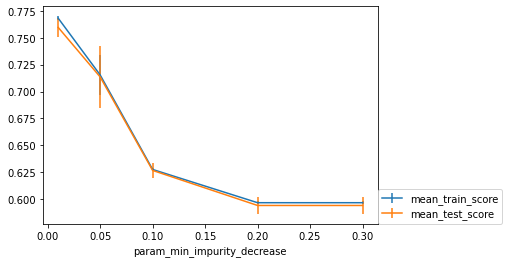

In [22]:
scores.plot(x='param_min_impurity_decrease', y='mean_train_score', yerr='std_train_score', ax=plt.gca())
scores.plot(x='param_min_impurity_decrease', y='mean_test_score', yerr='std_test_score', ax=plt.gca())
plt.legend(loc=(1, 0))

In [23]:
model = grid.best_estimator_
model.fit(Xtrain,ytrain)
y_pred = model.predict(Xtest)

print('Balanced accuracy for Xtest', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.7533585582910062
              precision    recall  f1-score   support

           0       0.38      0.90      0.54       157
           1       0.91      0.70      0.80      4044
           2       0.36      0.66      0.47       869

    accuracy                           0.70      5070
   macro avg       0.55      0.75      0.60      5070
weighted avg       0.80      0.70      0.73      5070



#### CART with Thresholding of the Number of samples at each leaf node

In [24]:
test_values = np.array([0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3])*x_train_dataset.shape[0]
param_grid = {'min_samples_split':  test_values.astype(int)}

grid = GridSearchCV(DecisionTreeClassifier(criterion = 'entropy', random_state=1, class_weight = 'balanced'),
                    param_grid=param_grid, 
                    scoring = 'balanced_accuracy', 
                    verbose = 3,
                    cv=StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1), 
                    return_train_score=True)

grid.fit(Xtrain, ytrain)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV 1/5] END min_samples_split=5;, score=(train=0.998, test=0.756) total time=   3.8s
[CV 2/5] END min_samples_split=5;, score=(train=0.998, test=0.762) total time=   2.3s
[CV 3/5] END min_samples_split=5;, score=(train=0.998, test=0.758) total time=   2.5s
[CV 4/5] END min_samples_split=5;, score=(train=0.998, test=0.779) total time=   2.6s
[CV 5/5] END min_samples_split=5;, score=(train=0.998, test=0.749) total time=   4.3s
[CV 1/5] END min_samples_split=50;, score=(train=0.938, test=0.817) total time=   3.6s
[CV 2/5] END min_samples_split=50;, score=(train=0.933, test=0.823) total time=   2.1s
[CV 3/5] END min_samples_split=50;, score=(train=0.936, test=0.806) total time=   2.4s
[CV 4/5] END min_samples_split=50;, score=(train=0.932, test=0.832) total time=   2.3s
[CV 5/5] END min_samples_split=50;, score=(train=0.935, test=0.811) total time=   2.7s
[CV 1/5] END min_samples_split=253;, score=(train=0.869, test=0.825) total 

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=1, test_size=0.1,
            train_size=None),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='entropy',
                                              random_state=1),
             param_grid={'min_samples_split': array([    5,    50,   253,   507,  2535,  5070, 10140, 15210])},
             return_train_score=True, scoring='balanced_accuracy', verbose=3)

In [25]:
scores = pd.DataFrame(grid.cv_results_)
print(scores['mean_test_score'])
acc = np.max(scores['mean_test_score'])
print(grid.best_params_)
print('Model Performance evaluated by cross validation (balanced accuracy) =', acc)

0    0.760738
1    0.817841
2    0.826124
3    0.822477
4    0.787638
5    0.772309
6    0.761928
7    0.755927
Name: mean_test_score, dtype: float64
{'min_samples_split': 253}
Model Performance evaluated by cross validation (balanced accuracy) = 0.8261237912912313


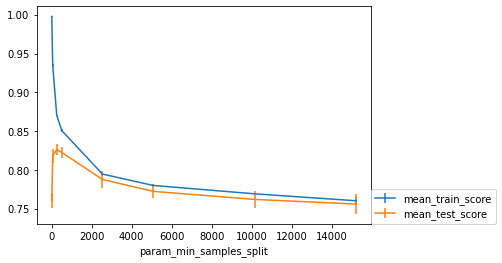

In [26]:
scores.plot(x='param_min_samples_split', y='mean_train_score', yerr='std_train_score', ax=plt.gca())
scores.plot(x='param_min_samples_split', y='mean_test_score', yerr='std_test_score', ax=plt.gca())
plt.legend(loc=(1, 0))

In [27]:
model = grid.best_estimator_
model.fit(Xtrain,ytrain)
y_pred = model.predict(Xtest)

print('Balanced accuracy for Xtest',balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.8272808074795533
              precision    recall  f1-score   support

           0       0.36      0.96      0.52       157
           1       0.95      0.74      0.83      4044
           2       0.45      0.78      0.57       869

    accuracy                           0.75      5070
   macro avg       0.59      0.83      0.64      5070
weighted avg       0.84      0.75      0.78      5070



#### CART with Thresholding of the decision tree's depth

In [8]:
param_grid = {'max_depth':  np.linspace(5, 100, 20).astype(int)}

grid = GridSearchCV(DecisionTreeClassifier(criterion = 'entropy', random_state=1, class_weight = 'balanced'),
                    param_grid=param_grid, 
                    scoring = 'balanced_accuracy', 
                    verbose = 3,
                    cv=StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1), 
                    return_train_score=True)

grid.fit(Xtrain, ytrain)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV 1/5] END ...max_depth=5;, score=(train=0.776, test=0.774) total time=   1.2s
[CV 2/5] END ...max_depth=5;, score=(train=0.778, test=0.779) total time=   1.3s
[CV 3/5] END ...max_depth=5;, score=(train=0.767, test=0.745) total time=   1.5s
[CV 4/5] END ...max_depth=5;, score=(train=0.777, test=0.771) total time=   1.5s
[CV 5/5] END ...max_depth=5;, score=(train=0.777, test=0.760) total time=   1.1s
[CV 1/5] END ..max_depth=10;, score=(train=0.854, test=0.797) total time=   2.4s
[CV 2/5] END ..max_depth=10;, score=(train=0.856, test=0.786) total time=   3.1s
[CV 3/5] END ..max_depth=10;, score=(train=0.848, test=0.777) total time=   2.5s
[CV 4/5] END ..max_depth=10;, score=(train=0.853, test=0.822) total time=   2.3s
[CV 5/5] END ..max_depth=10;, score=(train=0.856, test=0.787) total time=   2.5s
[CV 1/5] END ..max_depth=15;, score=(train=0.907, test=0.802) total time=   2.8s
[CV 2/5] END ..max_depth=15;, score=(train=0.90

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=1, test_size=0.1,
            train_size=None),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='entropy',
                                              random_state=1),
             param_grid={'max_depth': array([  5,  10,  15,  20,  25,  30,  35,  40,  45,  50,  55,  60,  65,
        70,  75,  80,  85,  90,  95, 100])},
             return_train_score=True, scoring='balanced_accuracy', verbose=3)

In [9]:
scores = pd.DataFrame(grid.cv_results_)
print(scores['mean_test_score'])
acc = np.max(scores['mean_test_score'])
print(grid.best_params_)
print('Model Performance evaluated by cross validation (balanced accuracy) =', acc)

0     0.765655
1     0.793700
2     0.803596
3     0.799375
4     0.789510
5     0.772797
6     0.768592
7     0.761553
8     0.758596
9     0.762210
10    0.760517
11    0.760517
12    0.760517
13    0.760517
14    0.760517
15    0.760517
16    0.760517
17    0.760517
18    0.760517
19    0.760517
Name: mean_test_score, dtype: float64
{'max_depth': 15}
Model Performance evaluated by cross validation (balanced accuracy) = 0.8035955882204145


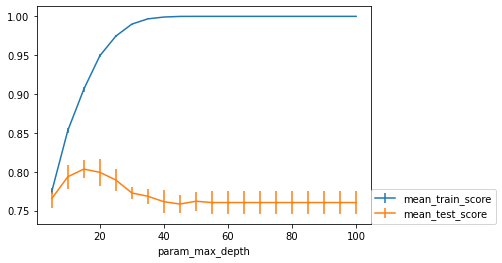

In [10]:
scores.plot(x='param_max_depth', y='mean_train_score', yerr='std_train_score', ax=plt.gca())
scores.plot(x='param_max_depth', y='mean_test_score', yerr='std_test_score', ax=plt.gca())
plt.legend(loc=(1, 0))

In [32]:
model = grid.best_estimator_
model.fit(Xtrain,ytrain)
y_pred = model.predict(Xtest)

print('Balanced accuracy for Xtest', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.7940215732387436
              precision    recall  f1-score   support

           0       0.73      0.78      0.75       157
           1       0.96      0.72      0.82      4044
           2       0.41      0.89      0.56       869

    accuracy                           0.75      5070
   macro avg       0.70      0.79      0.71      5070
weighted avg       0.86      0.75      0.77      5070



#### GridSearch for minimum samples required for split and maximum depth

In [33]:
param_grid = {'min_samples_split':  np.array([5, 50, 254, 507]),
              'max_depth':  np.linspace(5, 100, 20).astype(int)}

grid = GridSearchCV(DecisionTreeClassifier(criterion = 'entropy', random_state=1, class_weight = 'balanced'),
                    param_grid=param_grid, 
                    scoring = 'balanced_accuracy', 
                    verbose = 3,
                    cv=StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1), 
                    return_train_score=True)

grid.fit(Xtrain, ytrain)


Fitting 5 folds for each of 80 candidates, totalling 400 fits
[CV 1/5] END max_depth=5, min_samples_split=5;, score=(train=0.776, test=0.774) total time=   0.7s
[CV 2/5] END max_depth=5, min_samples_split=5;, score=(train=0.778, test=0.779) total time=   0.6s
[CV 3/5] END max_depth=5, min_samples_split=5;, score=(train=0.767, test=0.745) total time=   1.2s
[CV 4/5] END max_depth=5, min_samples_split=5;, score=(train=0.777, test=0.771) total time=   1.4s
[CV 5/5] END max_depth=5, min_samples_split=5;, score=(train=0.777, test=0.760) total time=   1.4s
[CV 1/5] END max_depth=5, min_samples_split=50;, score=(train=0.776, test=0.774) total time=   1.4s
[CV 2/5] END max_depth=5, min_samples_split=50;, score=(train=0.778, test=0.783) total time=   0.9s
[CV 3/5] END max_depth=5, min_samples_split=50;, score=(train=0.767, test=0.745) total time=   0.6s
[CV 4/5] END max_depth=5, min_samples_split=50;, score=(train=0.777, test=0.771) total time=   0.6s
[CV 5/5] END max_depth=5, min_samples_split

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=1, test_size=0.1,
            train_size=None),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='entropy',
                                              random_state=1),
             param_grid={'max_depth': array([  5,  10,  15,  20,  25,  30,  35,  40,  45,  50,  55,  60,  65,
        70,  75,  80,  85,  90,  95, 100]),
                         'min_samples_split': array([  5,  50, 254, 507])},
             return_train_score=True, scoring='balanced_accuracy', verbose=3)

In [34]:
scores = pd.DataFrame(grid.cv_results_)
print(scores['mean_test_score'])
acc = np.max(scores['mean_test_score'])
print(grid.best_params_)
print('Model Performance evaluated by cross validation (balanced accuracy) =', acc)

0     0.765655
1     0.766564
2     0.767871
3     0.764375
4     0.791104
        ...   
75    0.822477
76    0.760738
77    0.817841
78    0.826410
79    0.822477
Name: mean_test_score, Length: 80, dtype: float64
{'max_depth': 15, 'min_samples_split': 254}
Model Performance evaluated by cross validation (balanced accuracy) = 0.8293358367600543


Balanced accuracy for Xtest 0.8313947410154152
              precision    recall  f1-score   support

           0       0.36      0.96      0.52       157
           1       0.96      0.68      0.80      4044
           2       0.41      0.85      0.56       869

    accuracy                           0.72      5070
   macro avg       0.58      0.83      0.63      5070
weighted avg       0.85      0.72      0.75      5070



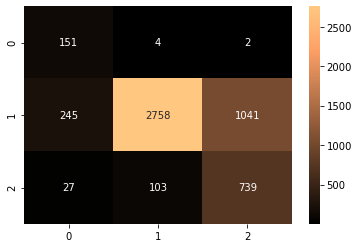

In [37]:
model = grid.best_estimator_
model.fit(Xtrain,ytrain)
y_pred = model.predict(Xtest)

print('Balanced accuracy for Xtest', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))
conf_matrix = confusion_matrix(ytest, y_pred)
sns.heatmap(conf_matrix, annot=True,fmt='d', cmap=plt.cm.copper)
plt.show()

#### CART with regularization criteria

In [38]:
clf = DecisionTreeClassifier(random_state=1, criterion = 'entropy')
path = clf.cost_complexity_pruning_path(Xtrain, ytrain)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

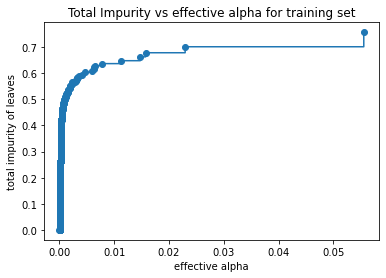

In [39]:
plt.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
plt.xlabel("effective alpha")
plt.ylabel("total impurity of leaves")
plt.title("Total Impurity vs effective alpha for training set")
plt.show()

In [40]:
param_grid = {'ccp_alpha': np.linspace(0., 0.03, 20)}

grid = GridSearchCV(DecisionTreeClassifier(criterion = 'entropy', random_state=1, class_weight = 'balanced'),
                    param_grid=param_grid, 
                    scoring = 'balanced_accuracy', 
                    verbose = 3,
                    cv=StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1), 
                    return_train_score=True)

grid.fit(Xtrain, ytrain)


Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV 1/5] END .ccp_alpha=0.0;, score=(train=1.000, test=0.762) total time=   2.3s
[CV 2/5] END .ccp_alpha=0.0;, score=(train=1.000, test=0.762) total time=   2.2s
[CV 3/5] END .ccp_alpha=0.0;, score=(train=1.000, test=0.738) total time=   3.8s
[CV 4/5] END .ccp_alpha=0.0;, score=(train=1.000, test=0.784) total time=   4.4s
[CV 5/5] END .ccp_alpha=0.0;, score=(train=1.000, test=0.757) total time=   2.3s
[CV 1/5] END ccp_alpha=0.0015789473684210526;, score=(train=0.841, test=0.813) total time=   2.4s
[CV 2/5] END ccp_alpha=0.0015789473684210526;, score=(train=0.843, test=0.825) total time=   2.9s
[CV 3/5] END ccp_alpha=0.0015789473684210526;, score=(train=0.842, test=0.807) total time=   4.7s
[CV 4/5] END ccp_alpha=0.0015789473684210526;, score=(train=0.842, test=0.828) total time=   4.3s
[CV 5/5] END ccp_alpha=0.0015789473684210526;, score=(train=0.841, test=0.815) total time=   3.0s
[CV 1/5] END ccp_alpha=0.003157894736842105

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=1, test_size=0.1,
            train_size=None),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='entropy',
                                              random_state=1),
             param_grid={'ccp_alpha': array([0.        , 0.00157895, 0.00315789, 0.00473684, 0.00631579,
       0.00789474, 0.00947368, 0.01105263, 0.01263158, 0.01421053,
       0.01578947, 0.01736842, 0.01894737, 0.02052632, 0.02210526,
       0.02368421, 0.02526316, 0.02684211, 0.02842105, 0.03      ])},
             return_train_score=True, scoring='balanced_accuracy', verbose=3)

In [41]:
scores = pd.DataFrame(grid.cv_results_)
print(scores['mean_test_score'])
acc = np.max(scores['mean_test_score'])
print(grid.best_params_)
print('Model Performance evaluated by cross validation (balanced accuracy) =', acc)

0     0.760517
1     0.817727
2     0.803710
3     0.783449
4     0.775525
5     0.762433
6     0.759731
7     0.758515
8     0.757149
9     0.757149
10    0.754564
11    0.753561
12    0.754660
13    0.754660
14    0.754660
15    0.754660
16    0.752229
17    0.746880
18    0.743697
19    0.743697
Name: mean_test_score, dtype: float64
{'ccp_alpha': 0.0015789473684210526}
Model Performance evaluated by cross validation (balanced accuracy) = 0.8177270189745297


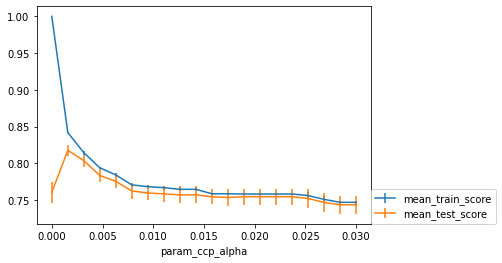

In [42]:
scores.plot(x='param_ccp_alpha', y='mean_train_score', yerr='std_train_score', ax=plt.gca())
scores.plot(x='param_ccp_alpha', y='mean_test_score', yerr='std_test_score', ax=plt.gca())
plt.legend(loc=(1, 0))

In [43]:
model = grid.best_estimator_
model.fit(Xtrain,ytrain)
y_pred = model.predict(Xtest)

print('Balanced accuracy for Xtest', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.8172723097776528
              precision    recall  f1-score   support

           0       0.43      0.96      0.59       157
           1       0.95      0.65      0.78      4044
           2       0.38      0.84      0.52       869

    accuracy                           0.70      5070
   macro avg       0.59      0.82      0.63      5070
weighted avg       0.84      0.70      0.73      5070



## Random Forest 

#### Random Classifier model with default parameters 

In [44]:
classifier = RandomForestClassifier(random_state=1)
classifier.fit(Xtrain, ytrain)

y_pred = classifier.predict(Xtest) 

print('Balanced accuracy for Xtest', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.7786543337712996
              precision    recall  f1-score   support

           0       0.87      0.82      0.84       157
           1       0.90      0.97      0.94      4044
           2       0.83      0.54      0.66       869

    accuracy                           0.89      5070
   macro avg       0.87      0.78      0.81      5070
weighted avg       0.89      0.89      0.89      5070



In [45]:
scores = cross_val_score(classifier, x_train_dataset, y_train_dataset, scoring = 'balanced_accuracy', cv = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1))

print('Model Performance evaluated by cross validation (balanced accuracy) =', np.mean(scores))

Model Performance evaluated by cross validation (balanced accuracy) = 0.7711208986833291


In [46]:
classifier = RandomForestClassifier(class_weight = 'balanced', random_state=1)
classifier.fit(Xtrain, ytrain)

y_pred = classifier.predict(Xtest) 
print('Balanced accuracy for Xtest', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.7808852282236366
              precision    recall  f1-score   support

           0       0.89      0.83      0.86       157
           1       0.90      0.97      0.94      4044
           2       0.82      0.54      0.65       869

    accuracy                           0.89      5070
   macro avg       0.87      0.78      0.82      5070
weighted avg       0.89      0.89      0.88      5070



In [47]:
scores = cross_val_score(classifier, x_train_dataset, y_train_dataset, scoring = 'balanced_accuracy', cv = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1))

print('Model Performance evaluated by cross validation (balanced accuracy) =', np.mean(scores))

Model Performance evaluated by cross validation (balanced accuracy) = 0.7658932596993433


In [48]:
classifier = RandomForestClassifier(criterion = 'entropy', 
                                    class_weight = 'balanced',
                                    random_state=1)
classifier.fit(Xtrain, ytrain)

y_pred = classifier.predict(Xtest) 

print('Balanced accuracy for Xtest',balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.7906784740585958
              precision    recall  f1-score   support

           0       0.90      0.82      0.86       157
           1       0.91      0.97      0.94      4044
           2       0.81      0.58      0.68       869

    accuracy                           0.90      5070
   macro avg       0.87      0.79      0.82      5070
weighted avg       0.89      0.90      0.89      5070



In [49]:
scores = cross_val_score(classifier, x_train_dataset, y_train_dataset, scoring = 'balanced_accuracy', cv = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1))

print('Model Performance evaluated by cross validation (balanced accuracy) =', np.mean(scores))

Model Performance evaluated by cross validation (balanced accuracy) = 0.7789689455268951


Balanced accuracy for Xtest 0.8710398060166508
              precision    recall  f1-score   support

           0       0.47      0.99      0.64       157
           1       0.97      0.73      0.83      4044
           2       0.45      0.89      0.60       869

    accuracy                           0.76      5070
   macro avg       0.63      0.87      0.69      5070
weighted avg       0.87      0.76      0.79      5070



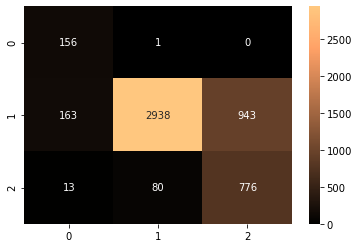

In [11]:
classifier = RandomForestClassifier(criterion = 'entropy', 
                                    max_depth = 15, 
                                    min_samples_split = 254,
                                    class_weight = 'balanced',
                                    random_state=1)
classifier.fit(Xtrain, ytrain)

y_pred = classifier.predict(Xtest) 

print('Balanced accuracy for Xtest', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))
conf_matrix = confusion_matrix(ytest, y_pred)
sns.heatmap(conf_matrix, annot=True,fmt='d', cmap=plt.cm.copper)
plt.show()

In [12]:
scores = cross_val_score(classifier, x_train_dataset, y_train_dataset, scoring = 'balanced_accuracy', cv = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1))

print('Model Performance evaluated by cross validation (balanced accuracy) =', np.mean(scores))

Model Performance evaluated by cross validation (balanced accuracy) = 0.8625824525887353


In [20]:
Xtrain, Xtest, ytrain, ytest = train_test_split(x_train_dataset, y_train_dataset, test_size = 0.1, random_state=1, stratify = y_train_dataset)

param_grid = {'min_samples_split':  [5, 50, 254, 507],
              'max_depth':  np.linspace(5, 100, 20).astype(int)}

grid = GridSearchCV(RandomForestClassifier(criterion = 'entropy', random_state=1, class_weight = 'balanced'),
                    param_grid=param_grid, 
                    scoring = 'balanced_accuracy', 
                    verbose = 3,
                    cv=StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1), 
                    return_train_score=True)

grid.fit(Xtrain, ytrain)


Fitting 5 folds for each of 80 candidates, totalling 400 fits
[CV 1/5] END max_depth=5, min_samples_split=5;, score=(train=0.807, test=0.807) total time=  10.2s
[CV 2/5] END max_depth=5, min_samples_split=5;, score=(train=0.808, test=0.802) total time=  13.1s
[CV 3/5] END max_depth=5, min_samples_split=5;, score=(train=0.809, test=0.796) total time=  11.2s
[CV 4/5] END max_depth=5, min_samples_split=5;, score=(train=0.807, test=0.805) total time=  11.2s
[CV 5/5] END max_depth=5, min_samples_split=5;, score=(train=0.808, test=0.793) total time=  12.1s
[CV 1/5] END max_depth=5, min_samples_split=50;, score=(train=0.806, test=0.805) total time=  10.9s
[CV 2/5] END max_depth=5, min_samples_split=50;, score=(train=0.807, test=0.802) total time=  12.0s
[CV 3/5] END max_depth=5, min_samples_split=50;, score=(train=0.808, test=0.798) total time=  11.0s
[CV 4/5] END max_depth=5, min_samples_split=50;, score=(train=0.807, test=0.805) total time=   9.0s
[CV 5/5] END max_depth=5, min_samples_split

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=1, test_size=0.1,
            train_size=None),
             estimator=RandomForestClassifier(class_weight='balanced',
                                              criterion='entropy',
                                              random_state=1),
             param_grid={'max_depth': array([  5,  10,  15,  20,  25,  30,  35,  40,  45,  50,  55,  60,  65,
        70,  75,  80,  85,  90,  95, 100]),
                         'min_samples_split': [5, 50, 254, 507]},
             return_train_score=True, scoring='balanced_accuracy', verbose=3)

In [21]:
scores = pd.DataFrame(grid.cv_results_)
print(scores['mean_test_score'])
acc = np.max(scores['mean_test_score'])
print(grid.best_params_)
print('Model Performance evaluated by cross validation (balanced accuracy) =', acc)

0     0.800725
1     0.800723
2     0.795863
3     0.791131
4     0.837787
        ...   
75    0.846014
76    0.806631
77    0.876781
78    0.863737
79    0.846014
Name: mean_test_score, Length: 80, dtype: float64
{'max_depth': 25, 'min_samples_split': 50}
Model Performance evaluated by cross validation (balanced accuracy) = 0.8789240653437865


Balanced accuracy for Xtest 0.8862769081417724
              precision    recall  f1-score   support

           0       0.62      0.95      0.75       157
           1       0.96      0.86      0.91      4044
           2       0.61      0.85      0.71       869

    accuracy                           0.86      5070
   macro avg       0.73      0.89      0.79      5070
weighted avg       0.89      0.86      0.87      5070



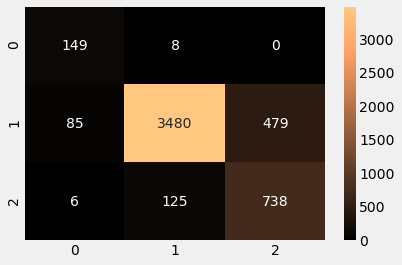

In [22]:
model = grid.best_estimator_
model.fit(Xtrain,ytrain)
y_pred = model.predict(Xtest)

print('Balanced accuracy for Xtest', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))
conf_matrix = confusion_matrix(ytest, y_pred)
sns.heatmap(conf_matrix, annot=True,fmt='d', cmap=plt.cm.copper)
plt.show()

In [54]:
classifier = RandomForestClassifier(criterion = 'entropy', 
                                    ccp_alpha = 0.0015789, 
                                    class_weight = 'balanced',
                                    random_state=1)
classifier.fit(Xtrain, ytrain)

y_pred = classifier.predict(Xtest) 

print('Balanced accuracy for Xtest', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.849404124862453
              precision    recall  f1-score   support

           0       0.52      0.99      0.68       157
           1       0.96      0.69      0.81      4044
           2       0.40      0.87      0.55       869

    accuracy                           0.73      5070
   macro avg       0.63      0.85      0.68      5070
weighted avg       0.85      0.73      0.76      5070



In [55]:
scores = cross_val_score(classifier, x_train_dataset, y_train_dataset, scoring = 'balanced_accuracy', cv = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1))

print('Model Performance evaluated by cross validation (balanced accuracy) =', np.mean(scores))

Model Performance evaluated by cross validation (balanced accuracy) = 0.848176520663279


In [56]:
classifier = RandomForestClassifier(criterion = 'entropy', 
                                    max_depth = 15, 
                                    min_samples_split = 254,
                                    ccp_alpha = 0.0015789,
                                    class_weight = 'balanced',
                                    random_state=1)
classifier.fit(Xtrain, ytrain)

y_pred = classifier.predict(Xtest) 

print('Balanced accuracy for Xtest', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.8490576928821505
              precision    recall  f1-score   support

           0       0.47      0.99      0.64       157
           1       0.96      0.69      0.80      4044
           2       0.41      0.87      0.55       869

    accuracy                           0.73      5070
   macro avg       0.61      0.85      0.66      5070
weighted avg       0.85      0.73      0.76      5070



In [57]:
scores = cross_val_score(classifier, x_train_dataset, y_train_dataset, scoring = 'balanced_accuracy', cv = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1))

print('Model Performance evaluated by cross validation (balanced accuracy) =', np.mean(scores))

Model Performance evaluated by cross validation (balanced accuracy) = 0.8429658417521265


#### Build Random Forest model on selected features

In [58]:
classifier = RandomForestClassifier(criterion = 'entropy', 
                                    max_depth = 15, 
                                    min_samples_split = 254,
                                    class_weight = 'balanced',
                                    random_state=1)
classifier.fit(Xtrain, ytrain)

y_pred = classifier.predict(Xtest) 

print('Balanced accuracy for Xtest',balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.8710398060166508
              precision    recall  f1-score   support

           0       0.47      0.99      0.64       157
           1       0.97      0.73      0.83      4044
           2       0.45      0.89      0.60       869

    accuracy                           0.76      5070
   macro avg       0.63      0.87      0.69      5070
weighted avg       0.87      0.76      0.79      5070



In [59]:
feature_imp = pd.Series(classifier.feature_importances_, index = np.arange(0, 75).astype(str)).sort_values(ascending=False)
print(feature_imp)
print(np.argsort(classifier.feature_importances_))

19    0.079017
38    0.076908
23    0.060216
20    0.058174
35    0.057720
        ...   
71    0.002455
43    0.002225
62    0.002214
28    0.002178
10    0.002053
Length: 75, dtype: float64
[10 28 62 43 71 44 49 67 65  9 59 68 13  6 24 46 74 55 39 64 70 48 47  3
 61 56 29  7 15 14 58 11 73  4 54 16 25 27  0 42 45  2  1 51 12 52 72  5
 40 69 30 66 57 17  8 31 63 32 50 60 41 53 21 18 36 26 33 37 22 34 35 20
 23 38 19]


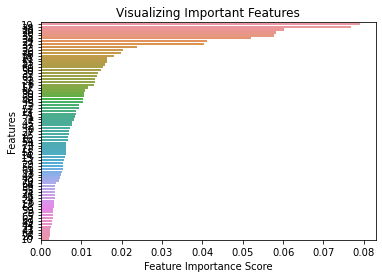

In [60]:
%matplotlib inline
# Creating a bar plot
sns.barplot(x=feature_imp, y = feature_imp.index)

# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show()

In [61]:
order_features_importance = np.argsort(classifier.feature_importances_) 
print(order_features_importance)

old_acc = balanced_accuracy_score(ytest,y_pred)
print(old_acc)

[10 28 62 43 71 44 49 67 65  9 59 68 13  6 24 46 74 55 39 64 70 48 47  3
 61 56 29  7 15 14 58 11 73  4 54 16 25 27  0 42 45  2  1 51 12 52 72  5
 40 69 30 66 57 17  8 31 63 32 50 60 41 53 21 18 36 26 33 37 22 34 35 20
 23 38 19]
0.8710398060166508


In [62]:
for idx_feature in range(len(order_features_importance)):
    features_ignored = order_features_importance[:idx_feature+1]
    print(features_ignored)
    
    Xtrain_new = np.delete(Xtrain, features_ignored, 1)
    Xtest_new = np.delete(Xtest, features_ignored, 1)
    
    classifier.fit(Xtrain_new, ytrain)

    y_pred_new = classifier.predict(Xtest_new) 

    current_acc = balanced_accuracy_score(ytest,y_pred_new)
    print(current_acc)
    if current_acc < old_acc:
        break
    else: 
        old_acc = current_acc 

[10]
0.8714804897574885
[10 28]
0.8676010624993485


## SVM 

In [52]:
Xtrain, Xtest, ytrain, ytest = train_test_split(x_train_dataset_n, y_train_dataset, test_size = 0.1, random_state=1, stratify = y_train_dataset)

linear = SVC(kernel='linear', C=1, class_weight = 'balanced', max_iter = 10000).fit(Xtrain, ytrain)

y_pred = linear.predict(Xtest)

print('Balanced accuracy for Xtest',balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

C:\Users\maria\anaconda3\lib\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


0.5758517562278546
              precision    recall  f1-score   support

           0       0.58      0.75      0.66       157
           1       0.78      0.10      0.18      4044
           2       0.17      0.87      0.29       869

    accuracy                           0.26      5070
   macro avg       0.51      0.58      0.38      5070
weighted avg       0.67      0.26      0.22      5070



## k-nearest neighbours 

Balanced accuracy for Xtest 0.8980857941455084
              precision    recall  f1-score   support

           0       0.87      0.86      0.87       157
           1       0.97      0.94      0.96      4044
           2       0.79      0.89      0.84       869

    accuracy                           0.93      5070
   macro avg       0.88      0.90      0.89      5070
weighted avg       0.94      0.93      0.93      5070



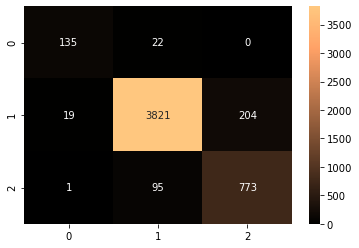

In [63]:
Xtrain, Xtest, ytrain, ytest = train_test_split(x_train_dataset_n, y_train_dataset, test_size = 0.1, random_state=1, stratify = y_train_dataset)

neigh = KNeighborsClassifier(n_neighbors = 3)
neigh.fit(Xtrain, ytrain)
y_pred = neigh.predict(Xtest)

print('Balanced accuracy for Xtest',balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))
conf_matrix = confusion_matrix(ytest, y_pred)
sns.heatmap(conf_matrix, annot=True,fmt='d', cmap=plt.cm.copper)
plt.show()

In [64]:
param_grid = {"n_neighbors": list(range(2, 11))}

grid = GridSearchCV(KNeighborsClassifier(),
                    param_grid=param_grid, 
                    scoring = 'balanced_accuracy', 
                    verbose = 3,
                    cv=StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1), 
                    return_train_score=True)

grid.fit(Xtrain, ytrain)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END .n_neighbors=2;, score=(train=0.947, test=0.870) total time=   0.5s
[CV 2/5] END .n_neighbors=2;, score=(train=0.948, test=0.864) total time=   0.6s
[CV 3/5] END .n_neighbors=2;, score=(train=0.947, test=0.852) total time=   0.5s
[CV 4/5] END .n_neighbors=2;, score=(train=0.947, test=0.875) total time=   0.8s
[CV 5/5] END .n_neighbors=2;, score=(train=0.948, test=0.862) total time=   0.5s
[CV 1/5] END .n_neighbors=3;, score=(train=0.938, test=0.877) total time=   1.1s
[CV 2/5] END .n_neighbors=3;, score=(train=0.939, test=0.850) total time=   0.6s
[CV 3/5] END .n_neighbors=3;, score=(train=0.940, test=0.863) total time=   0.9s
[CV 4/5] END .n_neighbors=3;, score=(train=0.942, test=0.903) total time=   0.5s
[CV 5/5] END .n_neighbors=3;, score=(train=0.942, test=0.866) total time=   0.9s
[CV 1/5] END .n_neighbors=4;, score=(train=0.920, test=0.862) total time=   0.6s
[CV 2/5] END .n_neighbors=4;, score=(train=0.919,

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=1, test_size=0.1,
            train_size=None),
             estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9, 10]},
             return_train_score=True, scoring='balanced_accuracy', verbose=3)

In [65]:
scores = pd.DataFrame(grid.cv_results_)
print(scores['mean_test_score'])
acc = np.max(scores['mean_test_score'])
print(grid.best_params_)
print('Model Performance evaluated by cross validation (balanced accuracy) =', acc)

0    0.864383
1    0.871832
2    0.857465
3    0.864207
4    0.853997
5    0.852882
6    0.845568
7    0.843016
8    0.839013
Name: mean_test_score, dtype: float64
{'n_neighbors': 3}
Model Performance evaluated by cross validation (balanced accuracy) = 0.871831995198226


In [66]:
model = grid.best_estimator_
model.fit(Xtrain,ytrain)
y_pred = model.predict(Xtest)

print('Balanced accuracy for Xtest',balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.8980857941455084
              precision    recall  f1-score   support

           0       0.87      0.86      0.87       157
           1       0.97      0.94      0.96      4044
           2       0.79      0.89      0.84       869

    accuracy                           0.93      5070
   macro avg       0.88      0.90      0.89      5070
weighted avg       0.94      0.93      0.93      5070



In [67]:
param_grid = {"weights": ["uniform", "distance"]}

grid = GridSearchCV(KNeighborsClassifier(n_neighbors = 3),
                    param_grid=param_grid, 
                    scoring = 'balanced_accuracy', 
                    verbose = 3,
                    cv=StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1), 
                    return_train_score=True)

grid.fit(Xtrain, ytrain)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV 1/5] END weights=uniform;, score=(train=0.938, test=0.877) total time=   0.5s
[CV 2/5] END weights=uniform;, score=(train=0.939, test=0.850) total time=   1.0s
[CV 3/5] END weights=uniform;, score=(train=0.940, test=0.863) total time=   0.5s
[CV 4/5] END weights=uniform;, score=(train=0.942, test=0.903) total time=   0.6s
[CV 5/5] END weights=uniform;, score=(train=0.942, test=0.866) total time=   1.3s
[CV 1/5] END weights=distance;, score=(train=1.000, test=0.878) total time=   0.9s
[CV 2/5] END weights=distance;, score=(train=1.000, test=0.851) total time=   1.0s
[CV 3/5] END weights=distance;, score=(train=1.000, test=0.858) total time=   0.9s
[CV 4/5] END weights=distance;, score=(train=1.000, test=0.903) total time=   0.8s
[CV 5/5] END weights=distance;, score=(train=1.000, test=0.864) total time=   0.5s


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=1, test_size=0.1,
            train_size=None),
             estimator=KNeighborsClassifier(n_neighbors=3),
             param_grid={'weights': ['uniform', 'distance']},
             return_train_score=True, scoring='balanced_accuracy', verbose=3)

In [68]:
scores = pd.DataFrame(grid.cv_results_)
print(scores['mean_test_score'])
acc = np.max(scores['mean_test_score'])
print(grid.best_params_)
print('Model Performance evaluated by cross validation (balanced accuracy) =', acc)

0    0.871832
1    0.870809
Name: mean_test_score, dtype: float64
{'weights': 'uniform'}
Model Performance evaluated by cross validation (balanced accuracy) = 0.871831995198226


In [69]:
model = grid.best_estimator_
model.fit(Xtrain,ytrain)
y_pred = model.predict(Xtest)

print('Balanced accuracy for Xtest',balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.8980857941455084
              precision    recall  f1-score   support

           0       0.87      0.86      0.87       157
           1       0.97      0.94      0.96      4044
           2       0.79      0.89      0.84       869

    accuracy                           0.93      5070
   macro avg       0.88      0.90      0.89      5070
weighted avg       0.94      0.93      0.93      5070



#### KNN with Bagging 

In [70]:
bagged_knn = KNeighborsClassifier(n_neighbors=3, weights='distance')

In [71]:
bagging_model = BaggingClassifier(bagged_knn, n_estimators=20, random_state = 1)

bagging_model.fit(Xtrain, ytrain)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=3,
                                                      weights='distance'),
                  n_estimators=20, random_state=1)

In [73]:
y_pred = bagging_model.predict(Xtest)

print('Balanced accuracy for Xtest', balanced_accuracy_score(ytest,y_pred))
print(classification_report(ytest,y_pred))

Balanced accuracy for Xtest 0.8958246738327583
              precision    recall  f1-score   support

           0       0.88      0.87      0.87       157
           1       0.97      0.94      0.96      4044
           2       0.79      0.88      0.83       869

    accuracy                           0.93      5070
   macro avg       0.88      0.90      0.89      5070
weighted avg       0.93      0.93      0.93      5070



In [74]:
scores = cross_val_score(BaggingClassifier(bagged_knn, n_estimators=20, random_state = 1), x_train_dataset_n, y_train_dataset, scoring = 'balanced_accuracy', cv = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1))

print('Model Performance evaluated by cross validation (balanced accuracy) =', np.mean(scores))

Model Performance evaluated by cross validation (balanced accuracy) = 0.8764881734092423


## Logistic Regression

In [75]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression(max_iter = 1000)

scores = cross_val_score(classifier, x_train_dataset_n, y_train_dataset, scoring = 'balanced_accuracy', cv = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1))

print('Model Performance evaluated by cross validation (balanced accuracy) =', np.mean(scores))

Model Performance evaluated by cross validation (balanced accuracy) = 0.5966608669747281


## 5. Convolutional Neural Networks

In [269]:
#Reshape data
x_train_dataset_CNN = x_train_dataset.reshape((-1,5, 5, 3))
x_test_CNN = x_test.reshape(-1, 5, 5, 3)
print('Xtrain shape: ',x_train_dataset_CNN.shape)
print('Xtest shape: ', x_test_CNN.shape)

Xtrain shape:  (50700, 5, 5, 3)
Xtest shape:  (33800, 5, 5, 3)


In [279]:
def CNN_model(model, x_train_dataset, y_train_dataset, epochs, batch_size, patience):

    class_names = ['Center', 'Rings', 'Background']
    
    x_train_dataset_CNN = x_train_dataset.reshape((-1,5, 5, 3))
    
    x_train_dataset_CNN = x_train_dataset_CNN.astype('float32')
    x_train_dataset_CNN = x_train_dataset_CNN / 255.
    
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset_CNN, y_train_dataset, test_size=0.1, stratify = y_train_dataset)
    
    y_val_ground = Ytest
    
    # Convert labels into one-hot-encoding format
    Ytrain = to_categorical(Ytrain)
    Ytest = to_categorical(Ytest)
    
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)
        
    # como tf.keras.optimizers.SGD 
    model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False), optimizer=keras.optimizers.Adam(),metrics=['categorical_accuracy'])
    
    train = model.fit(Xtrain, Ytrain, batch_size=batch_size, epochs=epochs, verbose = 1, callbacks=[es], validation_data=(Xtest, Ytest))
            
    test_loss, test_acc = model.evaluate(Xtest,  Ytest, verbose=0)
    
    # predicting the testing set
    ypred = model.predict(Xtest)

    y_test = []

    for i in range(len(ypred)):
        y_test.append(np.argmax(ypred[i]))
    
    balacc = balanced_accuracy_score(y_val_ground, y_test)

    print('\nTest categorical accuracy:', test_acc)
    print('\n Balanced accuracy:', balacc)
    
    # ---------- plot learning curves:
    # Plot the training and validation data
    tacc=train.history['categorical_accuracy']
    tloss=train.history['loss']
    vacc=train.history['val_categorical_accuracy']
    vloss=train.history['val_loss']
    
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1)
    vc_label='best epoch= '+ str(index_acc + 1)
    
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
    axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training categorical accuracy score')
    axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation categorical accuracy score')
    axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation categorical accuracy score')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('categorical accuracy score')
    axes[1].legend()
    plt.tight_layout
    plt.show()
    # -------------------
    
    clr = classification_report(y_val_ground, y_test, target_names=class_names)
    print("Classification Report:\n----------------------\n", clr)
    
    return balacc

### CNN model #1

Epoch 1/20
713/713 [==============================] - 8s 10ms/step - loss: 0.4274 - categorical_accuracy: 0.8228 - val_loss: 0.3197 - val_categorical_accuracy: 0.8570
Epoch 2/20
713/713 [==============================] - 5s 6ms/step - loss: 0.3163 - categorical_accuracy: 0.8552 - val_loss: 0.2955 - val_categorical_accuracy: 0.8682
Epoch 3/20
713/713 [==============================] - 4s 6ms/step - loss: 0.2969 - categorical_accuracy: 0.8642 - val_loss: 0.2874 - val_categorical_accuracy: 0.8667
Epoch 4/20
713/713 [==============================] - 7s 10ms/step - loss: 0.2822 - categorical_accuracy: 0.8710 - val_loss: 0.3399 - val_categorical_accuracy: 0.8290
Epoch 5/20
713/713 [==============================] - 5s 7ms/step - loss: 0.2721 - categorical_accuracy: 0.8748 - val_loss: 0.2611 - val_categorical_accuracy: 0.8795
Epoch 6/20
713/713 [==============================] - 5s 7ms/step - loss: 0.2646 - categorical_accuracy: 0.8782 - val_loss: 0.3187 - val_categorical_accuracy: 0.8487
Ep

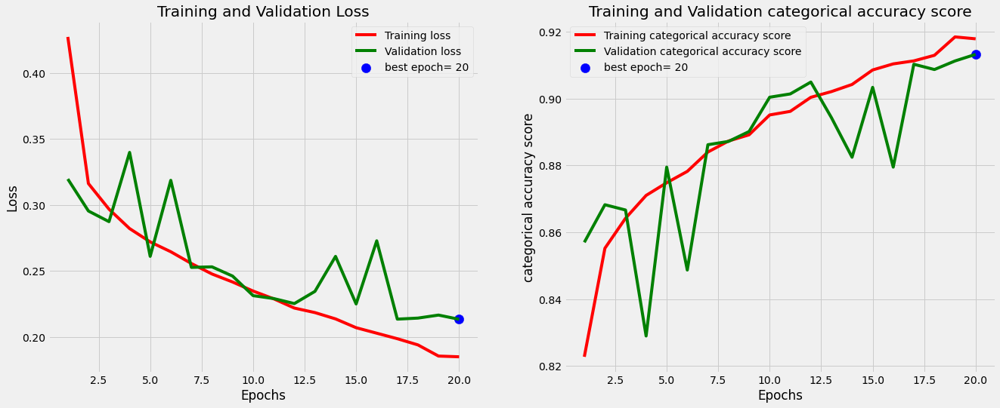

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.82      0.94      0.88       157
       Rings       0.95      0.94      0.95      4044
  Background       0.77      0.77      0.77       869

    accuracy                           0.91      5070
   macro avg       0.85      0.88      0.86      5070
weighted avg       0.91      0.91      0.91      5070

Epoch 1/20
713/713 [==============================] - 5s 7ms/step - loss: 0.4318 - categorical_accuracy: 0.8221 - val_loss: 0.3308 - val_categorical_accuracy: 0.8556
Epoch 2/20
713/713 [==============================] - 8s 11ms/step - loss: 0.3261 - categorical_accuracy: 0.8496 - val_loss: 0.2943 - val_categorical_accuracy: 0.8682
Epoch 3/20
713/713 [==============================] - 4s 6ms/step - loss: 0.3049 - categorical_accuracy: 0.8584 - val_loss: 0.3121 - val_categorical_accuracy: 0.8493
Epoch 4/20
713/713 [==============================] - 6s 8ms/step - loss:

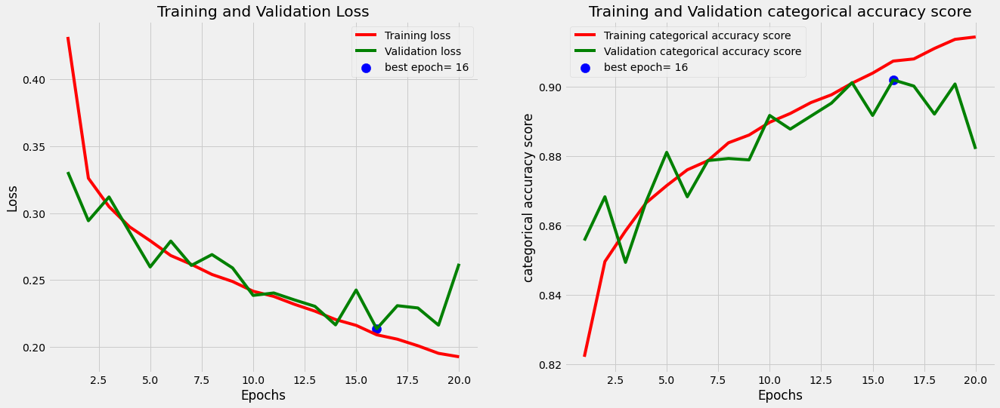

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.88      0.84      0.86       157
       Rings       0.88      0.99      0.93      4044
  Background       0.90      0.40      0.56       869

    accuracy                           0.88      5070
   macro avg       0.89      0.74      0.78      5070
weighted avg       0.88      0.88      0.86      5070

Epoch 1/20
713/713 [==============================] - 7s 9ms/step - loss: 0.4168 - categorical_accuracy: 0.8253 - val_loss: 0.3488 - val_categorical_accuracy: 0.8345
Epoch 2/20
713/713 [==============================] - 5s 7ms/step - loss: 0.3181 - categorical_accuracy: 0.8549 - val_loss: 0.2852 - val_categorical_accuracy: 0.8716
Epoch 3/20
713/713 [==============================] - 6s 9ms/step - loss: 0.2996 - categorical_accuracy: 0.8635 - val_loss: 0.2887 - val_categorical_accuracy: 0.8615
Epoch 4/20
713/713 [==============================] - 6s 8ms/step - loss: 

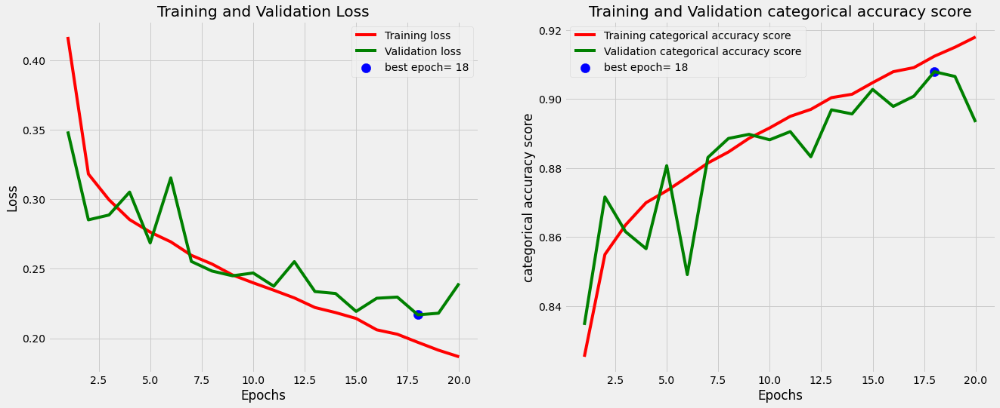

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.80      0.93      0.86       157
       Rings       0.90      0.97      0.94      4044
  Background       0.85      0.52      0.65       869

    accuracy                           0.89      5070
   macro avg       0.85      0.81      0.81      5070
weighted avg       0.89      0.89      0.88      5070

Epoch 1/20
713/713 [==============================] - 5s 6ms/step - loss: 0.4188 - categorical_accuracy: 0.8245 - val_loss: 0.3143 - val_categorical_accuracy: 0.8564
Epoch 2/20
713/713 [==============================] - 6s 8ms/step - loss: 0.3207 - categorical_accuracy: 0.8548 - val_loss: 0.2907 - val_categorical_accuracy: 0.8621
Epoch 3/20
713/713 [==============================] - 7s 10ms/step - loss: 0.2972 - categorical_accuracy: 0.8643 - val_loss: 0.3077 - val_categorical_accuracy: 0.8544
Epoch 4/20
713/713 [==============================] - 4s 5ms/step - loss:

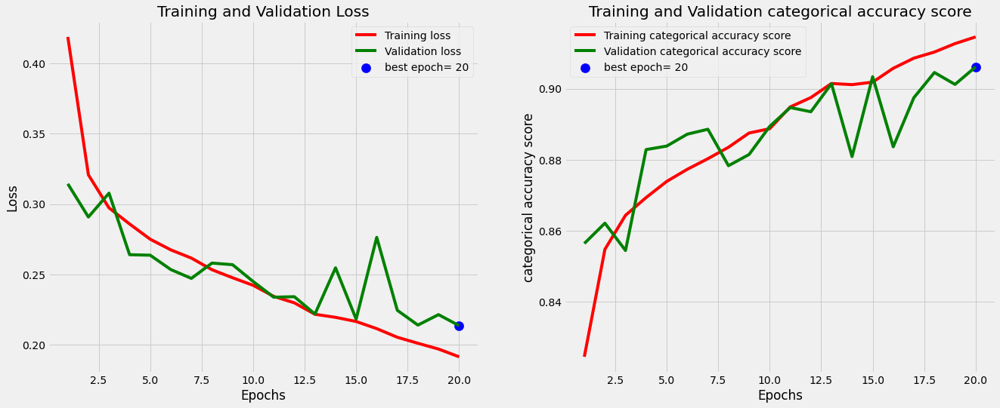

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.90      0.90      0.90       157
       Rings       0.93      0.95      0.94      4044
  Background       0.77      0.70      0.73       869

    accuracy                           0.91      5070
   macro avg       0.87      0.85      0.86      5070
weighted avg       0.90      0.91      0.90      5070

Epoch 1/20
713/713 [==============================] - 5s 6ms/step - loss: 0.4181 - categorical_accuracy: 0.8247 - val_loss: 0.3220 - val_categorical_accuracy: 0.8454
Epoch 2/20
713/713 [==============================] - 8s 11ms/step - loss: 0.3193 - categorical_accuracy: 0.8540 - val_loss: 0.2874 - val_categorical_accuracy: 0.8708
Epoch 3/20
713/713 [==============================] - 5s 7ms/step - loss: 0.3008 - categorical_accuracy: 0.8614 - val_loss: 0.2870 - val_categorical_accuracy: 0.8728
Epoch 4/20
713/713 [==============================] - 6s 8ms/step - loss:

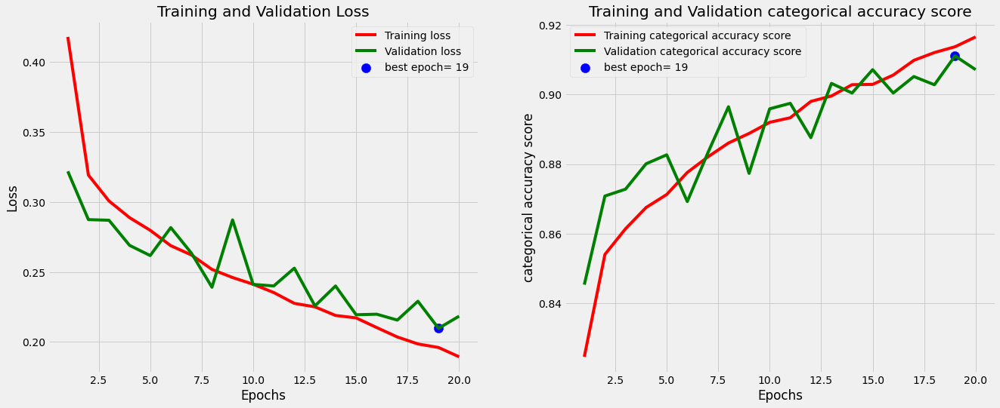

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.91      0.87      0.89       157
       Rings       0.93      0.96      0.94      4044
  Background       0.78      0.69      0.73       869

    accuracy                           0.91      5070
   macro avg       0.88      0.84      0.86      5070
weighted avg       0.90      0.91      0.90      5070

Model Performance (balanced accuracy) =  0.8250135131889355


In [271]:
#Define parameters
batch_size = 64
epochs = 20
patience = 5

acc_scores = []
for i in range(5):
    
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters=32, kernel_size=(3, 3),activation= LeakyReLU(alpha=0.1),input_shape=(5, 5, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D((2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(64, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
    cnn.add(Conv2D(128, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(3, activation='softmax')) #Output layer
    
    acc = CNN_model(cnn, x_train_dataset, y_train_dataset, epochs, batch_size, patience)
    acc_scores.append(acc)

acc = np.mean(acc_scores)
print("Model Performance (balanced accuracy) = ", acc)

### CNN model #2

Epoch 1/20
713/713 [==============================] - 4s 5ms/step - loss: 0.4185 - categorical_accuracy: 0.8270 - val_loss: 0.3224 - val_categorical_accuracy: 0.8542
Epoch 2/20
713/713 [==============================] - 4s 5ms/step - loss: 0.3242 - categorical_accuracy: 0.8536 - val_loss: 0.3281 - val_categorical_accuracy: 0.8507
Epoch 3/20
713/713 [==============================] - 6s 8ms/step - loss: 0.3052 - categorical_accuracy: 0.8606 - val_loss: 0.3015 - val_categorical_accuracy: 0.8669
Epoch 4/20
713/713 [==============================] - 4s 5ms/step - loss: 0.2938 - categorical_accuracy: 0.8667 - val_loss: 0.2901 - val_categorical_accuracy: 0.8667
Epoch 5/20
713/713 [==============================] - 4s 5ms/step - loss: 0.2855 - categorical_accuracy: 0.8702 - val_loss: 0.2705 - val_categorical_accuracy: 0.8777
Epoch 6/20
713/713 [==============================] - 5s 7ms/step - loss: 0.2772 - categorical_accuracy: 0.8736 - val_loss: 0.2820 - val_categorical_accuracy: 0.8714
Epoc

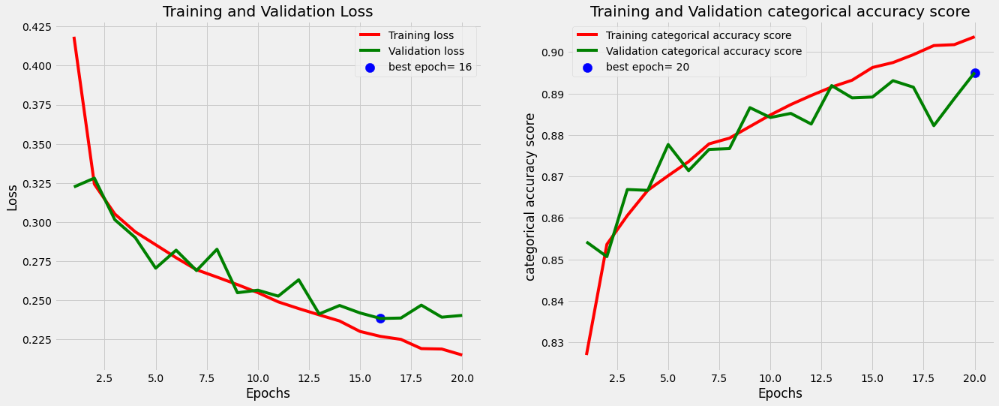

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.90      0.78      0.84       157
       Rings       0.93      0.93      0.93      4044
  Background       0.71      0.74      0.73       869

    accuracy                           0.90      5070
   macro avg       0.85      0.82      0.83      5070
weighted avg       0.90      0.90      0.90      5070

Epoch 1/20
713/713 [==============================] - 6s 8ms/step - loss: 0.4350 - categorical_accuracy: 0.8216 - val_loss: 0.3321 - val_categorical_accuracy: 0.8548
Epoch 2/20
713/713 [==============================] - 4s 5ms/step - loss: 0.3273 - categorical_accuracy: 0.8533 - val_loss: 0.3046 - val_categorical_accuracy: 0.8641
Epoch 3/20
713/713 [==============================] - 4s 5ms/step - loss: 0.3063 - categorical_accuracy: 0.8606 - val_loss: 0.3164 - val_categorical_accuracy: 0.8651
Epoch 4/20
713/713 [==============================] - 4s 6ms/step - loss: 

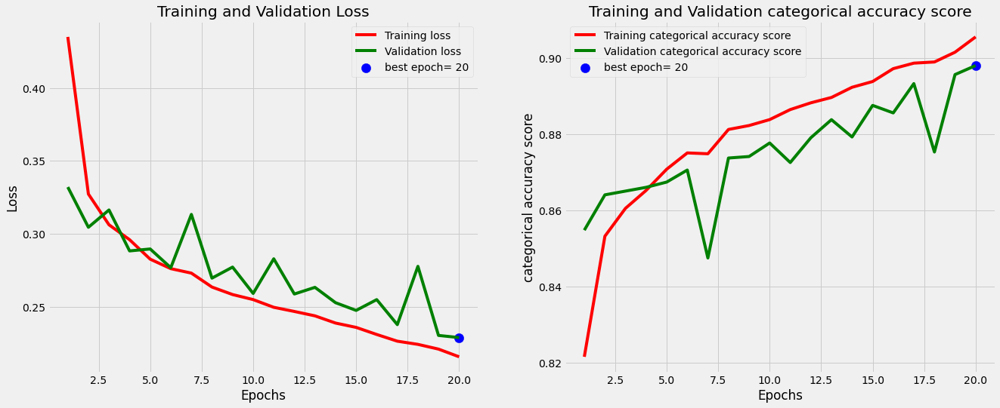

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.85      0.90      0.88       157
       Rings       0.93      0.94      0.94      4044
  Background       0.74      0.70      0.72       869

    accuracy                           0.90      5070
   macro avg       0.84      0.85      0.84      5070
weighted avg       0.90      0.90      0.90      5070

Epoch 1/20
713/713 [==============================] - 6s 8ms/step - loss: 0.4209 - categorical_accuracy: 0.8252 - val_loss: 0.4366 - val_categorical_accuracy: 0.8136
Epoch 2/20
713/713 [==============================] - 5s 7ms/step - loss: 0.3221 - categorical_accuracy: 0.8561 - val_loss: 0.3111 - val_categorical_accuracy: 0.8600
Epoch 3/20
713/713 [==============================] - 5s 7ms/step - loss: 0.3063 - categorical_accuracy: 0.8621 - val_loss: 0.3103 - val_categorical_accuracy: 0.8572
Epoch 4/20
713/713 [==============================] - 6s 9ms/step - loss: 

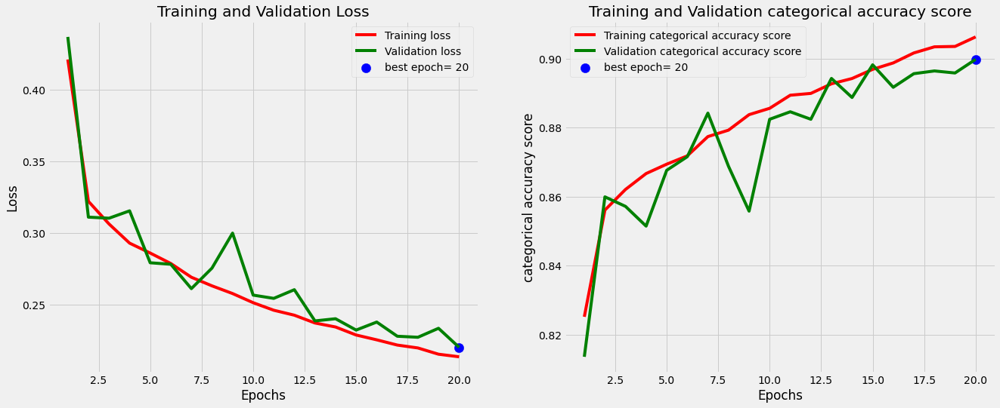

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.81      0.90      0.85       157
       Rings       0.93      0.95      0.94      4044
  Background       0.76      0.68      0.72       869

    accuracy                           0.90      5070
   macro avg       0.83      0.84      0.84      5070
weighted avg       0.90      0.90      0.90      5070

Epoch 1/20
713/713 [==============================] - 5s 7ms/step - loss: 0.4317 - categorical_accuracy: 0.8235 - val_loss: 0.3428 - val_categorical_accuracy: 0.8560
Epoch 2/20
713/713 [==============================] - 5s 7ms/step - loss: 0.3335 - categorical_accuracy: 0.8497 - val_loss: 0.3068 - val_categorical_accuracy: 0.8663
Epoch 3/20
713/713 [==============================] - 4s 5ms/step - loss: 0.3096 - categorical_accuracy: 0.8611 - val_loss: 0.2939 - val_categorical_accuracy: 0.8643
Epoch 4/20
713/713 [==============================] - 5s 7ms/step - loss: 

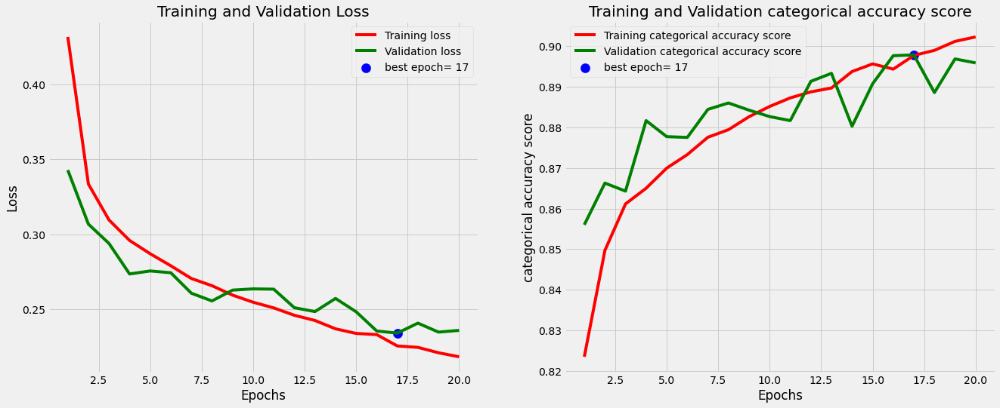

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.93      0.87      0.90       157
       Rings       0.94      0.93      0.93      4044
  Background       0.70      0.75      0.72       869

    accuracy                           0.90      5070
   macro avg       0.86      0.85      0.85      5070
weighted avg       0.90      0.90      0.90      5070

Epoch 1/20
713/713 [==============================] - 4s 5ms/step - loss: 0.4365 - categorical_accuracy: 0.8181 - val_loss: 0.3815 - val_categorical_accuracy: 0.8170
Epoch 2/20
713/713 [==============================] - 3s 4ms/step - loss: 0.3339 - categorical_accuracy: 0.8488 - val_loss: 0.3115 - val_categorical_accuracy: 0.8600
Epoch 3/20
713/713 [==============================] - 4s 6ms/step - loss: 0.3086 - categorical_accuracy: 0.8587 - val_loss: 0.2874 - val_categorical_accuracy: 0.8736
Epoch 4/20
713/713 [==============================] - 6s 9ms/step - loss: 

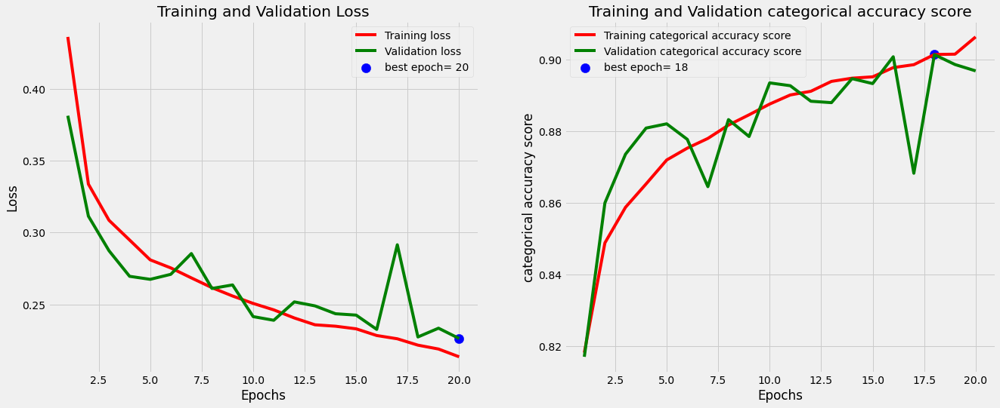

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.80      0.87      0.83       157
       Rings       0.92      0.96      0.94      4044
  Background       0.79      0.62      0.70       869

    accuracy                           0.90      5070
   macro avg       0.84      0.82      0.82      5070
weighted avg       0.89      0.90      0.89      5070

Model Performance (balanced accuracy) =  0.8343116102521373


In [280]:
#Define parameters
batch_size = 64
epochs = 20
patience = 5

acc_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters = 32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(5, 5, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(filters = 64, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(3, activation='softmax')) #Output layer
    
    acc = CNN_model(cnn, x_train_dataset, y_train_dataset, epochs, batch_size, patience)
    acc_scores.append(acc)

acc = np.mean(acc_scores)
print("Model Performance (balanced accuracy) = ", acc)

### CNN model #3

Epoch 1/20
713/713 [==============================] - 5s 6ms/step - loss: 0.4349 - categorical_accuracy: 0.8215 - val_loss: 0.3445 - val_categorical_accuracy: 0.8588
Epoch 2/20
713/713 [==============================] - 6s 9ms/step - loss: 0.3235 - categorical_accuracy: 0.8548 - val_loss: 0.3118 - val_categorical_accuracy: 0.8682
Epoch 3/20
713/713 [==============================] - 4s 5ms/step - loss: 0.3067 - categorical_accuracy: 0.8618 - val_loss: 0.3209 - val_categorical_accuracy: 0.8535
Epoch 4/20
713/713 [==============================] - 4s 6ms/step - loss: 0.2953 - categorical_accuracy: 0.8653 - val_loss: 0.3090 - val_categorical_accuracy: 0.8574
Epoch 5/20
713/713 [==============================] - 6s 9ms/step - loss: 0.2846 - categorical_accuracy: 0.8692 - val_loss: 0.2999 - val_categorical_accuracy: 0.8659
Epoch 6/20
713/713 [==============================] - 4s 5ms/step - loss: 0.2780 - categorical_accuracy: 0.8737 - val_loss: 0.2774 - val_categorical_accuracy: 0.8730
Epoc

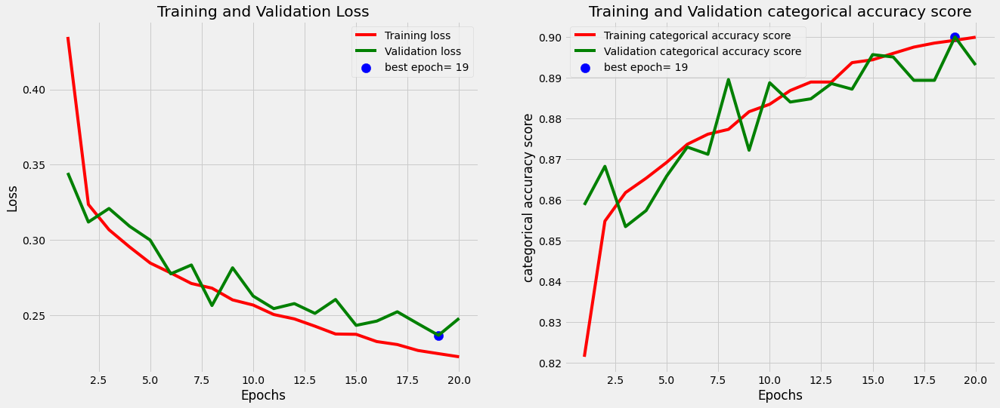

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.90      0.78      0.84       157
       Rings       0.91      0.96      0.94      4044
  Background       0.80      0.58      0.67       869

    accuracy                           0.89      5070
   macro avg       0.87      0.78      0.81      5070
weighted avg       0.89      0.89      0.89      5070

Epoch 1/20
713/713 [==============================] - 6s 7ms/step - loss: 0.4367 - categorical_accuracy: 0.8207 - val_loss: 0.3401 - val_categorical_accuracy: 0.8503
Epoch 2/20
713/713 [==============================] - 4s 5ms/step - loss: 0.3256 - categorical_accuracy: 0.8515 - val_loss: 0.3146 - val_categorical_accuracy: 0.8629
Epoch 3/20
713/713 [==============================] - 5s 7ms/step - loss: 0.3048 - categorical_accuracy: 0.8614 - val_loss: 0.3067 - val_categorical_accuracy: 0.8649
Epoch 4/20
713/713 [==============================] - 6s 9ms/step - loss: 

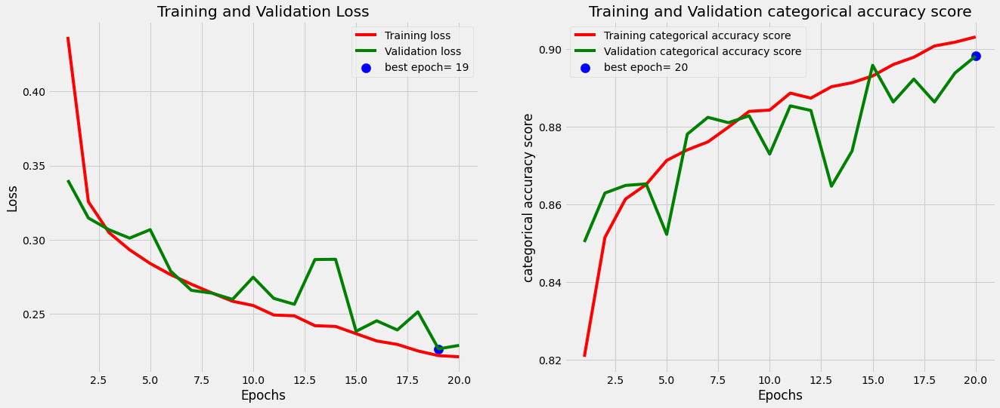

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.84      0.94      0.89       157
       Rings       0.93      0.95      0.94      4044
  Background       0.76      0.67      0.71       869

    accuracy                           0.90      5070
   macro avg       0.84      0.85      0.84      5070
weighted avg       0.90      0.90      0.90      5070

Epoch 1/20
713/713 [==============================] - 5s 6ms/step - loss: 0.4312 - categorical_accuracy: 0.8196 - val_loss: 0.3859 - val_categorical_accuracy: 0.8231
Epoch 2/20
713/713 [==============================] - 6s 8ms/step - loss: 0.3307 - categorical_accuracy: 0.8500 - val_loss: 0.3159 - val_categorical_accuracy: 0.8625
Epoch 3/20
713/713 [==============================] - 6s 8ms/step - loss: 0.3086 - categorical_accuracy: 0.8598 - val_loss: 0.3130 - val_categorical_accuracy: 0.8607
Epoch 4/20
713/713 [==============================] - 5s 7ms/step - loss: 

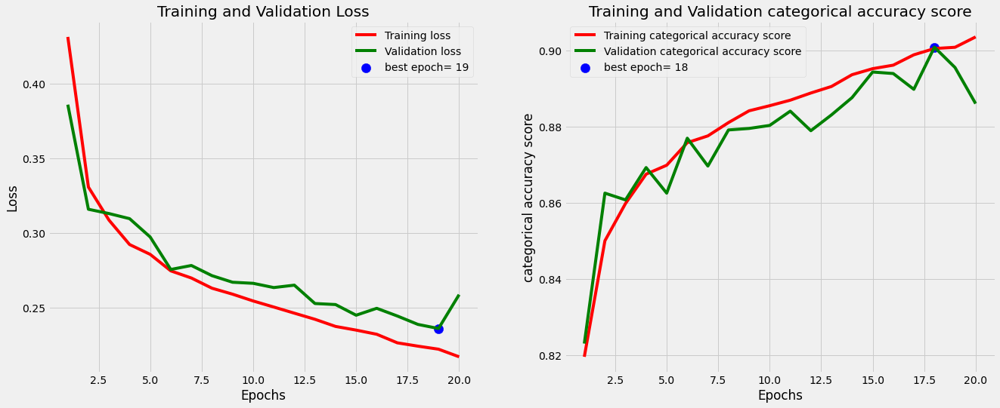

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.85      0.88      0.87       157
       Rings       0.96      0.90      0.93      4044
  Background       0.65      0.83      0.73       869

    accuracy                           0.89      5070
   macro avg       0.82      0.87      0.84      5070
weighted avg       0.90      0.89      0.89      5070

Epoch 1/20
713/713 [==============================] - 6s 8ms/step - loss: 0.4377 - categorical_accuracy: 0.8206 - val_loss: 0.3530 - val_categorical_accuracy: 0.8268
Epoch 2/20
713/713 [==============================] - 4s 6ms/step - loss: 0.3305 - categorical_accuracy: 0.8490 - val_loss: 0.3056 - val_categorical_accuracy: 0.8609
Epoch 3/20
713/713 [==============================] - 4s 6ms/step - loss: 0.3090 - categorical_accuracy: 0.8597 - val_loss: 0.2911 - val_categorical_accuracy: 0.8722
Epoch 4/20
713/713 [==============================] - 5s 6ms/step - loss: 

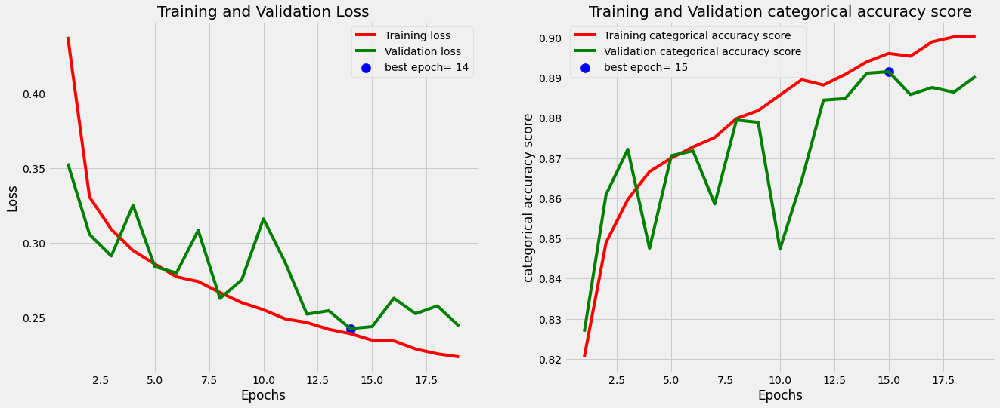

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.84      0.85      0.84       157
       Rings       0.94      0.92      0.93      4044
  Background       0.69      0.75      0.72       869

    accuracy                           0.89      5070
   macro avg       0.82      0.84      0.83      5070
weighted avg       0.89      0.89      0.89      5070

Epoch 1/20
713/713 [==============================] - 4s 5ms/step - loss: 0.4303 - categorical_accuracy: 0.8221 - val_loss: 0.3392 - val_categorical_accuracy: 0.8527
Epoch 2/20
713/713 [==============================] - 4s 6ms/step - loss: 0.3329 - categorical_accuracy: 0.8490 - val_loss: 0.2992 - val_categorical_accuracy: 0.8627
Epoch 3/20
713/713 [==============================] - 6s 8ms/step - loss: 0.3080 - categorical_accuracy: 0.8599 - val_loss: 0.3180 - val_categorical_accuracy: 0.8566
Epoch 4/20
713/713 [==============================] - 3s 4ms/step - loss: 

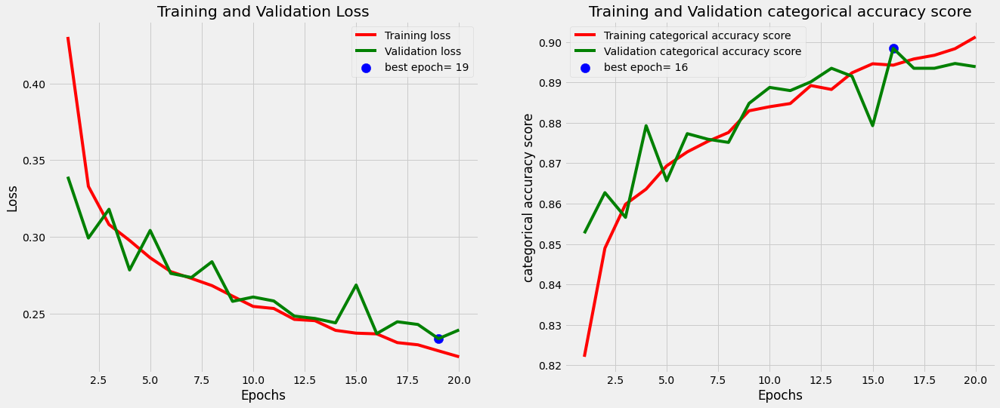

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.89      0.83      0.86       157
       Rings       0.93      0.94      0.93      4044
  Background       0.73      0.69      0.71       869

    accuracy                           0.89      5070
   macro avg       0.85      0.82      0.83      5070
weighted avg       0.89      0.89      0.89      5070

Model Performance (balanced accuracy) =  0.8308754719707989


In [282]:
#Define parameters
batch_size = 64
epochs = 20
patience = 5

acc_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters = 64, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(5, 5, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D(pool_size = (2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(filters = 32, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(3, activation='softmax')) #Output layer
    
    acc = CNN_model(cnn, x_train_dataset, y_train_dataset, epochs, batch_size, patience)
    acc_scores.append(acc)

acc = np.mean(acc_scores)
print("Model Performance (balanced accuracy) = ", acc)

### Test best CNN model (model #2) with different batch sizes

In [283]:
#Define parameters (increasing the batchsize)
batch_size = 128
epochs = 20
patience = 5

Epoch 1/20
357/357 [==============================] - 4s 10ms/step - loss: 0.4844 - categorical_accuracy: 0.8115 - val_loss: 0.3842 - val_categorical_accuracy: 0.8154
Epoch 2/20
357/357 [==============================] - 4s 12ms/step - loss: 0.3495 - categorical_accuracy: 0.8427 - val_loss: 0.3291 - val_categorical_accuracy: 0.8493
Epoch 3/20
357/357 [==============================] - 2s 6ms/step - loss: 0.3202 - categorical_accuracy: 0.8572 - val_loss: 0.3101 - val_categorical_accuracy: 0.8570
Epoch 4/20
357/357 [==============================] - 2s 6ms/step - loss: 0.3062 - categorical_accuracy: 0.8613 - val_loss: 0.3114 - val_categorical_accuracy: 0.8548
Epoch 5/20
357/357 [==============================] - 2s 6ms/step - loss: 0.2915 - categorical_accuracy: 0.8688 - val_loss: 0.2911 - val_categorical_accuracy: 0.8675
Epoch 6/20
357/357 [==============================] - 2s 7ms/step - loss: 0.2858 - categorical_accuracy: 0.8702 - val_loss: 0.2851 - val_categorical_accuracy: 0.8696
Ep

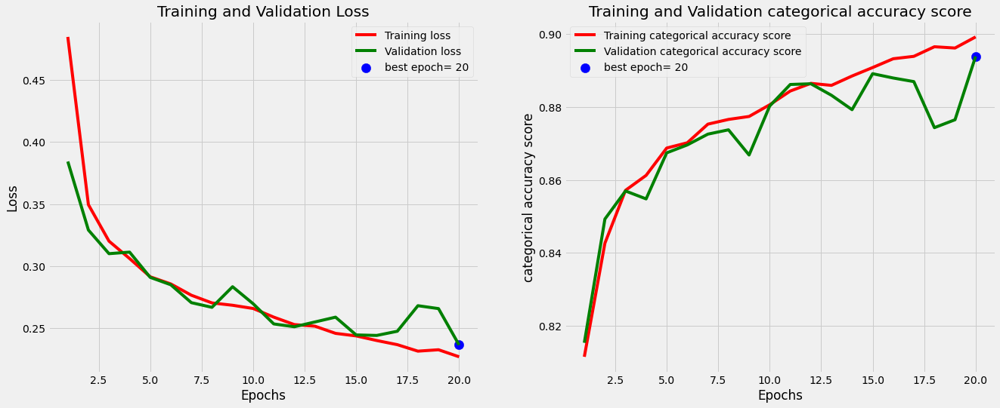

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.91      0.87      0.89       157
       Rings       0.94      0.92      0.93      4044
  Background       0.69      0.76      0.72       869

    accuracy                           0.89      5070
   macro avg       0.85      0.85      0.85      5070
weighted avg       0.90      0.89      0.90      5070

Epoch 1/20
357/357 [==============================] - 6s 14ms/step - loss: 0.4700 - categorical_accuracy: 0.8131 - val_loss: 0.3747 - val_categorical_accuracy: 0.8464
Epoch 2/20
357/357 [==============================] - 2s 6ms/step - loss: 0.3385 - categorical_accuracy: 0.8479 - val_loss: 0.3063 - val_categorical_accuracy: 0.8665
Epoch 3/20
357/357 [==============================] - 3s 8ms/step - loss: 0.3133 - categorical_accuracy: 0.8588 - val_loss: 0.3245 - val_categorical_accuracy: 0.8509
Epoch 4/20
357/357 [==============================] - 3s 8ms/step - loss:

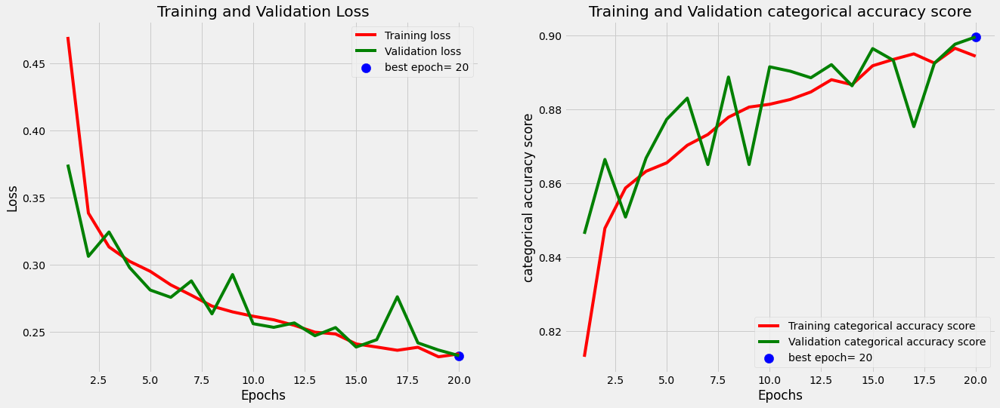

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.89      0.85      0.87       157
       Rings       0.92      0.95      0.94      4044
  Background       0.77      0.66      0.71       869

    accuracy                           0.90      5070
   macro avg       0.86      0.82      0.84      5070
weighted avg       0.90      0.90      0.90      5070

Epoch 1/20
357/357 [==============================] - 2s 6ms/step - loss: 0.4582 - categorical_accuracy: 0.8157 - val_loss: 0.3509 - val_categorical_accuracy: 0.8385
Epoch 2/20
357/357 [==============================] - 2s 6ms/step - loss: 0.3373 - categorical_accuracy: 0.8506 - val_loss: 0.3332 - val_categorical_accuracy: 0.8420
Epoch 3/20
357/357 [==============================] - 3s 7ms/step - loss: 0.3192 - categorical_accuracy: 0.8553 - val_loss: 0.3099 - val_categorical_accuracy: 0.8607
Epoch 4/20
357/357 [==============================] - 3s 8ms/step - loss: 

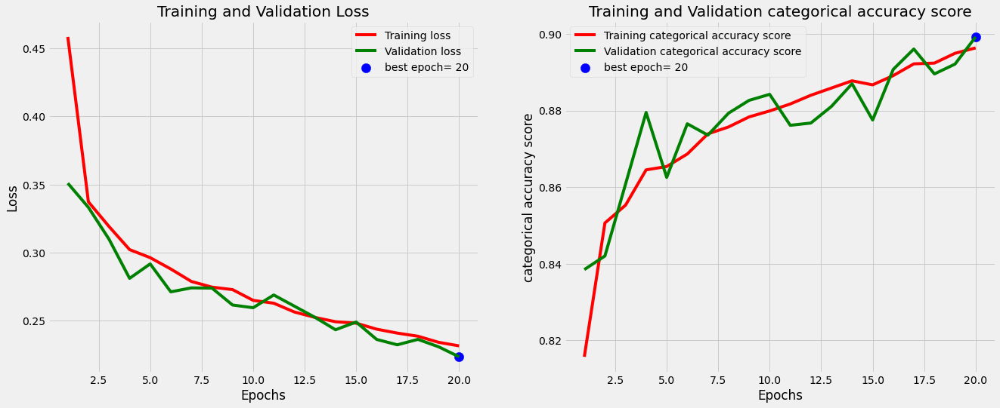

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.95      0.89      0.92       157
       Rings       0.94      0.94      0.94      4044
  Background       0.72      0.72      0.72       869

    accuracy                           0.90      5070
   macro avg       0.87      0.85      0.86      5070
weighted avg       0.90      0.90      0.90      5070

Epoch 1/20
357/357 [==============================] - 5s 11ms/step - loss: 0.4850 - categorical_accuracy: 0.8114 - val_loss: 0.3600 - val_categorical_accuracy: 0.8325
Epoch 2/20
357/357 [==============================] - 3s 7ms/step - loss: 0.3474 - categorical_accuracy: 0.8439 - val_loss: 0.3155 - val_categorical_accuracy: 0.8649
Epoch 3/20
357/357 [==============================] - 3s 8ms/step - loss: 0.3164 - categorical_accuracy: 0.8572 - val_loss: 0.3085 - val_categorical_accuracy: 0.8661
Epoch 4/20
357/357 [==============================] - 3s 7ms/step - loss:

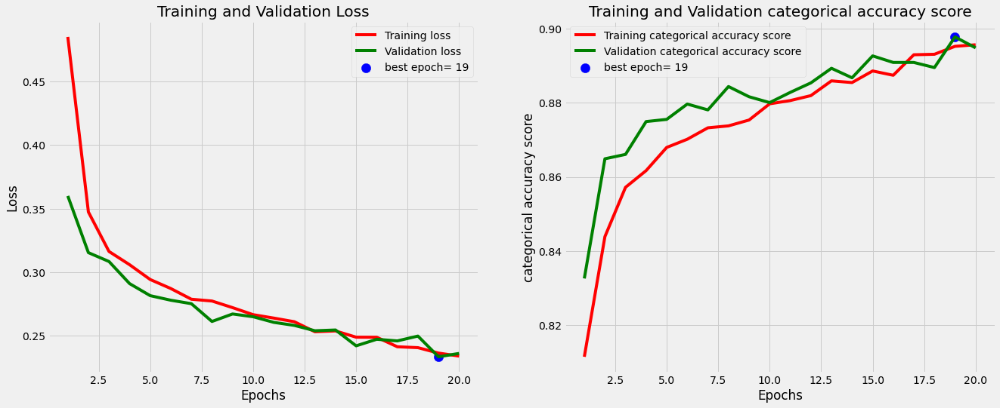

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.91      0.84      0.87       157
       Rings       0.91      0.96      0.94      4044
  Background       0.78      0.59      0.67       869

    accuracy                           0.89      5070
   macro avg       0.87      0.80      0.83      5070
weighted avg       0.89      0.89      0.89      5070

Epoch 1/20
357/357 [==============================] - 4s 10ms/step - loss: 0.4729 - categorical_accuracy: 0.8119 - val_loss: 0.3690 - val_categorical_accuracy: 0.8503
Epoch 2/20
357/357 [==============================] - 3s 9ms/step - loss: 0.3455 - categorical_accuracy: 0.8451 - val_loss: 0.3314 - val_categorical_accuracy: 0.8387
Epoch 3/20
357/357 [==============================] - 2s 5ms/step - loss: 0.3217 - categorical_accuracy: 0.8561 - val_loss: 0.3037 - val_categorical_accuracy: 0.8675
Epoch 4/20
357/357 [==============================] - 2s 7ms/step - loss:

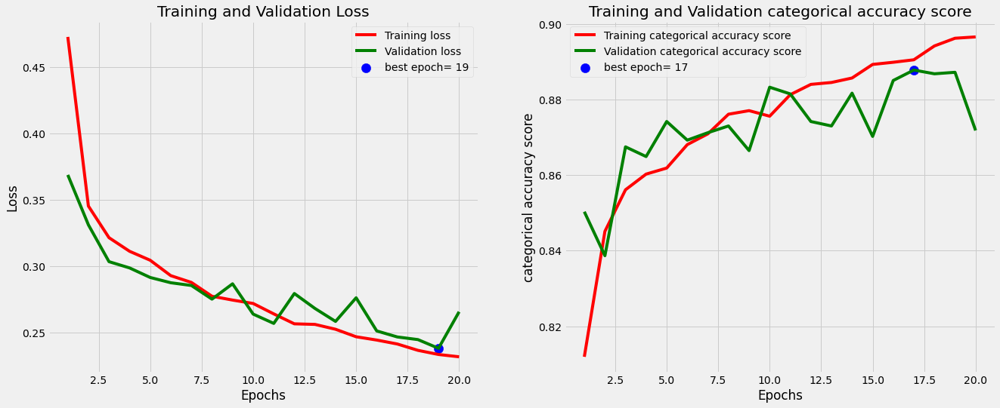

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.86      0.87      0.87       157
       Rings       0.87      0.98      0.92      4044
  Background       0.85      0.36      0.51       869

    accuracy                           0.87      5070
   macro avg       0.86      0.74      0.77      5070
weighted avg       0.87      0.87      0.85      5070

Model Performance (balanced accuracy) =  0.8112655896052562


In [284]:
acc_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters = 32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(5, 5, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(filters = 64, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(3, activation='softmax')) #Output layer
    
    acc = CNN_model(cnn, x_train_dataset, y_train_dataset, epochs, batch_size, patience)
    acc_scores.append(acc)

acc = np.mean(acc_scores)
print("Model Performance (balanced accuracy) = ", acc)

In [285]:
#Define parameters (decreasing the batchsize)
batch_size = 32
epochs = 20
patience = 5

Epoch 1/20
1426/1426 [==============================] - 5s 3ms/step - loss: 0.4079 - categorical_accuracy: 0.8251 - val_loss: 0.3473 - val_categorical_accuracy: 0.8452
Epoch 2/20
1426/1426 [==============================] - 5s 3ms/step - loss: 0.3202 - categorical_accuracy: 0.8547 - val_loss: 0.3157 - val_categorical_accuracy: 0.8586
Epoch 3/20
1426/1426 [==============================] - 6s 5ms/step - loss: 0.3016 - categorical_accuracy: 0.8636 - val_loss: 0.3184 - val_categorical_accuracy: 0.8519
Epoch 4/20
1426/1426 [==============================] - 4s 3ms/step - loss: 0.2877 - categorical_accuracy: 0.8684 - val_loss: 0.2959 - val_categorical_accuracy: 0.8655
Epoch 5/20
1426/1426 [==============================] - 5s 3ms/step - loss: 0.2784 - categorical_accuracy: 0.8732 - val_loss: 0.3305 - val_categorical_accuracy: 0.8444
Epoch 6/20
1426/1426 [==============================] - 7s 5ms/step - loss: 0.2700 - categorical_accuracy: 0.8774 - val_loss: 0.2741 - val_categorical_accuracy:

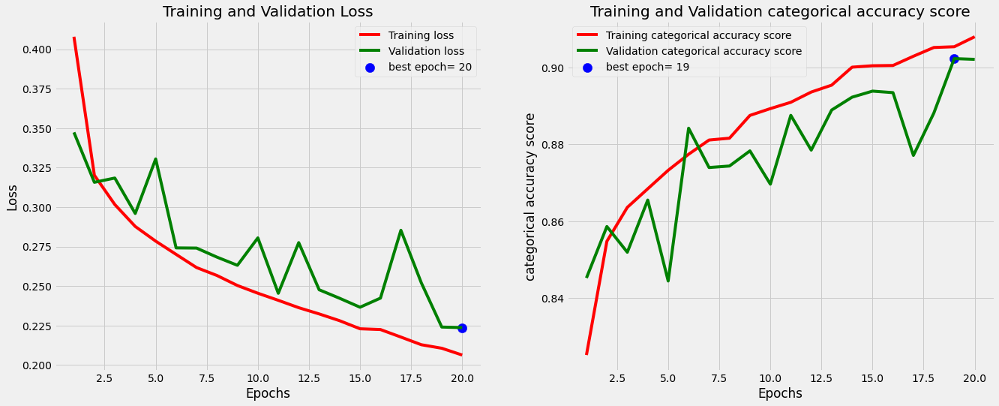

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.89      0.83      0.86       157
       Rings       0.94      0.94      0.94      4044
  Background       0.74      0.73      0.74       869

    accuracy                           0.90      5070
   macro avg       0.85      0.84      0.84      5070
weighted avg       0.90      0.90      0.90      5070

Epoch 1/20
1426/1426 [==============================] - 8s 5ms/step - loss: 0.3977 - categorical_accuracy: 0.8318 - val_loss: 0.3283 - val_categorical_accuracy: 0.8525
Epoch 2/20
1426/1426 [==============================] - 5s 3ms/step - loss: 0.3186 - categorical_accuracy: 0.8552 - val_loss: 0.3140 - val_categorical_accuracy: 0.8596
Epoch 3/20
1426/1426 [==============================] - 6s 4ms/step - loss: 0.2993 - categorical_accuracy: 0.8629 - val_loss: 0.3247 - val_categorical_accuracy: 0.8521
Epoch 4/20
1426/1426 [==============================] - 6s 4ms/step 

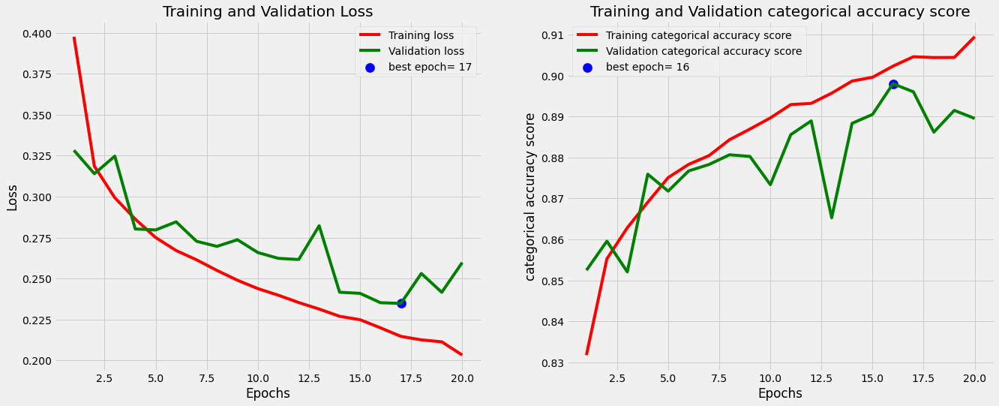

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.90      0.77      0.83       157
       Rings       0.90      0.97      0.93      4044
  Background       0.82      0.53      0.64       869

    accuracy                           0.89      5070
   macro avg       0.87      0.76      0.80      5070
weighted avg       0.88      0.89      0.88      5070

Epoch 1/20
1426/1426 [==============================] - 5s 3ms/step - loss: 0.4015 - categorical_accuracy: 0.8269 - val_loss: 0.3568 - val_categorical_accuracy: 0.8321
Epoch 2/20
1426/1426 [==============================] - 7s 5ms/step - loss: 0.3172 - categorical_accuracy: 0.8552 - val_loss: 0.2964 - val_categorical_accuracy: 0.8706
Epoch 3/20
1426/1426 [==============================] - 6s 4ms/step - loss: 0.3007 - categorical_accuracy: 0.8614 - val_loss: 0.2868 - val_categorical_accuracy: 0.8690
Epoch 4/20
1426/1426 [==============================] - 5s 3ms/step 

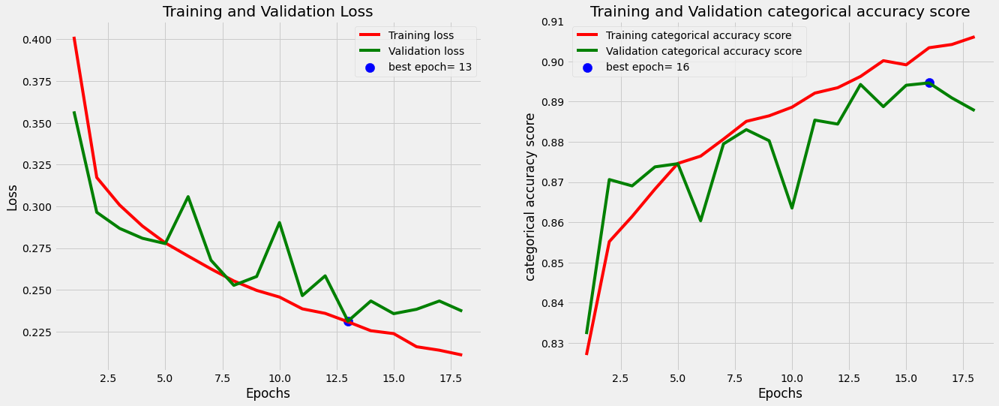

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.90      0.88      0.89       157
       Rings       0.94      0.92      0.93      4044
  Background       0.67      0.75      0.71       869

    accuracy                           0.89      5070
   macro avg       0.84      0.85      0.84      5070
weighted avg       0.89      0.89      0.89      5070

Epoch 1/20
1426/1426 [==============================] - 7s 5ms/step - loss: 0.3986 - categorical_accuracy: 0.8301 - val_loss: 0.3187 - val_categorical_accuracy: 0.8576
Epoch 2/20
1426/1426 [==============================] - 5s 3ms/step - loss: 0.3140 - categorical_accuracy: 0.8572 - val_loss: 0.3001 - val_categorical_accuracy: 0.8607
Epoch 3/20
1426/1426 [==============================] - 6s 4ms/step - loss: 0.3013 - categorical_accuracy: 0.8620 - val_loss: 0.3110 - val_categorical_accuracy: 0.8645
Epoch 4/20
1426/1426 [==============================] - 6s 4ms/step 

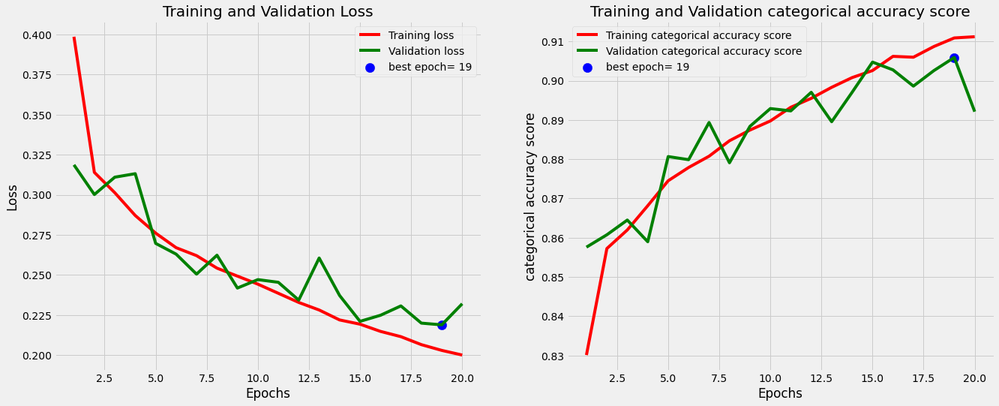

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.95      0.90      0.92       157
       Rings       0.96      0.91      0.93      4044
  Background       0.66      0.82      0.73       869

    accuracy                           0.89      5070
   macro avg       0.85      0.88      0.86      5070
weighted avg       0.90      0.89      0.90      5070

Epoch 1/20
1426/1426 [==============================] - 5s 3ms/step - loss: 0.4052 - categorical_accuracy: 0.8273 - val_loss: 0.3326 - val_categorical_accuracy: 0.8511
Epoch 2/20
1426/1426 [==============================] - 7s 5ms/step - loss: 0.3195 - categorical_accuracy: 0.8540 - val_loss: 0.2989 - val_categorical_accuracy: 0.8677
Epoch 3/20
1426/1426 [==============================] - 5s 4ms/step - loss: 0.2960 - categorical_accuracy: 0.8658 - val_loss: 0.2742 - val_categorical_accuracy: 0.8773
Epoch 4/20
1426/1426 [==============================] - 5s 3ms/step 

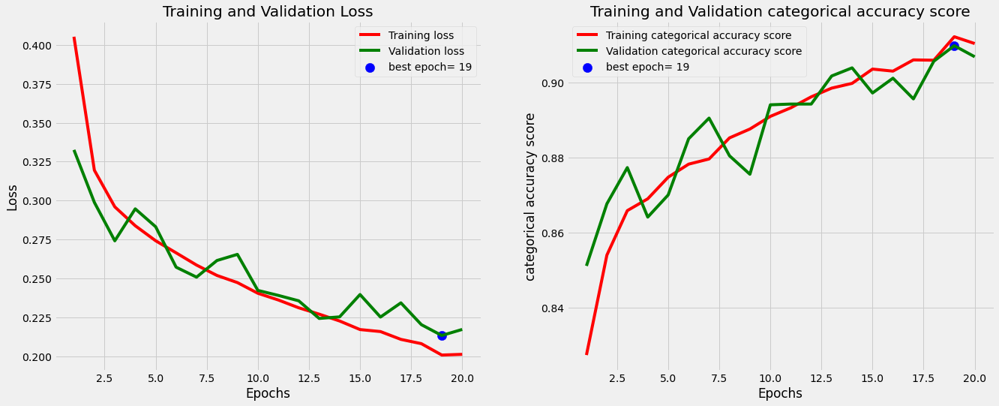

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.94      0.87      0.90       157
       Rings       0.94      0.95      0.94      4044
  Background       0.75      0.73      0.74       869

    accuracy                           0.91      5070
   macro avg       0.88      0.85      0.86      5070
weighted avg       0.91      0.91      0.91      5070

Model Performance (balanced accuracy) =  0.8330231299738653


In [286]:
acc_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters = 32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(5, 5, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(filters = 64, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(3, activation='softmax')) #Output layer
    
    acc = CNN_model(cnn, x_train_dataset, y_train_dataset, epochs, batch_size, patience)
    acc_scores.append(acc)

acc = np.mean(acc_scores)
print("Model Performance (balanced accuracy) = ", acc)

### Testing Average Pooling

In [287]:
batch_size = 64
epochs = 20
patience = 5

Epoch 1/20
713/713 [==============================] - 5s 6ms/step - loss: 0.4655 - categorical_accuracy: 0.8125 - val_loss: 0.3565 - val_categorical_accuracy: 0.8335
Epoch 2/20
713/713 [==============================] - 4s 6ms/step - loss: 0.3521 - categorical_accuracy: 0.8408 - val_loss: 0.3215 - val_categorical_accuracy: 0.8540
Epoch 3/20
713/713 [==============================] - 2s 3ms/step - loss: 0.3239 - categorical_accuracy: 0.8547 - val_loss: 0.2990 - val_categorical_accuracy: 0.8684
Epoch 4/20
713/713 [==============================] - 2s 3ms/step - loss: 0.3085 - categorical_accuracy: 0.8584 - val_loss: 0.2895 - val_categorical_accuracy: 0.8682
Epoch 5/20
713/713 [==============================] - 2s 4ms/step - loss: 0.2989 - categorical_accuracy: 0.8634 - val_loss: 0.2840 - val_categorical_accuracy: 0.8742
Epoch 6/20
713/713 [==============================] - 3s 4ms/step - loss: 0.2909 - categorical_accuracy: 0.8664 - val_loss: 0.2735 - val_categorical_accuracy: 0.8813
Epoc

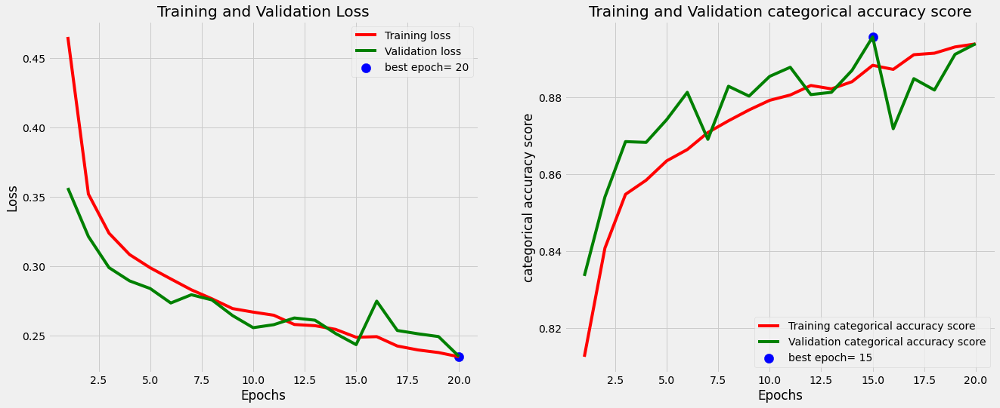

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.87      0.91      0.89       157
       Rings       0.91      0.96      0.94      4044
  Background       0.79      0.57      0.66       869

    accuracy                           0.89      5070
   macro avg       0.86      0.82      0.83      5070
weighted avg       0.89      0.89      0.89      5070

Epoch 1/20
713/713 [==============================] - 5s 6ms/step - loss: 0.4607 - categorical_accuracy: 0.8145 - val_loss: 0.3895 - val_categorical_accuracy: 0.8176
Epoch 2/20
713/713 [==============================] - 4s 5ms/step - loss: 0.3480 - categorical_accuracy: 0.8421 - val_loss: 0.3093 - val_categorical_accuracy: 0.8639
Epoch 3/20
713/713 [==============================] - 3s 4ms/step - loss: 0.3197 - categorical_accuracy: 0.8551 - val_loss: 0.3067 - val_categorical_accuracy: 0.8580
Epoch 4/20
713/713 [==============================] - 3s 4ms/step - loss: 

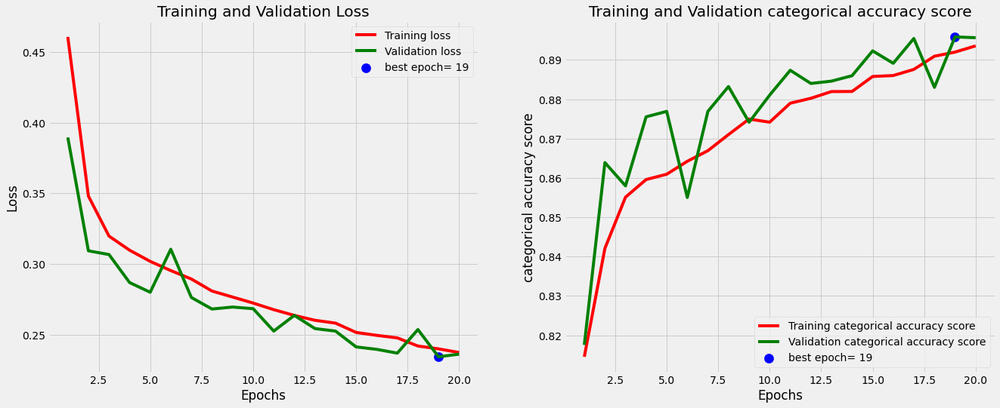

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.95      0.81      0.87       157
       Rings       0.91      0.96      0.94      4044
  Background       0.79      0.59      0.68       869

    accuracy                           0.90      5070
   macro avg       0.88      0.79      0.83      5070
weighted avg       0.89      0.90      0.89      5070

Epoch 1/20
713/713 [==============================] - 4s 4ms/step - loss: 0.4529 - categorical_accuracy: 0.8166 - val_loss: 0.3477 - val_categorical_accuracy: 0.8406
Epoch 2/20
713/713 [==============================] - 4s 6ms/step - loss: 0.3471 - categorical_accuracy: 0.8427 - val_loss: 0.3181 - val_categorical_accuracy: 0.8594
Epoch 3/20
713/713 [==============================] - 4s 6ms/step - loss: 0.3146 - categorical_accuracy: 0.8556 - val_loss: 0.3219 - val_categorical_accuracy: 0.8487
Epoch 4/20
713/713 [==============================] - 3s 4ms/step - loss: 

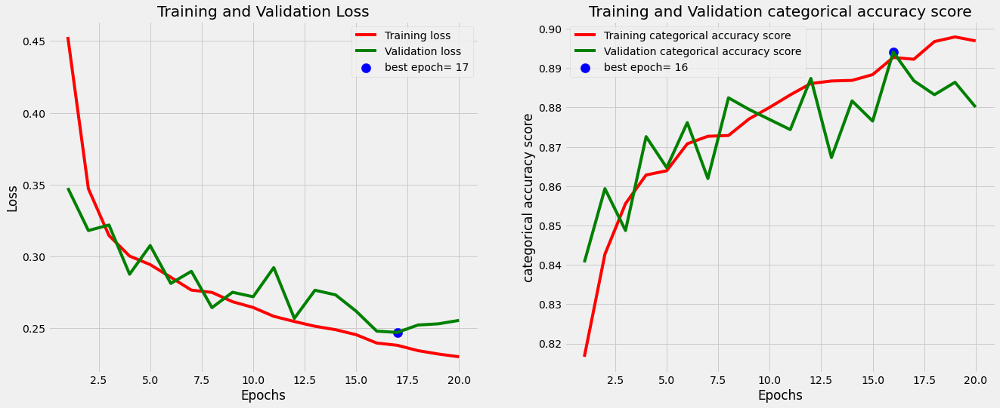

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.92      0.83      0.87       157
       Rings       0.93      0.91      0.92      4044
  Background       0.65      0.73      0.69       869

    accuracy                           0.88      5070
   macro avg       0.83      0.83      0.83      5070
weighted avg       0.89      0.88      0.88      5070

Epoch 1/20
713/713 [==============================] - 5s 6ms/step - loss: 0.4669 - categorical_accuracy: 0.8120 - val_loss: 0.3921 - val_categorical_accuracy: 0.8221
Epoch 2/20
713/713 [==============================] - 5s 7ms/step - loss: 0.3558 - categorical_accuracy: 0.8389 - val_loss: 0.3253 - val_categorical_accuracy: 0.8400
Epoch 3/20
713/713 [==============================] - 3s 5ms/step - loss: 0.3254 - categorical_accuracy: 0.8525 - val_loss: 0.2979 - val_categorical_accuracy: 0.8625
Epoch 4/20
713/713 [==============================] - 4s 5ms/step - loss: 

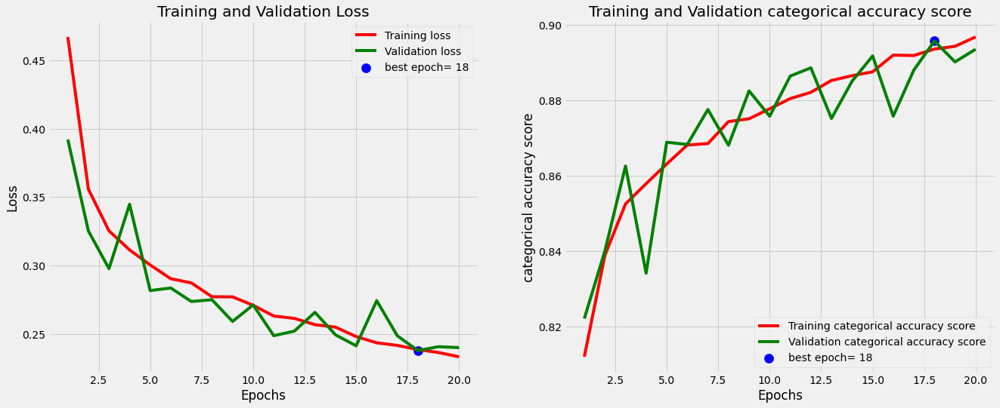

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.94      0.75      0.84       157
       Rings       0.93      0.94      0.93      4044
  Background       0.71      0.72      0.72       869

    accuracy                           0.89      5070
   macro avg       0.86      0.80      0.83      5070
weighted avg       0.89      0.89      0.89      5070

Epoch 1/20
713/713 [==============================] - 5s 6ms/step - loss: 0.4509 - categorical_accuracy: 0.8157 - val_loss: 0.3656 - val_categorical_accuracy: 0.8426
Epoch 2/20
713/713 [==============================] - 4s 6ms/step - loss: 0.3477 - categorical_accuracy: 0.8411 - val_loss: 0.3299 - val_categorical_accuracy: 0.8396
Epoch 3/20
713/713 [==============================] - 5s 6ms/step - loss: 0.3232 - categorical_accuracy: 0.8523 - val_loss: 0.3802 - val_categorical_accuracy: 0.8294
Epoch 4/20
713/713 [==============================] - 4s 5ms/step - loss: 

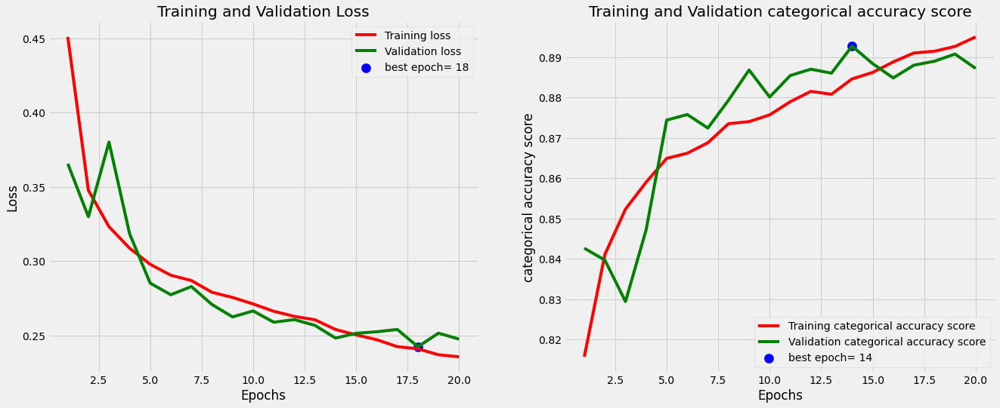

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.90      0.87      0.89       157
       Rings       0.94      0.92      0.93      4044
  Background       0.67      0.74      0.71       869

    accuracy                           0.89      5070
   macro avg       0.84      0.85      0.84      5070
weighted avg       0.89      0.89      0.89      5070

Model Performance (balanced accuracy) =  0.8157093994697536


In [288]:
acc_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters = 32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(5, 5, 3),padding='same')) #Convolution layer
    cnn.add(AveragePooling2D(pool_size=(2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(filters = 64, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(AveragePooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(3, activation='softmax')) #Output layer
    
    acc = CNN_model(cnn, x_train_dataset, y_train_dataset, epochs, batch_size, patience)
    acc_scores.append(acc)

acc = np.mean(acc_scores)
print("Model Performance (balanced accuracy) = ", acc)

### Testing Dropout

Epoch 1/20
713/713 [==============================] - 5s 7ms/step - loss: 0.4311 - categorical_accuracy: 0.8225 - val_loss: 0.3485 - val_categorical_accuracy: 0.8363
Epoch 2/20
713/713 [==============================] - 5s 7ms/step - loss: 0.3307 - categorical_accuracy: 0.8515 - val_loss: 0.3048 - val_categorical_accuracy: 0.8607
Epoch 3/20
713/713 [==============================] - 3s 5ms/step - loss: 0.3121 - categorical_accuracy: 0.8602 - val_loss: 0.2875 - val_categorical_accuracy: 0.8665
Epoch 4/20
713/713 [==============================] - 3s 5ms/step - loss: 0.2980 - categorical_accuracy: 0.8642 - val_loss: 0.2996 - val_categorical_accuracy: 0.8505
Epoch 5/20
713/713 [==============================] - 6s 8ms/step - loss: 0.2885 - categorical_accuracy: 0.8701 - val_loss: 0.2800 - val_categorical_accuracy: 0.8671
Epoch 6/20
713/713 [==============================] - 4s 5ms/step - loss: 0.2790 - categorical_accuracy: 0.8725 - val_loss: 0.2717 - val_categorical_accuracy: 0.8742
Epoc

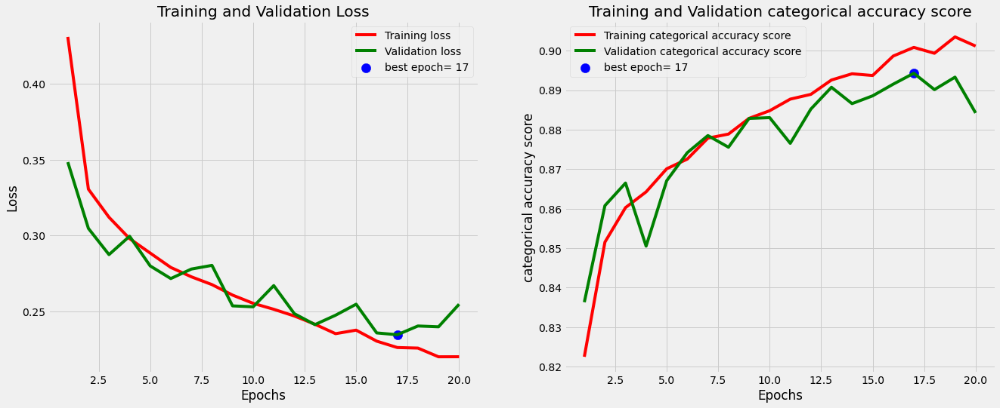

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.92      0.84      0.88       157
       Rings       0.89      0.98      0.93      4044
  Background       0.85      0.45      0.59       869

    accuracy                           0.88      5070
   macro avg       0.89      0.76      0.80      5070
weighted avg       0.88      0.88      0.87      5070

Epoch 1/20
713/713 [==============================] - 6s 7ms/step - loss: 0.4368 - categorical_accuracy: 0.8213 - val_loss: 0.3343 - val_categorical_accuracy: 0.8489
Epoch 2/20
713/713 [==============================] - 4s 5ms/step - loss: 0.3352 - categorical_accuracy: 0.8493 - val_loss: 0.3280 - val_categorical_accuracy: 0.8479
Epoch 3/20
713/713 [==============================] - 5s 7ms/step - loss: 0.3090 - categorical_accuracy: 0.8594 - val_loss: 0.3077 - val_categorical_accuracy: 0.8592
Epoch 4/20
713/713 [==============================] - 5s 8ms/step - loss: 

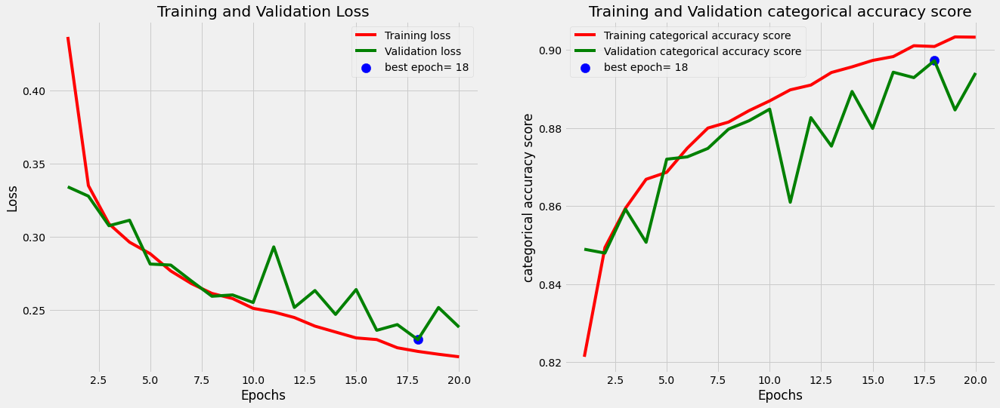

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.90      0.91      0.91       157
       Rings       0.91      0.96      0.94      4044
  Background       0.77      0.59      0.67       869

    accuracy                           0.89      5070
   macro avg       0.86      0.82      0.84      5070
weighted avg       0.89      0.89      0.89      5070

Epoch 1/20
713/713 [==============================] - 6s 7ms/step - loss: 0.4358 - categorical_accuracy: 0.8220 - val_loss: 0.3854 - val_categorical_accuracy: 0.8211
Epoch 2/20
713/713 [==============================] - 5s 7ms/step - loss: 0.3310 - categorical_accuracy: 0.8503 - val_loss: 0.3397 - val_categorical_accuracy: 0.8412
Epoch 3/20
713/713 [==============================] - 7s 9ms/step - loss: 0.3149 - categorical_accuracy: 0.8587 - val_loss: 0.3290 - val_categorical_accuracy: 0.8428
Epoch 4/20
713/713 [==============================] - 6s 8ms/step - loss: 

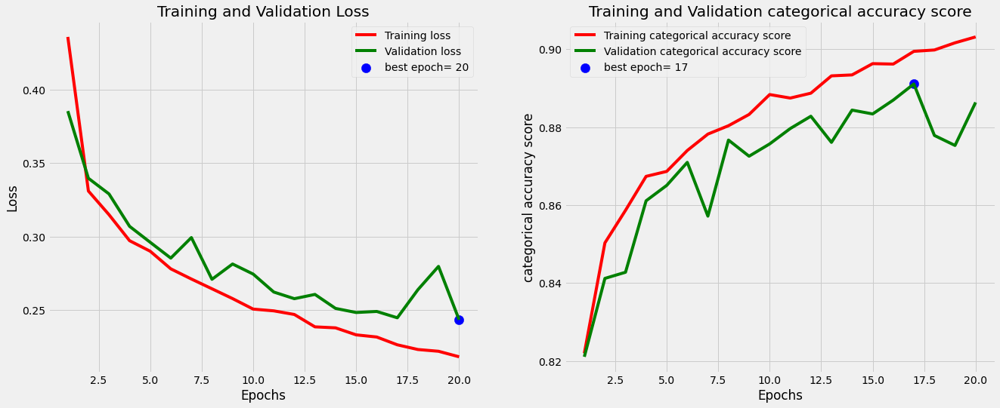

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.84      0.85      0.85       157
       Rings       0.93      0.93      0.93      4044
  Background       0.69      0.70      0.70       869

    accuracy                           0.89      5070
   macro avg       0.82      0.83      0.82      5070
weighted avg       0.89      0.89      0.89      5070

Epoch 1/20
713/713 [==============================] - 6s 8ms/step - loss: 0.4248 - categorical_accuracy: 0.8245 - val_loss: 0.3284 - val_categorical_accuracy: 0.8501
Epoch 2/20
713/713 [==============================] - 6s 8ms/step - loss: 0.3305 - categorical_accuracy: 0.8519 - val_loss: 0.3044 - val_categorical_accuracy: 0.8659
Epoch 3/20
713/713 [==============================] - 5s 6ms/step - loss: 0.3099 - categorical_accuracy: 0.8603 - val_loss: 0.3008 - val_categorical_accuracy: 0.8702
Epoch 4/20
713/713 [==============================] - 4s 6ms/step - loss: 

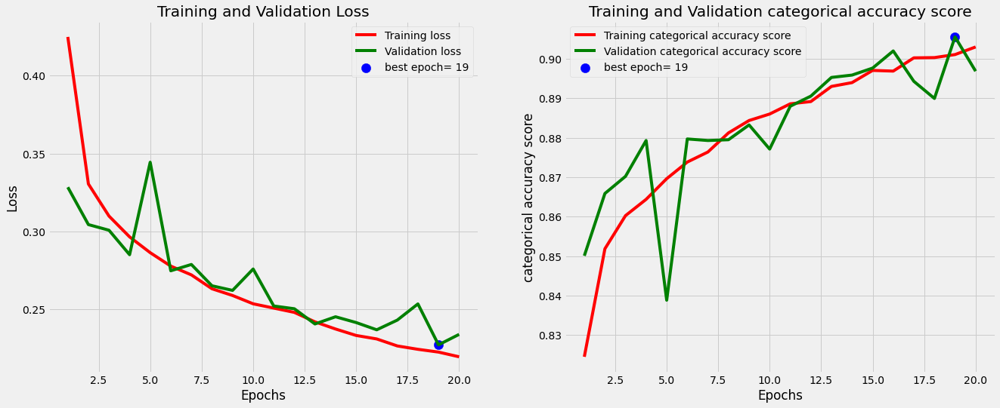

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.93      0.80      0.86       157
       Rings       0.93      0.95      0.94      4044
  Background       0.73      0.69      0.71       869

    accuracy                           0.90      5070
   macro avg       0.87      0.81      0.84      5070
weighted avg       0.89      0.90      0.90      5070

Epoch 1/20
713/713 [==============================] - 6s 8ms/step - loss: 0.4338 - categorical_accuracy: 0.8198 - val_loss: 0.3396 - val_categorical_accuracy: 0.8440
Epoch 2/20
713/713 [==============================] - 5s 8ms/step - loss: 0.3357 - categorical_accuracy: 0.8474 - val_loss: 0.3120 - val_categorical_accuracy: 0.8590
Epoch 3/20
713/713 [==============================] - 4s 6ms/step - loss: 0.3115 - categorical_accuracy: 0.8583 - val_loss: 0.2956 - val_categorical_accuracy: 0.8679
Epoch 4/20
713/713 [==============================] - 6s 8ms/step - loss: 

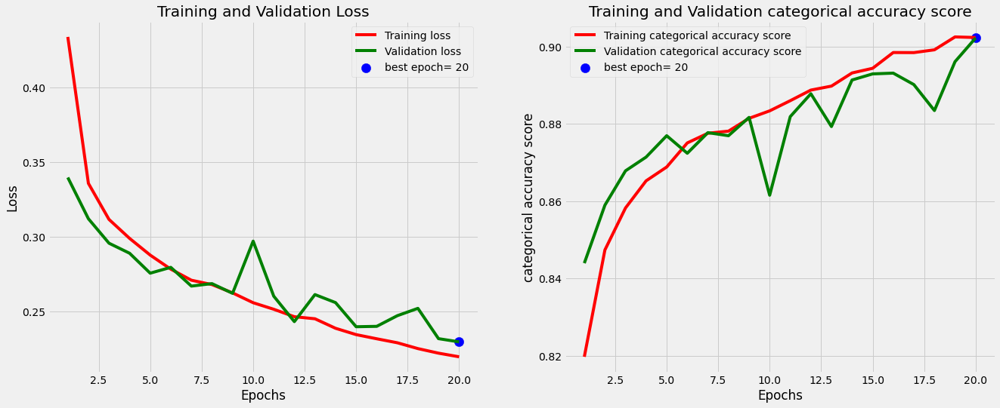

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.85      0.94      0.89       157
       Rings       0.93      0.95      0.94      4044
  Background       0.77      0.67      0.72       869

    accuracy                           0.90      5070
   macro avg       0.85      0.85      0.85      5070
weighted avg       0.90      0.90      0.90      5070

Model Performance (balanced accuracy) =  0.8129731585973866


In [290]:
batch_size = 64
epochs = 20
patience = 5

acc_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(5,5,3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D((2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(64, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dropout(0.3))
    cnn.add(Dense(3, activation='softmax')) #Output layer
    
    acc = CNN_model(cnn, x_train_dataset, y_train_dataset, epochs, batch_size, patience)
    acc_scores.append(acc)

acc = np.mean(acc_scores)
print("Model Performance (balanced accuracy) = ", acc)

Epoch 1/20
713/713 [==============================] - 4s 5ms/step - loss: 0.4714 - categorical_accuracy: 0.8117 - val_loss: 0.3584 - val_categorical_accuracy: 0.8511
Epoch 2/20
713/713 [==============================] - 5s 7ms/step - loss: 0.3753 - categorical_accuracy: 0.8297 - val_loss: 0.3382 - val_categorical_accuracy: 0.8351
Epoch 3/20
713/713 [==============================] - 5s 8ms/step - loss: 0.3527 - categorical_accuracy: 0.8405 - val_loss: 0.3273 - val_categorical_accuracy: 0.8434
Epoch 4/20
713/713 [==============================] - 3s 5ms/step - loss: 0.3398 - categorical_accuracy: 0.8470 - val_loss: 0.3483 - val_categorical_accuracy: 0.8288
Epoch 5/20
713/713 [==============================] - 4s 6ms/step - loss: 0.3312 - categorical_accuracy: 0.8495 - val_loss: 0.3028 - val_categorical_accuracy: 0.8682
Epoch 6/20
713/713 [==============================] - 6s 9ms/step - loss: 0.3225 - categorical_accuracy: 0.8533 - val_loss: 0.2992 - val_categorical_accuracy: 0.8582
Epoc

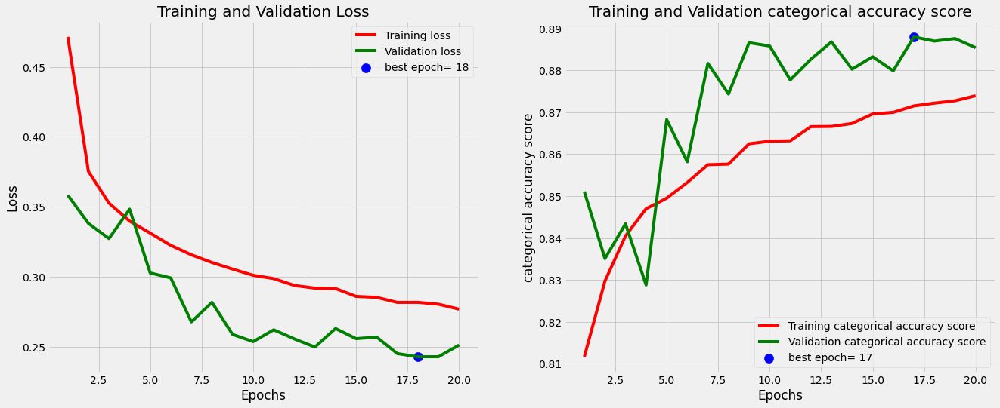

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.82      0.86      0.84       157
       Rings       0.93      0.92      0.93      4044
  Background       0.69      0.71      0.70       869

    accuracy                           0.89      5070
   macro avg       0.81      0.83      0.82      5070
weighted avg       0.89      0.89      0.89      5070

Epoch 1/20
713/713 [==============================] - 7s 9ms/step - loss: 0.4691 - categorical_accuracy: 0.8095 - val_loss: 0.4075 - val_categorical_accuracy: 0.8381
Epoch 2/20
713/713 [==============================] - 6s 8ms/step - loss: 0.3750 - categorical_accuracy: 0.8301 - val_loss: 0.3463 - val_categorical_accuracy: 0.8505
Epoch 3/20
713/713 [==============================] - 6s 9ms/step - loss: 0.3506 - categorical_accuracy: 0.8400 - val_loss: 0.3312 - val_categorical_accuracy: 0.8515
Epoch 4/20
713/713 [==============================] - 7s 10ms/step - loss:

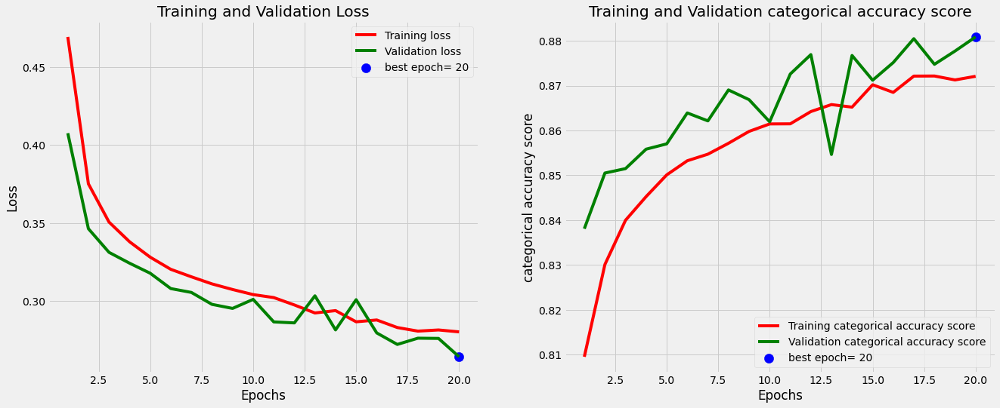

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.89      0.80      0.84       157
       Rings       0.93      0.93      0.93      4044
  Background       0.68      0.69      0.68       869

    accuracy                           0.88      5070
   macro avg       0.83      0.80      0.82      5070
weighted avg       0.88      0.88      0.88      5070

Epoch 1/20
713/713 [==============================] - 7s 9ms/step - loss: 0.4743 - categorical_accuracy: 0.8084 - val_loss: 0.3871 - val_categorical_accuracy: 0.8434
Epoch 2/20
713/713 [==============================] - 7s 9ms/step - loss: 0.3788 - categorical_accuracy: 0.8293 - val_loss: 0.3444 - val_categorical_accuracy: 0.8542
Epoch 3/20
713/713 [==============================] - 6s 9ms/step - loss: 0.3504 - categorical_accuracy: 0.8425 - val_loss: 0.3211 - val_categorical_accuracy: 0.8550
Epoch 4/20
713/713 [==============================] - 6s 8ms/step - loss: 

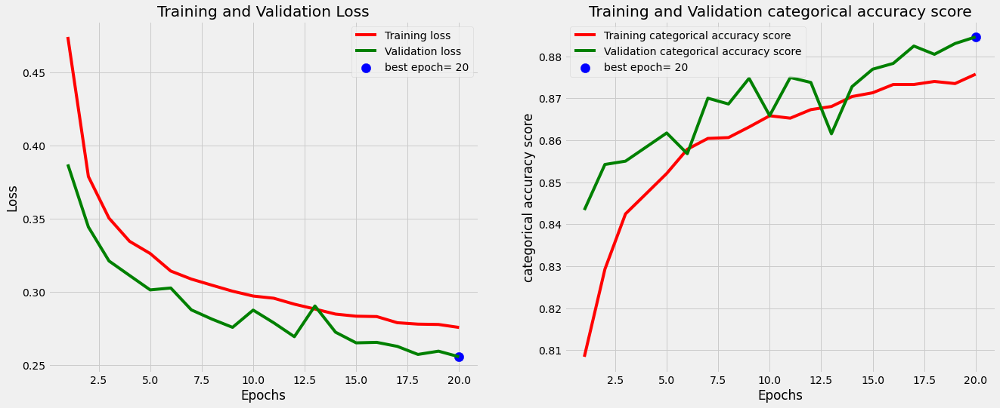

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.89      0.78      0.83       157
       Rings       0.91      0.95      0.93      4044
  Background       0.73      0.61      0.66       869

    accuracy                           0.88      5070
   macro avg       0.84      0.78      0.81      5070
weighted avg       0.88      0.88      0.88      5070

Epoch 1/20
713/713 [==============================] - 9s 11ms/step - loss: 0.4732 - categorical_accuracy: 0.8089 - val_loss: 0.3751 - val_categorical_accuracy: 0.8465
Epoch 2/20
713/713 [==============================] - 8s 11ms/step - loss: 0.3760 - categorical_accuracy: 0.8305 - val_loss: 0.3409 - val_categorical_accuracy: 0.8469
Epoch 3/20
713/713 [==============================] - 6s 9ms/step - loss: 0.3482 - categorical_accuracy: 0.8424 - val_loss: 0.3155 - val_categorical_accuracy: 0.8609
Epoch 4/20
713/713 [==============================] - 5s 8ms/step - loss

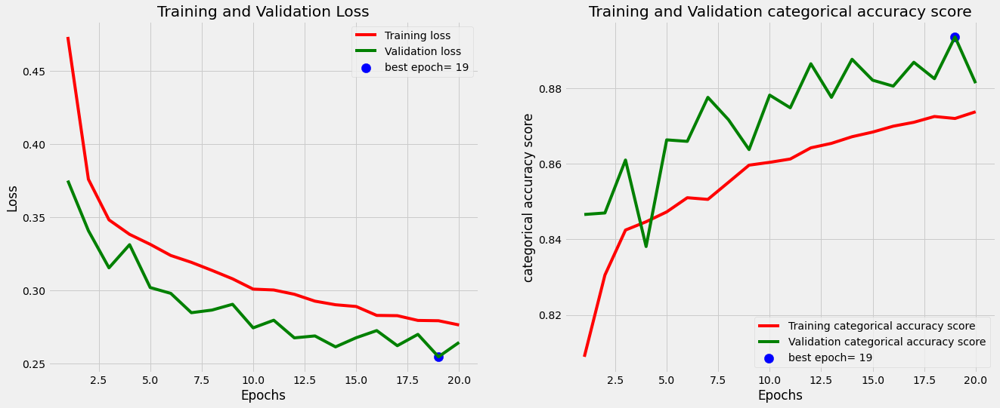

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.95      0.80      0.87       157
       Rings       0.95      0.90      0.92      4044
  Background       0.64      0.80      0.71       869

    accuracy                           0.88      5070
   macro avg       0.84      0.83      0.83      5070
weighted avg       0.89      0.88      0.89      5070

Epoch 1/20
713/713 [==============================] - 7s 9ms/step - loss: 0.4736 - categorical_accuracy: 0.8100 - val_loss: 0.4555 - val_categorical_accuracy: 0.7753
Epoch 2/20
713/713 [==============================] - 6s 9ms/step - loss: 0.3729 - categorical_accuracy: 0.8325 - val_loss: 0.3226 - val_categorical_accuracy: 0.8598
Epoch 3/20
713/713 [==============================] - 7s 10ms/step - loss: 0.3484 - categorical_accuracy: 0.8407 - val_loss: 0.3343 - val_categorical_accuracy: 0.8465
Epoch 4/20
713/713 [==============================] - 8s 11ms/step - loss

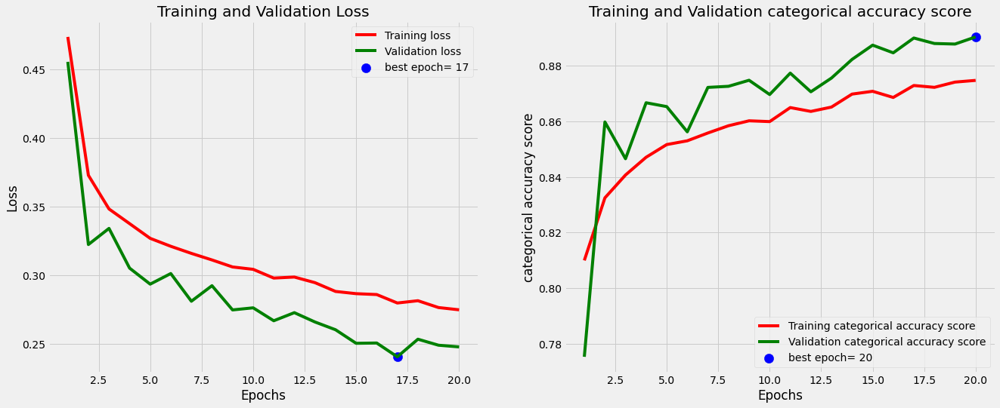

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.84      0.89      0.86       157
       Rings       0.94      0.92      0.93      4044
  Background       0.68      0.76      0.72       869

    accuracy                           0.89      5070
   macro avg       0.82      0.85      0.84      5070
weighted avg       0.90      0.89      0.89      5070

Model Performance (balanced accuracy) =  0.8325276851662974


In [291]:
batch_size = 64
epochs = 20
patience = 5

acc_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(5,5, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D((2, 2),padding='same')) #Pooling layer
    cnn.add(Dropout(0.3))
    cnn.add(Conv2D(64, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
    cnn.add(Dropout(0.3))
    
    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dropout(0.3))
    cnn.add(Dense(3, activation='softmax')) #Output layer
    
    acc = CNN_model(cnn, x_train_dataset, y_train_dataset, epochs, batch_size, patience)
    acc_scores.append(acc)

acc = np.median(acc_scores)
print("Model Performance (balanced accuracy) = ", acc)

## Oversampling 

In [26]:
def cross_val_ros(X, Y, classifier):
    
    n_scores = []
        
    skf = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1)
    
    for train_index, test_index in skf.split(X, Y):
        Xtrain, Ytrain = X[train_index], Y[train_index]
        Xtest, Ytest = X[test_index], Y[test_index]
        
        ros = RandomOverSampler(random_state=1)
        x_ros, y_ros = ros.fit_resample(Xtrain, Ytrain)
        
        classifier.fit(x_ros, y_ros)

        y_pred = classifier.predict(Xtest) # we subtract 1 to make background = 0
        
        score = balanced_accuracy_score(Ytest,y_pred)
        print(score)
        print(classification_report(Ytest,y_pred))
                
        n_scores.append(score)
    
    mean_scores = np.mean(n_scores)

    return mean_scores

In [27]:
def data_augm(x_dataset, majority_class, target_class, plot = False):
    
    flipped = tf.image.flip_left_right(x_dataset.reshape(-1, 5, 5, 3).astype('float32'))
    flipped = flipped.numpy()
    flipped = flipped.reshape(-1, 75)
    
    x_augm = np.vstack((x_dataset, flipped))
    
    flipped_updown = tf.image.flip_up_down(x_augm.reshape(-1, 5, 5, 3).astype('float32'))
    flipped_updown = flipped_updown.numpy()
    flipped_updown = flipped_updown.reshape(-1, 75)
    
    x_augm = np.vstack((x_augm, flipped_updown))
    
    rotation_1 = tf.image.rot90(x_augm.reshape(-1, 5, 5, 3).astype('float32')).numpy()
    rotation_2 = tf.image.rot90(x_augm.reshape(-1, 5, 5, 3).astype('float32'), k = 2).numpy()
    rotation_3 = tf.image.rot90(x_augm.reshape(-1, 5, 5, 3).astype('float32'), k = 3).numpy()
    
    data_augm = np.vstack((flipped, flipped_updown, rotation_1.reshape(-1, 75), rotation_2.reshape(-1, 75), rotation_3.reshape(-1, 75))) 
    
    if x_dataset.shape[0]+data_augm.shape[0] > majority_class.shape[0]:
        
        remove_samples = x_dataset.shape[0]+data_augm.shape[0] - majority_class.shape[0]
        
        idx = range(0,data_augm.shape[0])
        
        idx_remove = random.sample(idx,remove_samples)
        
        data_augm = np.delete(data_augm, idx_remove, 0)
        
        x_target_augm = np.vstack((x_dataset, data_augm))
        
    else:
        x_target = np.vstack((x_dataset, data_augm))
        
        y_target = target_class*np.ones(x_target.shape[0])
        
        y_majority = np.ones(majority_class.shape[0])
        
        x = np.vstack((x_target, majority_class))
        y = np.concatenate([y_target, y_majority])
        
        ros = RandomOverSampler(random_state=1)
        
        x_ros, y_ros = ros.fit_resample(x, y)
        
        x_target_augm = x_ros[np.where(y_ros  == target_class)]
    
    if plot:
        fig = plt.figure(figsize=(15, 10))
        fig.tight_layout()
        ax1 = fig.add_subplot(3,2,1)
        ax1.imshow(x_dataset[0, :].reshape(5, 5, 3)/255)
        ax1.set_title('original', fontsize = 12)
        ax3 = fig.add_subplot(3,2,2)
        ax3.imshow(flipped[0, :].reshape(5, 5, 3)/255)
        ax3.set_title('flit horizontally from left to right', fontsize = 12)
        ax5 = fig.add_subplot(3,2,3)
        ax5.imshow(flipped_updown[0, :].reshape(5, 5, 3)/255)
        ax5.set_title('flip vertically from up to down', fontsize = 12)
        ax7 = fig.add_subplot(3,2,4)
        ax7.imshow(rotation_1[0, :]/255)
        ax7.set_title('rotate 90', fontsize = 12)
        ax8 = fig.add_subplot(3,2,5)
        ax8.imshow(rotation_2[0, :]/255)
        ax8.set_title('rotate 180', fontsize = 12)
        ax9 = fig.add_subplot(3,2,6)
        ax9.imshow(rotation_3[0, :]/255)
        ax9.set_title('rotate 270', fontsize = 12)
        
        plt.axis('off')
        
    return x_target_augm

In [28]:
def cross_val_aug(X, Y, classifier):
    
    n_scores = []
        
    skf = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1)
    
    for train_index, test_index in skf.split(X, Y):
        Xtrain, Ytrain = X[train_index], Y[train_index]
        Xtest, Ytest = X[test_index], Y[test_index]
        
        center=Xtrain[np.where(Ytrain == 0)]
        ring=Xtrain[np.where(Ytrain == 1)]
        background=Xtrain[np.where(Ytrain == 2)]
        
        center_augm = data_augm(center, ring, 0)
        background_augm = data_augm(background, ring, 2)
        
        Xtrain_aug = np.vstack((center_augm, background_augm, ring))

        y_center = np.zeros(center_augm.shape[0])
        y_background = 2*np.ones(background_augm.shape[0])
        y_ring = np.ones(ring.shape[0])
        Ytrain_aug = np.concatenate([y_center, y_background, y_ring])

        n = Xtrain_aug.shape[0]
        shuffler = np.random.permutation(n)
        Xtrain_aug = Xtrain_aug[shuffler]
        Ytrain_aug = Ytrain_aug[shuffler]

        classifier.fit(Xtrain_aug, Ytrain_aug)

        y_pred = classifier.predict(Xtest) 
        
        score = balanced_accuracy_score(Ytest,y_pred)
        print(score)
        print(classification_report(Ytest,y_pred))
                
        n_scores.append(score)
    
    mean_scores = np.mean(n_scores)

    return mean_scores

In [29]:
def cross_val_smote(X, Y, classifier):
    
    n_scores = []
        
    skf = StratifiedShuffleSplit(n_splits=5, test_size=0.1, random_state=1)
    
    for train_index, test_index in skf.split(X, Y):
        Xtrain, Ytrain = X[train_index], Y[train_index]
        Xtest, Ytest = X[test_index], Y[test_index]
        
        smote = SMOTE(k_neighbors = 5)
        
        x_smote, y_smote = smote.fit_resample(Xtrain, Ytrain)
        
        classifier.fit(x_smote, y_smote)

        y_pred = classifier.predict(Xtest) 
        
        score = balanced_accuracy_score(Ytest,y_pred)
        print(score)
        print(classification_report(Ytest,y_pred))
                
        n_scores.append(score)
    
    mean_scores = np.mean(n_scores)

    return mean_scores

#### Random Forest

In [23]:
Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset, y_train_dataset, random_state = 1, test_size=0.1, stratify = y_train_dataset)
    
ros = RandomOverSampler(random_state=1)

x_ros, y_ros = ros.fit_resample(Xtrain, Ytrain)

print(Counter(y_ros))

Counter({1: 36394, 2: 36394, 0: 36394})


In [24]:
classifier = RandomForestClassifier(criterion = 'entropy', 
                                    max_depth = 25, 
                                    min_samples_split = 50,
                                    random_state=1)
classifier.fit(x_ros, y_ros)

y_pred = classifier.predict(Xtest) 

print("balanced accuracy for Xtest = ", balanced_accuracy_score(Ytest,y_pred))
print(classification_report(Ytest,y_pred))

balanced accuracy for Xtest =  0.8855480939548257
              precision    recall  f1-score   support

           0       0.78      0.92      0.84       157
           1       0.96      0.87      0.92      4044
           2       0.61      0.86      0.71       869

    accuracy                           0.87      5070
   macro avg       0.78      0.89      0.82      5070
weighted avg       0.90      0.87      0.88      5070



In [30]:
acc = cross_val_ros(x_train_dataset, y_train_dataset, classifier)

print("Model Performance (balanced accuracy) = ", acc)

0.8855480939548257
              precision    recall  f1-score   support

           0       0.78      0.92      0.84       157
           1       0.96      0.87      0.92      4044
           2       0.61      0.86      0.71       869

    accuracy                           0.87      5070
   macro avg       0.78      0.89      0.82      5070
weighted avg       0.90      0.87      0.88      5070

0.8883591998670647
              precision    recall  f1-score   support

           0       0.91      0.93      0.92       157
           1       0.96      0.87      0.92      4044
           2       0.60      0.86      0.71       869

    accuracy                           0.87      5070
   macro avg       0.83      0.89      0.85      5070
weighted avg       0.90      0.87      0.88      5070

0.8617140194553623
              precision    recall  f1-score   support

           0       0.83      0.86      0.85       157
           1       0.96      0.87      0.91      4044
           2      

In [95]:
Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset, y_train_dataset, random_state = 1, test_size=0.1, stratify = y_train_dataset)

smote = SMOTE(k_neighbors = 5)

x_smote, y_smote = smote.fit_resample(Xtrain, Ytrain)

print(Counter(y_smote))

Counter({1: 36394, 2: 36394, 0: 36394})


In [96]:
classifier = RandomForestClassifier(criterion = 'entropy', 
                                    max_depth = 15, 
                                    min_samples_split = 254,
                                    random_state=1)
classifier.fit(x_smote, y_smote)

y_pred = classifier.predict(Xtest) 

print("balanced accuracy for Xtest = ", balanced_accuracy_score(Ytest,y_pred))
print(classification_report(Ytest,y_pred))

balanced accuracy for Xtest =  0.7861465319166756
              precision    recall  f1-score   support

           0       0.50      0.99      0.67       157
           1       0.89      0.86      0.88      4044
           2       0.51      0.50      0.51       869

    accuracy                           0.80      5070
   macro avg       0.64      0.79      0.68      5070
weighted avg       0.81      0.80      0.81      5070



In [99]:
acc = cross_val_smote(x_train_dataset, y_train_dataset, classifier)

print("Model Performance (balanced accuracy) = ", acc)

0.7816577421294597
              precision    recall  f1-score   support

           0       0.50      0.99      0.66       157
           1       0.89      0.87      0.88      4044
           2       0.52      0.49      0.50       869

    accuracy                           0.80      5070
   macro avg       0.63      0.78      0.68      5070
weighted avg       0.81      0.80      0.81      5070

0.7886130068338187
              precision    recall  f1-score   support

           0       0.50      0.97      0.66       157
           1       0.90      0.86      0.88      4044
           2       0.52      0.54      0.53       869

    accuracy                           0.81      5070
   macro avg       0.64      0.79      0.69      5070
weighted avg       0.82      0.81      0.81      5070

0.7824709096060839
              precision    recall  f1-score   support

           0       0.50      0.96      0.66       157
           1       0.90      0.85      0.87      4044
           2      

In [31]:
Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset, y_train_dataset, test_size=0.1, random_state = 1, stratify = y_train_dataset)
    
center=Xtrain[np.where(Ytrain == 0)]
print('Center shape:', center.shape)
N_center=(Ytrain == 0.0).sum()

ring=Xtrain[np.where(Ytrain == 1)]
print('ring shape:', ring.shape)
N_ring=(Ytrain == 1.0).sum()

background=Xtrain[np.where(Ytrain == 2)]
print('background shape:', background.shape)
N_background=(Ytrain == 2.0).sum()

Center shape: (1411, 75)
ring shape: (36394, 75)
background shape: (7825, 75)


(36394, 75)


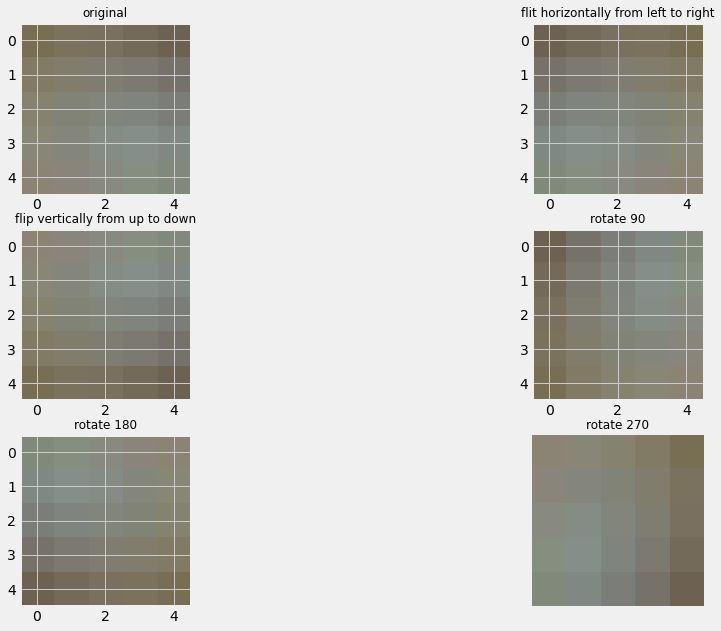

In [32]:
center_augm = data_augm(center, ring, 0, True)

print(center_augm.shape)

In [33]:
background_augm = data_augm(background, ring, 2)

print(background_augm.shape)

(36394, 75)


In [34]:
Xtrain_aug = np.vstack((center_augm, background_augm, ring))

y_center = np.zeros(center_augm.shape[0])
y_background = 2*np.ones(background_augm.shape[0])
y_ring = np.ones(ring.shape[0])
Ytrain_aug = np.concatenate([y_center, y_background, y_ring])

n = Xtrain_aug.shape[0]
shuffler = np.random.permutation(n)
Xtrain_aug = Xtrain_aug[shuffler]
Ytrain_aug = Ytrain_aug[shuffler]

In [35]:
classifier = RandomForestClassifier(criterion = 'entropy', 
                                    max_depth = 25, 
                                    min_samples_split = 50,
                                    random_state=1)
classifier.fit(Xtrain_aug, Ytrain_aug)

y_pred = classifier.predict(Xtest) 

print("balanced accuracy for Xtest = ", balanced_accuracy_score(Ytest,y_pred))
print(classification_report(Ytest,y_pred))

balanced accuracy for Xtest =  0.8909726033985361
              precision    recall  f1-score   support

           0       0.53      0.98      0.69       157
           1       0.98      0.77      0.86      4044
           2       0.50      0.92      0.65       869

    accuracy                           0.80      5070
   macro avg       0.67      0.89      0.73      5070
weighted avg       0.88      0.80      0.82      5070



In [36]:
acc = cross_val_aug(x_train_dataset, y_train_dataset, classifier)

print("Model Performance (balanced accuracy) = ", acc)

0.8935111038283886
              precision    recall  f1-score   support

           0       0.53      0.99      0.69       157
           1       0.98      0.77      0.87      4044
           2       0.51      0.92      0.65       869

    accuracy                           0.81      5070
   macro avg       0.67      0.89      0.74      5070
weighted avg       0.88      0.81      0.82      5070

0.8872009283422025
              precision    recall  f1-score   support

           0       0.56      0.97      0.71       157
           1       0.98      0.77      0.86      4044
           2       0.49      0.92      0.64       869

    accuracy                           0.80      5070
   macro avg       0.68      0.89      0.74      5070
weighted avg       0.88      0.80      0.82      5070

0.8900002091341963
              precision    recall  f1-score   support

           0       0.50      0.97      0.66       157
           1       0.98      0.77      0.86      4044
           2      

#### Bagging KNN with Oversampling

In [91]:
bagged_knn = KNeighborsClassifier(n_neighbors=3, weights='distance')

bagging_model = BaggingClassifier(bagged_knn, n_estimators=20, random_state = 1)

Balanced accuracy for Xtest 0.927179649868128
              precision    recall  f1-score   support

           0       0.78      0.94      0.85       157
           1       0.99      0.89      0.93      4044
           2       0.66      0.96      0.78       869

    accuracy                           0.90      5070
   macro avg       0.81      0.93      0.86      5070
weighted avg       0.93      0.90      0.91      5070



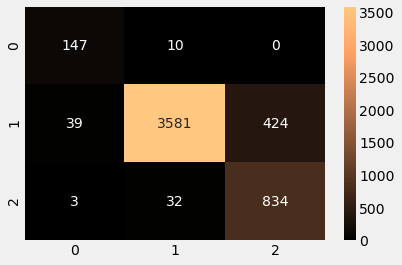

In [48]:
x_train_dataset_n = scaler.fit_transform(x_train_dataset)
Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset_n, y_train_dataset, random_state = 1, test_size=0.1, stratify = y_train_dataset)

ros = RandomOverSampler(random_state=1)

x_ros, y_ros = ros.fit_resample(Xtrain, Ytrain)

bagging_model.fit(x_ros, y_ros)
y_pred = bagging_model.predict(Xtest)

print('Balanced accuracy for Xtest',balanced_accuracy_score(Ytest,y_pred))
print(classification_report(Ytest,y_pred))
conf_matrix = confusion_matrix(Ytest, y_pred)
sns.heatmap(conf_matrix, annot=True,fmt='d', cmap=plt.cm.copper)
plt.show()

In [92]:
acc = cross_val_ros(x_train_dataset_n, y_train_dataset, bagging_model)

print("Model Performance (balanced accuracy) = ", acc)

0.927179649868128
              precision    recall  f1-score   support

           0       0.78      0.94      0.85       157
           1       0.99      0.89      0.93      4044
           2       0.66      0.96      0.78       869

    accuracy                           0.90      5070
   macro avg       0.81      0.93      0.86      5070
weighted avg       0.93      0.90      0.91      5070

0.9234784506676584
              precision    recall  f1-score   support

           0       0.81      0.95      0.88       157
           1       0.98      0.88      0.93      4044
           2       0.65      0.94      0.77       869

    accuracy                           0.89      5070
   macro avg       0.82      0.92      0.86      5070
weighted avg       0.92      0.89      0.90      5070

0.9009131518195924
              precision    recall  f1-score   support

           0       0.75      0.88      0.81       157
           1       0.98      0.88      0.93      4044
           2       

In [93]:
acc = cross_val_aug(x_train_dataset_n, y_train_dataset, bagging_model)

print("Model Performance (balanced accuracy) = ", acc)

0.9272473762158823
              precision    recall  f1-score   support

           0       0.55      0.99      0.71       157
           1       0.99      0.83      0.90      4044
           2       0.60      0.96      0.74       869

    accuracy                           0.86      5070
   macro avg       0.71      0.93      0.78      5070
weighted avg       0.91      0.86      0.87      5070

0.9199453303297952
              precision    recall  f1-score   support

           0       0.61      0.98      0.75       157
           1       0.98      0.84      0.91      4044
           2       0.60      0.94      0.73       869

    accuracy                           0.86      5070
   macro avg       0.73      0.92      0.80      5070
weighted avg       0.91      0.86      0.87      5070

0.9161187043813196
              precision    recall  f1-score   support

           0       0.53      0.98      0.69       157
           1       0.99      0.82      0.90      4044
           2      

balanced accuracy for Xtest =  0.9270604223516568
              precision    recall  f1-score   support

           0       0.56      0.99      0.71       157
           1       0.99      0.83      0.90      4044
           2       0.60      0.95      0.74       869

    accuracy                           0.86      5070
   macro avg       0.72      0.93      0.78      5070
weighted avg       0.91      0.86      0.87      5070



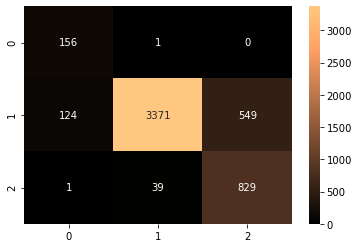

In [104]:
Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset_n, y_train_dataset, test_size=0.1, random_state = 1, stratify = y_train_dataset)

center=Xtrain[np.where(Ytrain == 0)]
ring=Xtrain[np.where(Ytrain == 1)]
background=Xtrain[np.where(Ytrain == 2)]

center_augm = data_augm(center, ring, 0)
background_augm = data_augm(background, ring, 2)

Xtrain_aug = np.vstack((center_augm, background_augm, ring))

y_center = np.zeros(center_augm.shape[0])
y_background = 2*np.ones(background_augm.shape[0])
y_ring = np.ones(ring.shape[0])
Ytrain_aug = np.concatenate([y_center, y_background, y_ring])

n = Xtrain_aug.shape[0]
shuffler = np.random.permutation(n)
Xtrain_aug = Xtrain_aug[shuffler]
Ytrain_aug = Ytrain_aug[shuffler]

bagged_knn = KNeighborsClassifier(n_neighbors=3, weights='distance')

bagging_model = BaggingClassifier(bagged_knn, n_estimators=20, random_state = 1)

bagging_model.fit(Xtrain_aug, Ytrain_aug)

y_pred = bagging_model.predict(Xtest) 
print("balanced accuracy for Xtest = ", balanced_accuracy_score(Ytest,y_pred))
print(classification_report(Ytest,y_pred))
conf_matrix = confusion_matrix(Ytest, y_pred)
sns.heatmap(conf_matrix, annot=True,fmt='d', cmap=plt.cm.copper)
plt.show()

#### MLP with oversampling

In [265]:
def multilayer_perceptron_ros(model, x_train_dataset, y_train_dataset, BATCH_SIZE, epochs, patience):
    
    class_names = ['Center', 'Rings', 'Background']

    # Normalize the dataset (re-scaling the data)
    x_train_dataset_n = x_train_dataset / 255.0
    
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset_n, y_train_dataset, test_size=0.1, stratify = y_train_dataset)
    
    ros = RandomOverSampler(random_state=1)
    x_ros, y_ros = ros.fit_resample(Xtrain, Ytrain)
        
    # Convert labels into one-hot-encoding format
    y_test_val = Ytest
    y_ros = to_categorical(y_ros)
    Ytest = to_categorical(Ytest)
    
    # Define patience    
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)
        
    # tf.keras.optimizers.SGD 
    model.compile(optimizer='sgd',
                  loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
                  metrics=[tf.keras.metrics.CategoricalAccuracy()])
    
    history = model.fit(x_ros, y_ros, batch_size=BATCH_SIZE, epochs=epochs, callbacks=[es], validation_data=(Xtest, Ytest))
            
    test_loss, test_acc = model.evaluate(Xtest,  Ytest, verbose=1)

    print('\nTest categorical accuracy:', test_acc)
    
    # predicting the testing set
    ypred = model.predict(Xtest)
    
    # Find the class with maximum probability
    y_test = []

    for i in range(len(ypred)):
        y_test.append(np.argmax(ypred[i]))
    
    balacc = balanced_accuracy_score(y_test_val, y_test)
    print('\n Balanced accuracy:', balacc)
    
    # predicting the testing set
    ypred = model.predict(Xtest)
    
    
    # ---------- plot learning curves:
    # Plot the training and validation data
    tacc=history.history['categorical_accuracy']
    tloss=history.history['loss']
    vacc=history.history['val_categorical_accuracy']
    vloss=history.history['val_loss']
    
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1)
    vc_label='best epoch= '+ str(index_acc + 1)
    
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
    axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training categorical accuracy score')
    axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation categorical accuracy score')
    axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation categorical accuracy score')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('categorical accuracy score')
    axes[1].legend()
    plt.tight_layout
    plt.show()
    
    clr = classification_report(y_test_val, y_test, target_names=class_names)
    print("Classification Report:\n----------------------\n", clr)
    
    return balacc

Epoch 1/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.7964 - categorical_accuracy: 0.6731 - val_loss: 0.7778 - val_categorical_accuracy: 0.7187
Epoch 2/100
1706/1706 [==============================] - 3s 2ms/step - loss: 0.6423 - categorical_accuracy: 0.7306 - val_loss: 0.7448 - val_categorical_accuracy: 0.6895
Epoch 3/100
1706/1706 [==============================] - 3s 2ms/step - loss: 0.6038 - categorical_accuracy: 0.7539 - val_loss: 0.7024 - val_categorical_accuracy: 0.7288
Epoch 4/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.5763 - categorical_accuracy: 0.7771 - val_loss: 0.7099 - val_categorical_accuracy: 0.7302
Epoch 5/100
1706/1706 [==============================] - 2s 934us/step - loss: 0.5513 - categorical_accuracy: 0.7950 - val_loss: 0.6948 - val_categorical_accuracy: 0.7205
Epoch 6/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.5286 - categorical_accuracy: 0.8068 - val_loss: 0.6616 - val_categorical_a

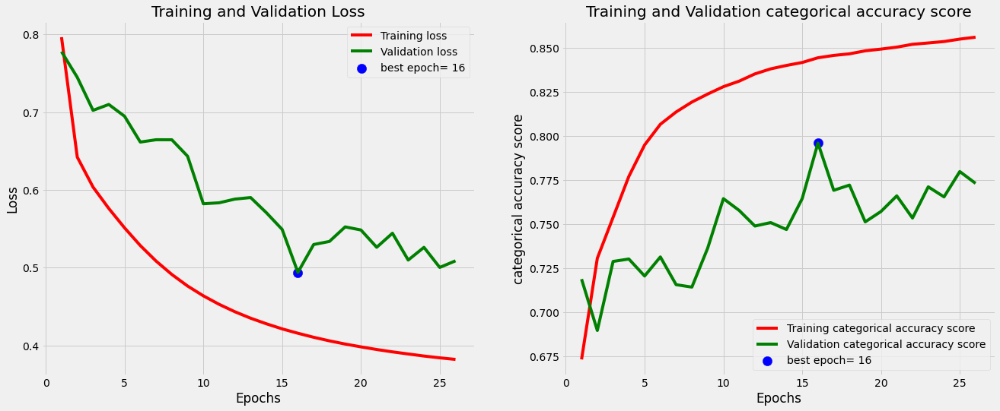

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.55      0.96      0.70       157
       Rings       0.96      0.75      0.84      4044
  Background       0.45      0.84      0.59       869

    accuracy                           0.77      5070
   macro avg       0.65      0.85      0.71      5070
weighted avg       0.86      0.77      0.79      5070

Epoch 1/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.7963 - categorical_accuracy: 0.6744 - val_loss: 0.7955 - val_categorical_accuracy: 0.6945
Epoch 2/100
1706/1706 [==============================] - 2s 913us/step - loss: 0.6300 - categorical_accuracy: 0.7431 - val_loss: 0.7581 - val_categorical_accuracy: 0.6968
Epoch 3/100
1706/1706 [==============================] - ETA: 0s - loss: 0.5887 - categorical_accuracy: 0.76 - 1s 872us/step - loss: 0.5884 - categorical_accuracy: 0.7652 - val_loss: 0.7372 - val_categorical_accuracy: 0.7030
Epoch 4

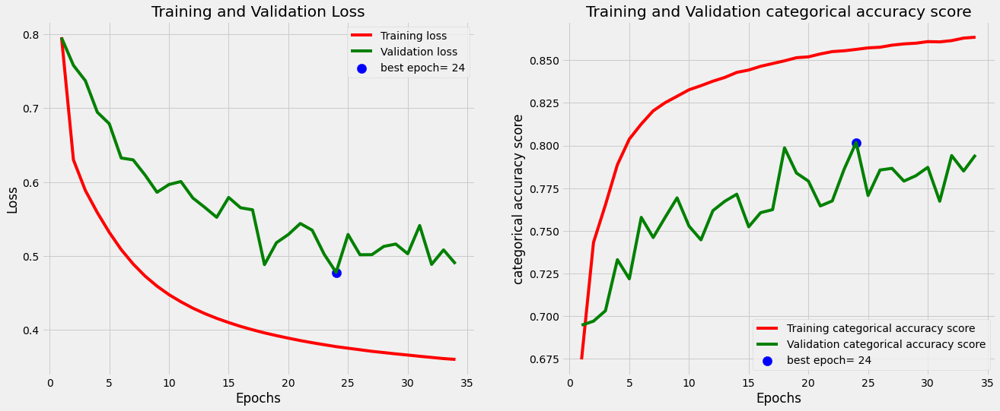

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.56      0.96      0.71       157
       Rings       0.96      0.77      0.86      4044
  Background       0.48      0.86      0.62       869

    accuracy                           0.79      5070
   macro avg       0.67      0.87      0.73      5070
weighted avg       0.87      0.79      0.81      5070

Epoch 1/100
1706/1706 [==============================] - 2s 985us/step - loss: 0.8007 - categorical_accuracy: 0.6712 - val_loss: 0.7799 - val_categorical_accuracy: 0.7501
Epoch 2/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.6347 - categorical_accuracy: 0.7430 - val_loss: 0.7341 - val_categorical_accuracy: 0.7310
Epoch 3/100
1706/1706 [==============================] - 3s 2ms/step - loss: 0.5920 - categorical_accuracy: 0.7634 - val_loss: 0.7345 - val_categorical_accuracy: 0.7002
Epoch 4/100
1706/1706 [==============================] - 3s 2ms

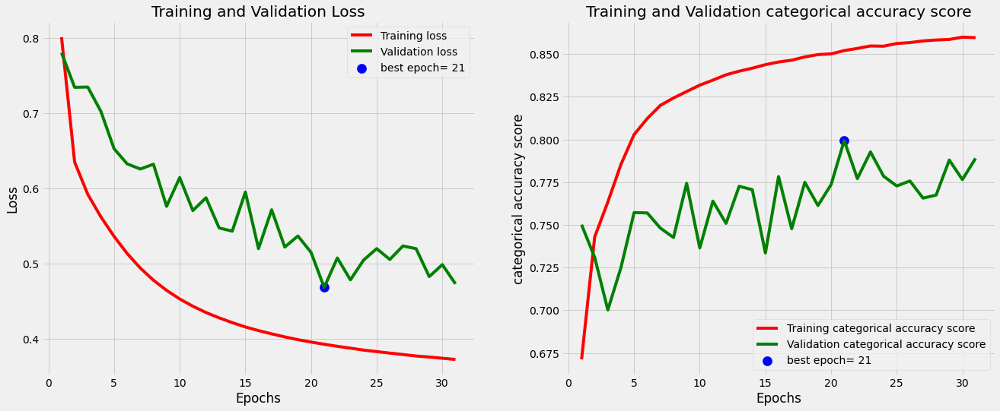

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.56      0.93      0.70       157
       Rings       0.95      0.78      0.86      4044
  Background       0.47      0.81      0.60       869

    accuracy                           0.79      5070
   macro avg       0.66      0.84      0.72      5070
weighted avg       0.86      0.79      0.81      5070

Epoch 1/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.8073 - categorical_accuracy: 0.6704 - val_loss: 0.8418 - val_categorical_accuracy: 0.5903
Epoch 2/100
1706/1706 [==============================] - 3s 2ms/step - loss: 0.6411 - categorical_accuracy: 0.7410 - val_loss: 0.7546 - val_categorical_accuracy: 0.6929
Epoch 3/100
1706/1706 [==============================] - 3s 2ms/step - loss: 0.5989 - categorical_accuracy: 0.7611 - val_loss: 0.7081 - val_categorical_accuracy: 0.7556
Epoch 4/100
1706/1706 [==============================] - 2s 1ms/s

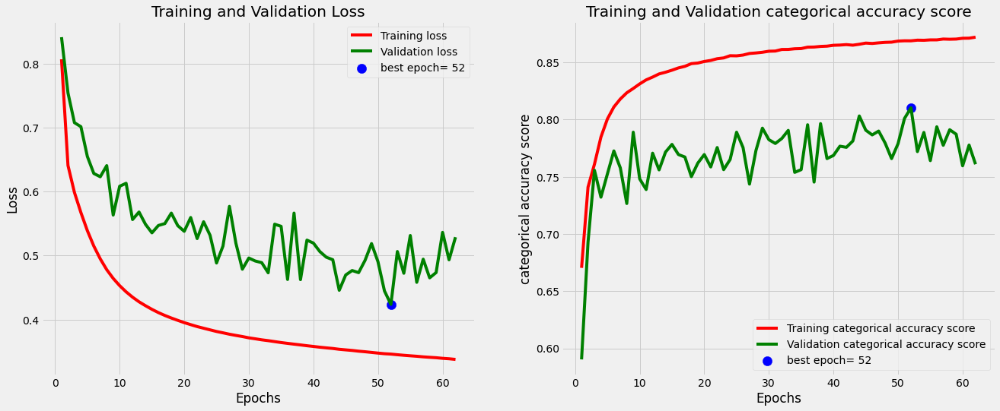

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.55      0.95      0.70       157
       Rings       0.98      0.72      0.83      4044
  Background       0.44      0.93      0.60       869

    accuracy                           0.76      5070
   macro avg       0.66      0.86      0.71      5070
weighted avg       0.87      0.76      0.78      5070

Epoch 1/100
1706/1706 [==============================] - 4s 2ms/step - loss: 0.8034 - categorical_accuracy: 0.6751 - val_loss: 0.7848 - val_categorical_accuracy: 0.7284
Epoch 2/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.6320 - categorical_accuracy: 0.7434 - val_loss: 0.7364 - val_categorical_accuracy: 0.7262
Epoch 3/100
1706/1706 [==============================] - 2s 967us/step - loss: 0.5903 - categorical_accuracy: 0.7621 - val_loss: 0.7080 - val_categorical_accuracy: 0.7465
Epoch 4/100
1706/1706 [==============================] - 1s 860

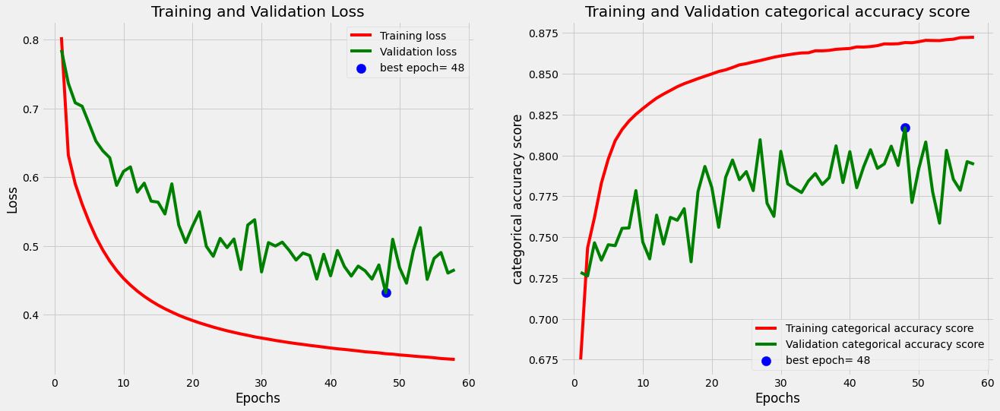

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.57      0.96      0.71       157
       Rings       0.97      0.77      0.86      4044
  Background       0.48      0.89      0.62       869

    accuracy                           0.79      5070
   macro avg       0.67      0.87      0.73      5070
weighted avg       0.87      0.79      0.81      5070

Model Performance (balanced accuracy) =  0.8583387225746414


In [266]:
baccs = []
for i in range(5):
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(3, activation='softmax')
    ])
    
    bacc = multilayer_perceptron_ros(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10) 
    baccs.append(bacc)

bacc = np.mean(baccs)
print("Model Performance (balanced accuracy) = ", bacc)

In [267]:
def multilayer_perceptron_aug(model, x_train_dataset, y_train_dataset, BATCH_SIZE, epochs, patience):
    
    class_names = ['Center', 'Rings', 'Background']

    # Normalize the dataset (re-scaling the data)
    x_train_dataset_n = x_train_dataset / 255.0
    
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset_n, y_train_dataset, test_size=0.1, stratify = y_train_dataset)
    
    center=Xtrain[np.where(Ytrain == 0)]
    ring=Xtrain[np.where(Ytrain == 1)]
    background=Xtrain[np.where(Ytrain == 2)]
        
    center_augm = data_augm(center, ring, 0)
    background_augm = data_augm(background, ring, 2)
        
    Xtrain_aug = np.vstack((center_augm, background_augm, ring))

    y_center = np.zeros(center_augm.shape[0])
    y_background = 2*np.ones(background_augm.shape[0])
    y_ring = np.ones(ring.shape[0])
    Ytrain_aug = np.concatenate([y_center, y_background, y_ring])

    n = Xtrain_aug.shape[0]
    shuffler = np.random.permutation(n)
    Xtrain_aug = Xtrain_aug[shuffler]
    Ytrain_aug = Ytrain_aug[shuffler]
        
    # Convert labels into one-hot-encoding format
    y_test_val = Ytest
    Ytrain_aug = to_categorical(Ytrain_aug)
    Ytest = to_categorical(Ytest)
    
    # Define patience    
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)
        
    # tf.keras.optimizers.SGD 
    model.compile(optimizer='sgd',
                  loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
                  metrics=[tf.keras.metrics.CategoricalAccuracy()])
    
    history = model.fit(Xtrain_aug, Ytrain_aug, batch_size=BATCH_SIZE, epochs=epochs, callbacks=[es], validation_data=(Xtest, Ytest))
            
    test_loss, test_acc = model.evaluate(Xtest,  Ytest, verbose=1)

    print('\nTest categorical accuracy:', test_acc)
    
    # predicting the testing set
    ypred = model.predict(Xtest)
    
    # Find the class with maximum probability
    y_test = []

    for i in range(len(ypred)):
        y_test.append(np.argmax(ypred[i]))
    
    balacc = balanced_accuracy_score(y_test_val, y_test)
    print('\n Balanced accuracy:', balacc)
    
    # predicting the testing set
    ypred = model.predict(Xtest)
    
    
    # ---------- plot learning curves:
    # Plot the training and validation data
    tacc=history.history['categorical_accuracy']
    tloss=history.history['loss']
    vacc=history.history['val_categorical_accuracy']
    vloss=history.history['val_loss']
    
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1)
    vc_label='best epoch= '+ str(index_acc + 1)
    
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
    axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training categorical accuracy score')
    axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation categorical accuracy score')
    axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation categorical accuracy score')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('categorical accuracy score')
    axes[1].legend()
    plt.tight_layout
    plt.show()
    
    clr = classification_report(y_test_val, y_test, target_names=class_names)
    print("Classification Report:\n----------------------\n", clr)
    
    return balacc

Epoch 1/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.8010 - categorical_accuracy: 0.6769 - val_loss: 0.8090 - val_categorical_accuracy: 0.7043
Epoch 2/100
1706/1706 [==============================] - 2s 967us/step - loss: 0.6305 - categorical_accuracy: 0.7453 - val_loss: 0.7584 - val_categorical_accuracy: 0.6856
Epoch 3/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.5893 - categorical_accuracy: 0.7667 - val_loss: 0.6906 - val_categorical_accuracy: 0.7471
Epoch 4/100
1706/1706 [==============================] - 3s 2ms/step - loss: 0.5601 - categorical_accuracy: 0.7885 - val_loss: 0.7227 - val_categorical_accuracy: 0.6980
Epoch 5/100
1706/1706 [==============================] - 3s 2ms/step - loss: 0.5352 - categorical_accuracy: 0.8013 - val_loss: 0.6690 - val_categorical_accuracy: 0.7314
Epoch 6/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.5139 - categorical_accuracy: 0.8099 - val_loss: 0.6557 - val_categorical_a

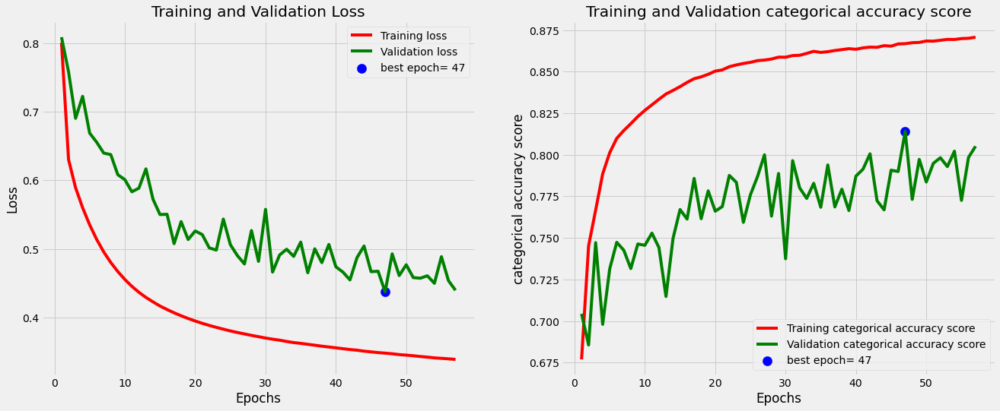

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.61      0.97      0.75       157
       Rings       0.97      0.78      0.87      4044
  Background       0.49      0.87      0.63       869

    accuracy                           0.81      5070
   macro avg       0.69      0.87      0.75      5070
weighted avg       0.87      0.81      0.82      5070

Epoch 1/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.8208 - categorical_accuracy: 0.6459 - val_loss: 0.8075 - val_categorical_accuracy: 0.7022
Epoch 2/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.6430 - categorical_accuracy: 0.7370 - val_loss: 0.7291 - val_categorical_accuracy: 0.7276
Epoch 3/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.5976 - categorical_accuracy: 0.7628 - val_loss: 0.7235 - val_categorical_accuracy: 0.7128
Epoch 4/100
1706/1706 [==============================] - 2s 1ms/s

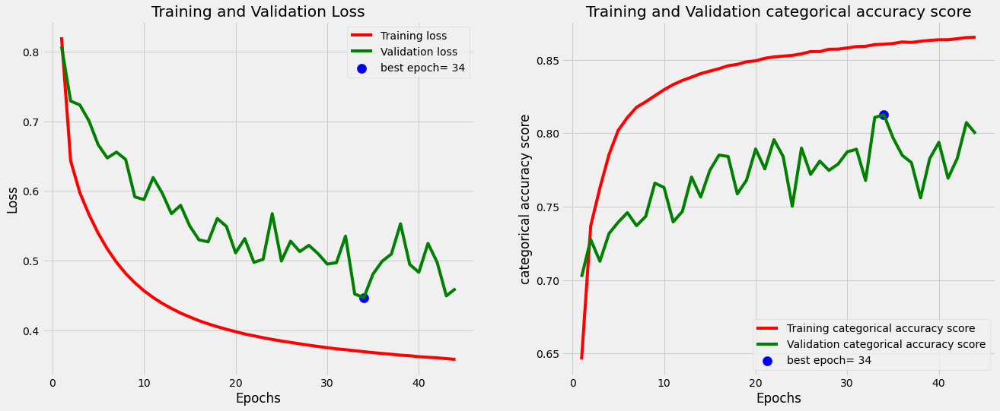

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.59      0.97      0.73       157
       Rings       0.96      0.79      0.86      4044
  Background       0.48      0.84      0.61       869

    accuracy                           0.80      5070
   macro avg       0.68      0.86      0.74      5070
weighted avg       0.87      0.80      0.82      5070

Epoch 1/100
1706/1706 [==============================] - 3s 1ms/step - loss: 0.7994 - categorical_accuracy: 0.6787 - val_loss: 0.8176 - val_categorical_accuracy: 0.6714
Epoch 2/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.6278 - categorical_accuracy: 0.7527 - val_loss: 0.7814 - val_categorical_accuracy: 0.6499
Epoch 3/100
1706/1706 [==============================] - 2s 978us/step - loss: 0.5852 - categorical_accuracy: 0.7725 - val_loss: 0.7339 - val_categorical_accuracy: 0.6903
Epoch 4/100
1706/1706 [==============================] - 2s 992

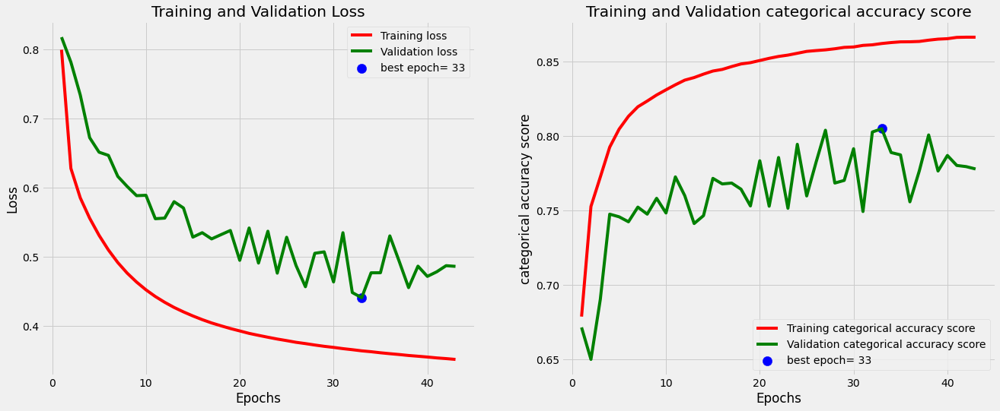

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.55      0.96      0.70       157
       Rings       0.97      0.75      0.84      4044
  Background       0.46      0.89      0.61       869

    accuracy                           0.78      5070
   macro avg       0.66      0.87      0.72      5070
weighted avg       0.87      0.78      0.80      5070

Epoch 1/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.8001 - categorical_accuracy: 0.6782 - val_loss: 0.7960 - val_categorical_accuracy: 0.7093
Epoch 2/100
1706/1706 [==============================] - 3s 2ms/step - loss: 0.6344 - categorical_accuracy: 0.7410 - val_loss: 0.8029 - val_categorical_accuracy: 0.6245
Epoch 3/100
1706/1706 [==============================] - 3s 2ms/step - loss: 0.5923 - categorical_accuracy: 0.7607 - val_loss: 0.7248 - val_categorical_accuracy: 0.7258
Epoch 4/100
1706/1706 [==============================] - 2s 1ms/s

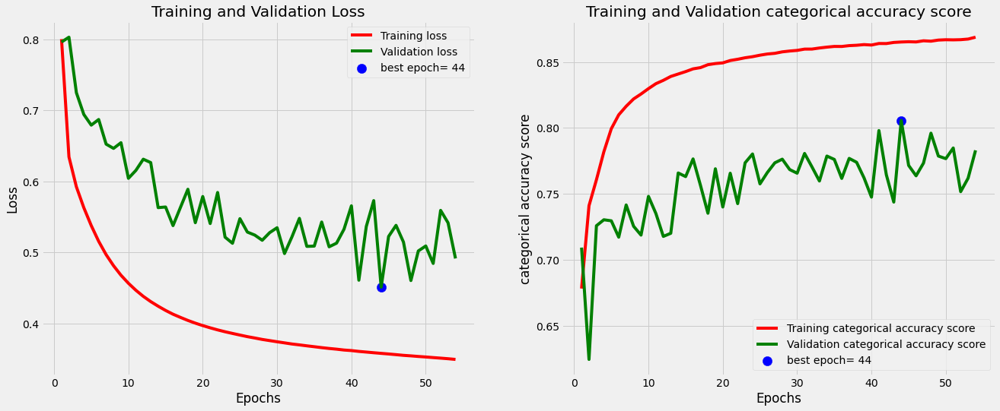

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.57      0.99      0.72       157
       Rings       0.97      0.75      0.85      4044
  Background       0.46      0.88      0.61       869

    accuracy                           0.78      5070
   macro avg       0.67      0.87      0.73      5070
weighted avg       0.87      0.78      0.80      5070

Epoch 1/100
1706/1706 [==============================] - 3s 1ms/step - loss: 0.8174 - categorical_accuracy: 0.6489 - val_loss: 0.8254 - val_categorical_accuracy: 0.6272
Epoch 2/100
1706/1706 [==============================] - 2s 1ms/step - loss: 0.6447 - categorical_accuracy: 0.7299 - val_loss: 0.7447 - val_categorical_accuracy: 0.7116
Epoch 3/100
1706/1706 [==============================] - 3s 2ms/step - loss: 0.6053 - categorical_accuracy: 0.7509 - val_loss: 0.7097 - val_categorical_accuracy: 0.7367
Epoch 4/100
1706/1706 [==============================] - 3s 2ms/s

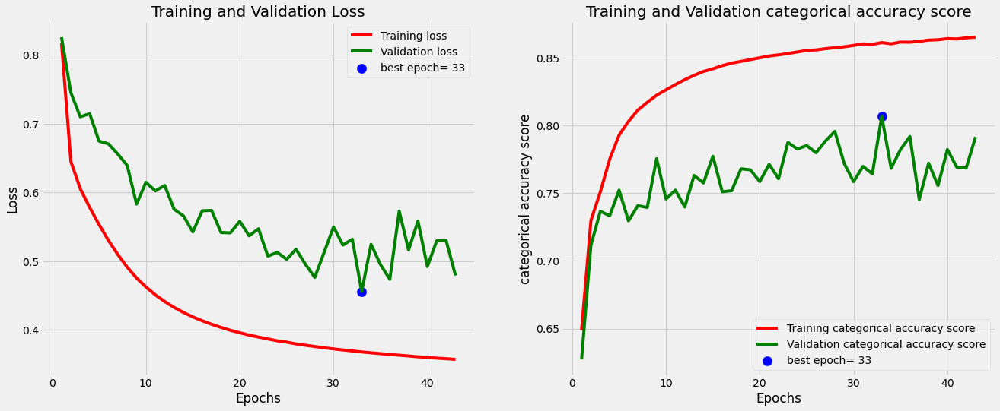

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.56      0.96      0.71       157
       Rings       0.96      0.77      0.86      4044
  Background       0.47      0.84      0.61       869

    accuracy                           0.79      5070
   macro avg       0.67      0.86      0.72      5070
weighted avg       0.87      0.79      0.81      5070

Model Performance (balanced accuracy) =  0.8671787984691367


In [268]:
baccs = []
for i in range(5):
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(3, activation='softmax')
    ])
    
    bacc = multilayer_perceptron_ros(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10) 
    baccs.append(bacc)

bacc = np.mean(baccs)
print("Model Performance (balanced accuracy) = ", bacc)

#### CNN with Oversampling

In [292]:
def CNN_model_ros(model, x_train_dataset, y_train_dataset, epochs, batch_size, patience):

    class_names = ['Center', 'Rings', 'Background']
    
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset, y_train_dataset, test_size=0.1, stratify = y_train_dataset)
    
    ros = RandomOverSampler(random_state=1)
    x_ros, y_ros = ros.fit_resample(Xtrain, Ytrain)
    
    x_ros = x_ros.reshape((-1,5, 5, 3))
    x_ros =x_ros.astype('float32')
    x_ros = x_ros / 255.
    
    Xtest = Xtest.reshape((-1,5, 5, 3))
    Xtest = Xtest.astype('float32')
    Xtest = Xtest / 255.
    
    y_val_ground = Ytest
    
    # Convert labels into one-hot-encoding format
    y_ros = to_categorical(y_ros)
    Ytest = to_categorical(Ytest)
    
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)
        
    # como tf.keras.optimizers.SGD 
    model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False), optimizer=keras.optimizers.Adam(),metrics=['categorical_accuracy'])
    
    train = model.fit(x_ros, y_ros, batch_size=batch_size, epochs=epochs, verbose = 1, callbacks=[es], validation_data=(Xtest, Ytest))
            
    test_loss, test_acc = model.evaluate(Xtest,  Ytest, verbose=0)
    
    # predicting the testing set
    ypred = model.predict(Xtest)

    y_test = []

    for i in range(len(ypred)):
        y_test.append(np.argmax(ypred[i]))
    
    balacc = balanced_accuracy_score(y_val_ground, y_test)

    print('\nTest categorical accuracy:', test_acc)
    print('\n Balanced accuracy:', balacc)
    
    # ---------- plot learning curves:
    # Plot the training and validation data
    tacc=train.history['categorical_accuracy']
    tloss=train.history['loss']
    vacc=train.history['val_categorical_accuracy']
    vloss=train.history['val_loss']
    
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1)
    vc_label='best epoch= '+ str(index_acc + 1)
    
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
    axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training categorical accuracy score')
    axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation categorical accuracy score')
    axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation categorical accuracy score')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('categorical accuracy score')
    axes[1].legend()
    plt.tight_layout
    plt.show()
    # -------------------
    
    clr = classification_report(y_val_ground, y_test, target_names=class_names)
    print("Classification Report:\n----------------------\n", clr)
    
    return balacc

Epoch 1/20
1706/1706 [==============================] - 8s 4ms/step - loss: 0.4182 - categorical_accuracy: 0.8253 - val_loss: 0.4436 - val_categorical_accuracy: 0.7982
Epoch 2/20
1706/1706 [==============================] - 10s 6ms/step - loss: 0.3084 - categorical_accuracy: 0.8753 - val_loss: 0.3514 - val_categorical_accuracy: 0.8420
Epoch 3/20
1706/1706 [==============================] - 8s 5ms/step - loss: 0.2760 - categorical_accuracy: 0.8873 - val_loss: 0.4270 - val_categorical_accuracy: 0.8016
Epoch 4/20
1706/1706 [==============================] - 10s 6ms/step - loss: 0.2562 - categorical_accuracy: 0.8950 - val_loss: 0.3804 - val_categorical_accuracy: 0.8260
Epoch 5/20
1706/1706 [==============================] - 10s 6ms/step - loss: 0.2391 - categorical_accuracy: 0.9015 - val_loss: 0.3314 - val_categorical_accuracy: 0.8503
Epoch 6/20
1706/1706 [==============================] - 8s 5ms/step - loss: 0.2283 - categorical_accuracy: 0.9057 - val_loss: 0.3424 - val_categorical_accura

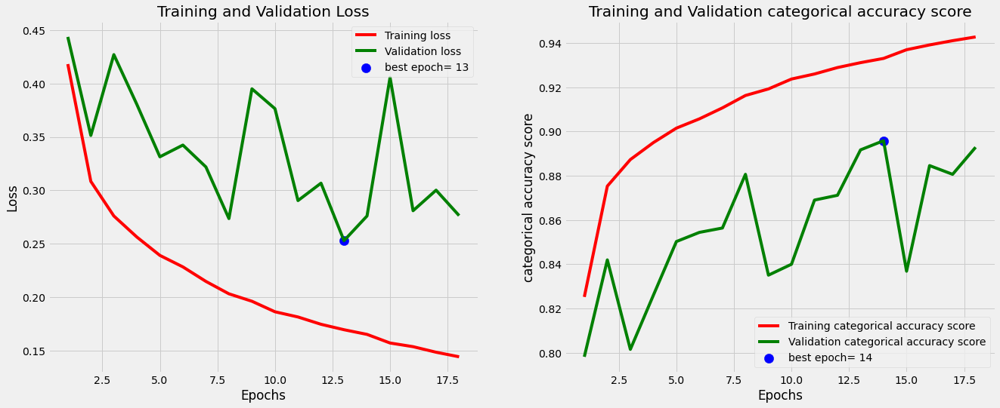

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.78      0.96      0.86       157
       Rings       0.96      0.90      0.93      4044
  Background       0.67      0.85      0.75       869

    accuracy                           0.89      5070
   macro avg       0.80      0.90      0.85      5070
weighted avg       0.91      0.89      0.90      5070

Epoch 1/20
1706/1706 [==============================] - 20s 11ms/step - loss: 0.4084 - categorical_accuracy: 0.8298 - val_loss: 0.5322 - val_categorical_accuracy: 0.7404
Epoch 2/20
1706/1706 [==============================] - 16s 9ms/step - loss: 0.3058 - categorical_accuracy: 0.8777 - val_loss: 0.3721 - val_categorical_accuracy: 0.8189
Epoch 3/20
1706/1706 [==============================] - 12s 7ms/step - loss: 0.2732 - categorical_accuracy: 0.8895 - val_loss: 0.4751 - val_categorical_accuracy: 0.7862
Epoch 4/20
1706/1706 [==============================] - 12s 7ms/

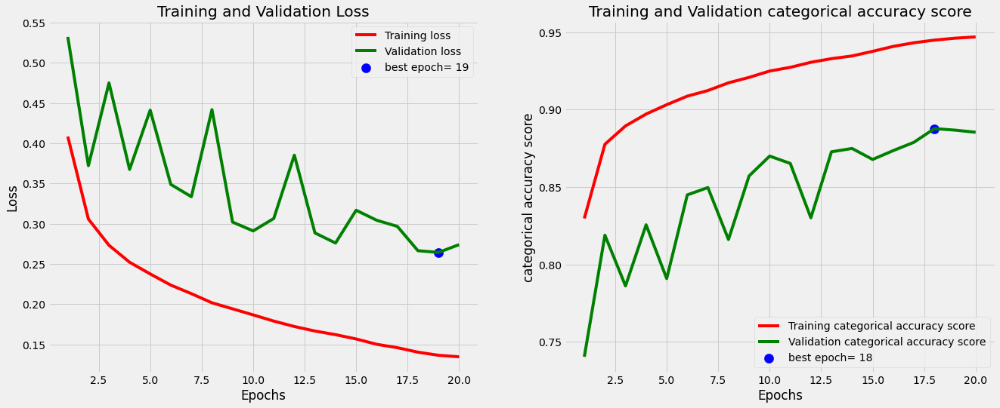

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.87      0.95      0.91       157
       Rings       0.97      0.88      0.92      4044
  Background       0.63      0.90      0.74       869

    accuracy                           0.89      5070
   macro avg       0.82      0.91      0.86      5070
weighted avg       0.91      0.89      0.89      5070

Epoch 1/20
1706/1706 [==============================] - 12s 7ms/step - loss: 0.4146 - categorical_accuracy: 0.8262 - val_loss: 0.4203 - val_categorical_accuracy: 0.8073
Epoch 2/20
1706/1706 [==============================] - 12s 7ms/step - loss: 0.3083 - categorical_accuracy: 0.8753 - val_loss: 0.3776 - val_categorical_accuracy: 0.8373
Epoch 3/20
1706/1706 [==============================] - 8s 5ms/step - loss: 0.2771 - categorical_accuracy: 0.8872 - val_loss: 0.3228 - val_categorical_accuracy: 0.8550
Epoch 4/20
1706/1706 [==============================] - 11s 7ms/st

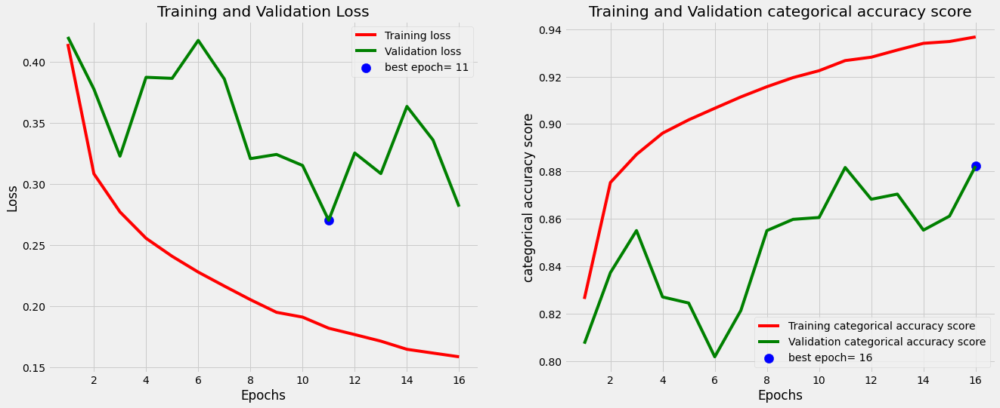

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.89      0.90      0.89       157
       Rings       0.97      0.88      0.92      4044
  Background       0.63      0.87      0.73       869

    accuracy                           0.88      5070
   macro avg       0.83      0.88      0.85      5070
weighted avg       0.91      0.88      0.89      5070

Epoch 1/20
1706/1706 [==============================] - 9s 5ms/step - loss: 0.4187 - categorical_accuracy: 0.8271 - val_loss: 0.3956 - val_categorical_accuracy: 0.8136
Epoch 2/20
1706/1706 [==============================] - 10s 6ms/step - loss: 0.3146 - categorical_accuracy: 0.8743 - val_loss: 0.4976 - val_categorical_accuracy: 0.7761
Epoch 3/20
1706/1706 [==============================] - 11s 7ms/step - loss: 0.2813 - categorical_accuracy: 0.8868 - val_loss: 0.5674 - val_categorical_accuracy: 0.7475
Epoch 4/20
1706/1706 [==============================] - 8s 5ms/ste

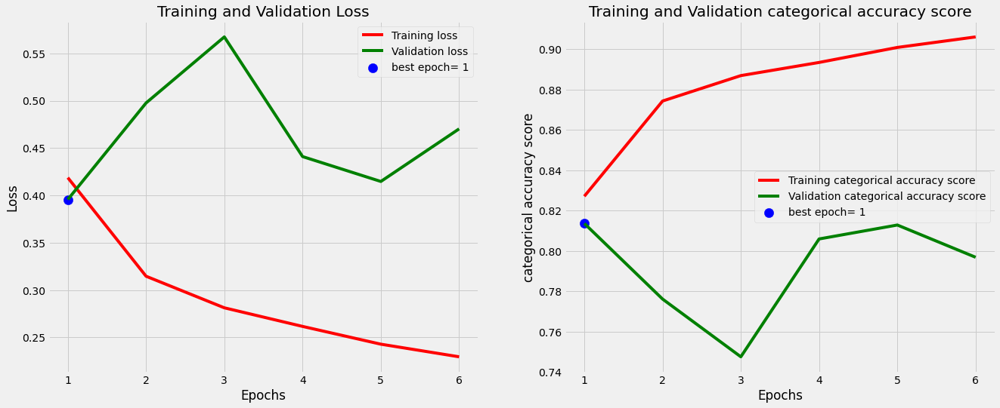

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.75      0.97      0.85       157
       Rings       0.99      0.76      0.86      4044
  Background       0.47      0.96      0.63       869

    accuracy                           0.80      5070
   macro avg       0.74      0.90      0.78      5070
weighted avg       0.89      0.80      0.82      5070

Epoch 1/20
1706/1706 [==============================] - 9s 5ms/step - loss: 0.4074 - categorical_accuracy: 0.8311 - val_loss: 0.6636 - val_categorical_accuracy: 0.7049
Epoch 2/20
1706/1706 [==============================] - 10s 6ms/step - loss: 0.3081 - categorical_accuracy: 0.8751 - val_loss: 0.3684 - val_categorical_accuracy: 0.8223
Epoch 3/20
1706/1706 [==============================] - 8s 5ms/step - loss: 0.2766 - categorical_accuracy: 0.8868 - val_loss: 0.4251 - val_categorical_accuracy: 0.8101
Epoch 4/20
1706/1706 [==============================] - 11s 6ms/ste

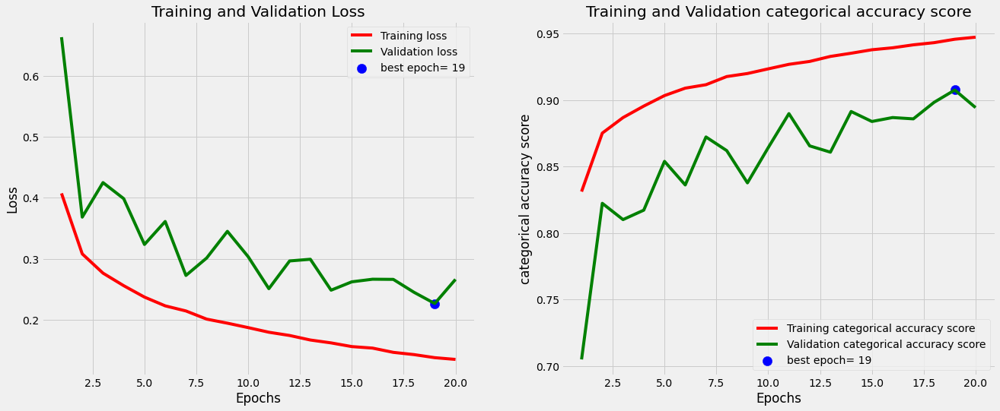

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.93      0.94      0.94       157
       Rings       0.98      0.89      0.93      4044
  Background       0.64      0.91      0.75       869

    accuracy                           0.89      5070
   macro avg       0.85      0.91      0.87      5070
weighted avg       0.92      0.89      0.90      5070

Model Performance (balanced accuracy) =  0.9006299249348156


In [294]:
batch_size = 64
epochs = 20
patience = 5

acc_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters = 32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(5, 5, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(filters = 64, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(3, activation='softmax')) #Output layer
    
    acc = CNN_model_ros(cnn, x_train_dataset, y_train_dataset, epochs, batch_size, patience)
    acc_scores.append(acc)

acc = np.mean(acc_scores)
print("Model Performance (balanced accuracy) = ", acc)

In [295]:
def CNN_model_aug(model, x_train_dataset, y_train_dataset, epochs, batch_size, patience):

    class_names = ['Center', 'Rings', 'Background']
    
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset, y_train_dataset, test_size=0.1, stratify = y_train_dataset)
    
    center=Xtrain[np.where(Ytrain == 0)]
    ring=Xtrain[np.where(Ytrain == 1)]
    background=Xtrain[np.where(Ytrain == 2)]
        
    center_augm = data_augm(center, ring, 0)
    background_augm = data_augm(background, ring, 2)
        
    Xtrain_aug = np.vstack((center_augm, background_augm, ring))

    y_center = np.zeros(center_augm.shape[0])
    y_background = 2*np.ones(background_augm.shape[0])
    y_ring = np.ones(ring.shape[0])
    Ytrain_aug = np.concatenate([y_center, y_background, y_ring])

    n = Xtrain_aug.shape[0]
    shuffler = np.random.permutation(n)
    Xtrain_aug = Xtrain_aug[shuffler]
    Ytrain_aug = Ytrain_aug[shuffler]
    
    Xtrain_aug = Xtrain_aug.reshape((-1,5, 5, 3))
    Xtrain_aug = Xtrain_aug.astype('float32')
    Xtrain_aug = Xtrain_aug / 255.
    
    Xtest = Xtest.reshape((-1,5, 5, 3))
    Xtest = Xtest.astype('float32')
    Xtest = Xtest / 255.
    
    y_val_ground = Ytest
    
    # Convert labels into one-hot-encoding format
    Ytrain_aug = to_categorical(Ytrain_aug)
    Ytest = to_categorical(Ytest)
    
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)
        
    # como tf.keras.optimizers.SGD 
    model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False), optimizer=keras.optimizers.Adam(),metrics=['categorical_accuracy'])
    
    train = model.fit(Xtrain_aug, Ytrain_aug, batch_size=batch_size, epochs=epochs, verbose = 1, callbacks=[es], validation_data=(Xtest, Ytest))
            
    test_loss, test_acc = model.evaluate(Xtest,  Ytest, verbose=0)
    
    # predicting the testing set
    ypred = model.predict(Xtest)

    y_test = []

    for i in range(len(ypred)):
        y_test.append(np.argmax(ypred[i]))
    
    balacc = balanced_accuracy_score(y_val_ground, y_test)

    print('\nTest categorical accuracy:', test_acc)
    print('\n Balanced accuracy:', balacc)
    
    # ---------- plot learning curves:
    # Plot the training and validation data
    tacc=train.history['categorical_accuracy']
    tloss=train.history['loss']
    vacc=train.history['val_categorical_accuracy']
    vloss=train.history['val_loss']
    
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1)
    vc_label='best epoch= '+ str(index_acc + 1)
    
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
    axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training categorical accuracy score')
    axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation categorical accuracy score')
    axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation categorical accuracy score')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('categorical accuracy score')
    axes[1].legend()
    plt.tight_layout
    plt.show()
    # -------------------
    
    clr = classification_report(y_val_ground, y_test, target_names=class_names)
    print("Classification Report:\n----------------------\n", clr)
    
    return balacc

Epoch 1/20
1706/1706 [==============================] - 9s 5ms/step - loss: 0.4456 - categorical_accuracy: 0.8146 - val_loss: 0.5168 - val_categorical_accuracy: 0.7633
Epoch 2/20
1706/1706 [==============================] - 9s 5ms/step - loss: 0.3525 - categorical_accuracy: 0.8578 - val_loss: 0.5858 - val_categorical_accuracy: 0.7164
Epoch 3/20
1706/1706 [==============================] - 8s 5ms/step - loss: 0.3250 - categorical_accuracy: 0.8694 - val_loss: 0.7090 - val_categorical_accuracy: 0.6751
Epoch 4/20
1706/1706 [==============================] - 10s 6ms/step - loss: 0.3092 - categorical_accuracy: 0.8755 - val_loss: 0.3954 - val_categorical_accuracy: 0.8118
Epoch 5/20
1706/1706 [==============================] - 8s 4ms/step - loss: 0.2977 - categorical_accuracy: 0.8796 - val_loss: 0.4960 - val_categorical_accuracy: 0.7641
Epoch 6/20
1706/1706 [==============================] - 10s 6ms/step - loss: 0.2885 - categorical_accuracy: 0.8836 - val_loss: 0.3378 - val_categorical_accurac

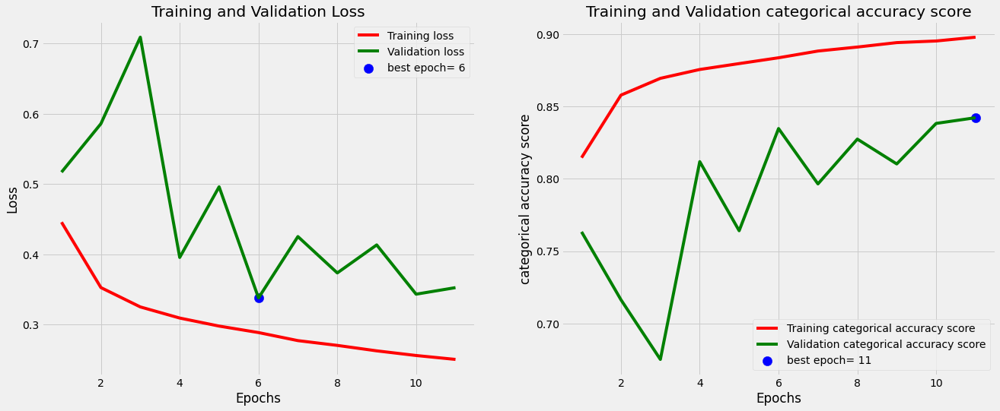

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.58      0.95      0.72       157
       Rings       0.97      0.83      0.89      4044
  Background       0.57      0.87      0.69       869

    accuracy                           0.84      5070
   macro avg       0.70      0.88      0.77      5070
weighted avg       0.89      0.84      0.85      5070

Epoch 1/20
1706/1706 [==============================] - 10s 6ms/step - loss: 0.4477 - categorical_accuracy: 0.8133 - val_loss: 0.5662 - val_categorical_accuracy: 0.7213
Epoch 2/20
1706/1706 [==============================] - 9s 5ms/step - loss: 0.3563 - categorical_accuracy: 0.8557 - val_loss: 0.5306 - val_categorical_accuracy: 0.7479
Epoch 3/20
1706/1706 [==============================] - 11s 6ms/step - loss: 0.3313 - categorical_accuracy: 0.8658 - val_loss: 0.4754 - val_categorical_accuracy: 0.7779
Epoch 4/20
1706/1706 [==============================] - 9s 5ms/ste

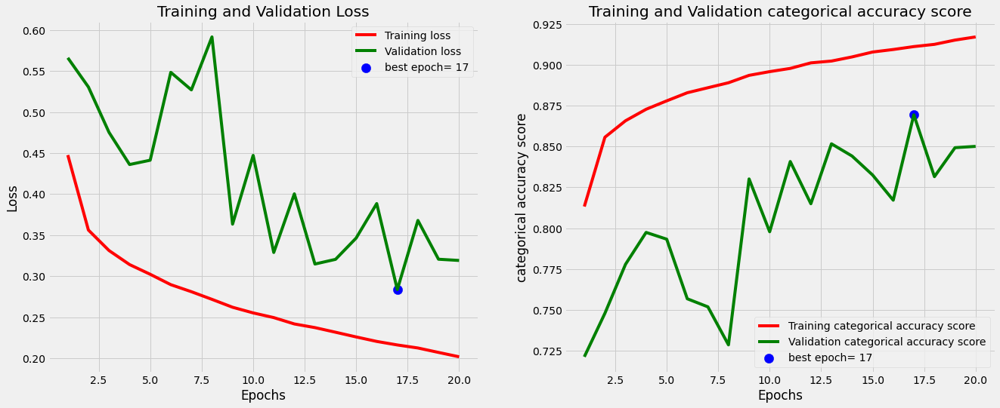

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.55      0.96      0.70       157
       Rings       0.97      0.84      0.90      4044
  Background       0.59      0.87      0.70       869

    accuracy                           0.85      5070
   macro avg       0.70      0.89      0.77      5070
weighted avg       0.89      0.85      0.86      5070

Epoch 1/20
1706/1706 [==============================] - 9s 5ms/step - loss: 0.4393 - categorical_accuracy: 0.8133 - val_loss: 0.5416 - val_categorical_accuracy: 0.7406
Epoch 2/20
1706/1706 [==============================] - 9s 6ms/step - loss: 0.3458 - categorical_accuracy: 0.8589 - val_loss: 0.4791 - val_categorical_accuracy: 0.7700
Epoch 3/20
1706/1706 [==============================] - 12s 7ms/step - loss: 0.3210 - categorical_accuracy: 0.8688 - val_loss: 0.4066 - val_categorical_accuracy: 0.8041
Epoch 4/20
1706/1706 [==============================] - 8s 5ms/step

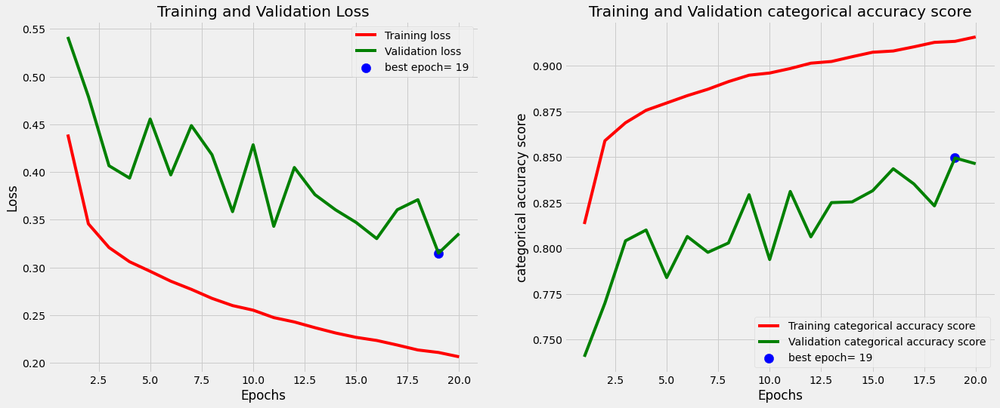

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.64      0.96      0.77       157
       Rings       0.98      0.83      0.90      4044
  Background       0.56      0.91      0.70       869

    accuracy                           0.85      5070
   macro avg       0.73      0.90      0.79      5070
weighted avg       0.89      0.85      0.86      5070

Epoch 1/20
1706/1706 [==============================] - 9s 5ms/step - loss: 0.4429 - categorical_accuracy: 0.8145 - val_loss: 0.4670 - val_categorical_accuracy: 0.7698
Epoch 2/20
1706/1706 [==============================] - 9s 5ms/step - loss: 0.3507 - categorical_accuracy: 0.8592 - val_loss: 0.5165 - val_categorical_accuracy: 0.7473
Epoch 3/20
1706/1706 [==============================] - 11s 7ms/step - loss: 0.3245 - categorical_accuracy: 0.8692 - val_loss: 0.5133 - val_categorical_accuracy: 0.7602
Epoch 4/20
1706/1706 [==============================] - 8s 5ms/step

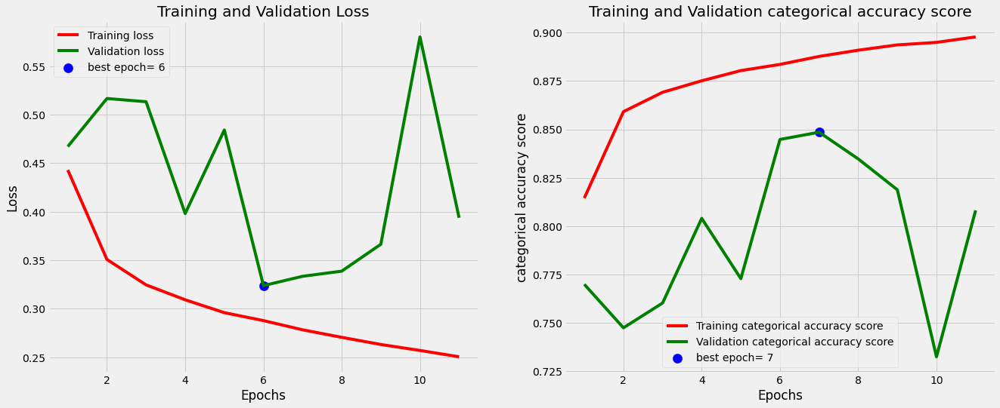

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.63      0.99      0.77       157
       Rings       0.98      0.78      0.87      4044
  Background       0.50      0.91      0.64       869

    accuracy                           0.81      5070
   macro avg       0.70      0.89      0.76      5070
weighted avg       0.88      0.81      0.82      5070

Epoch 1/20
1706/1706 [==============================] - 9s 5ms/step - loss: 0.4435 - categorical_accuracy: 0.8157 - val_loss: 0.4630 - val_categorical_accuracy: 0.7637
Epoch 2/20
1706/1706 [==============================] - 11s 6ms/step - loss: 0.3504 - categorical_accuracy: 0.8599 - val_loss: 0.3831 - val_categorical_accuracy: 0.8193
Epoch 3/20
1706/1706 [==============================] - 12s 7ms/step - loss: 0.3265 - categorical_accuracy: 0.8697 - val_loss: 0.3930 - val_categorical_accuracy: 0.8130
Epoch 4/20
1706/1706 [==============================] - 8s 4ms/ste

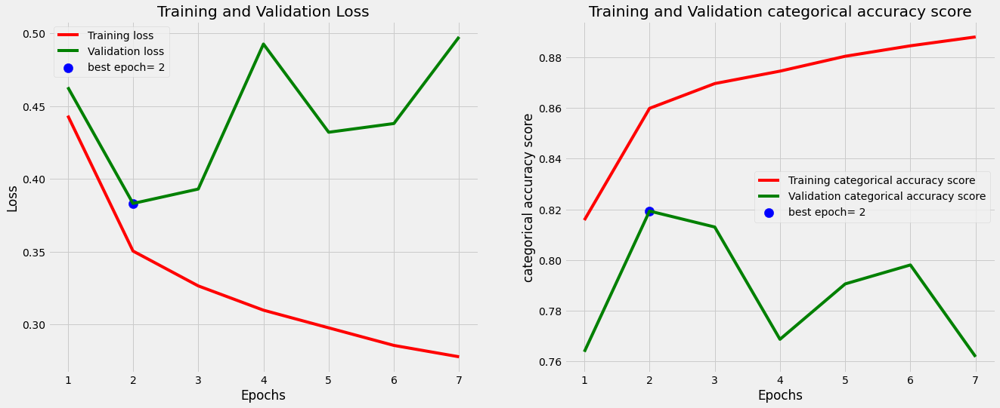

Classification Report:
----------------------
               precision    recall  f1-score   support

      Center       0.53      0.99      0.69       157
       Rings       0.99      0.71      0.83      4044
  Background       0.45      0.95      0.61       869

    accuracy                           0.76      5070
   macro avg       0.66      0.89      0.71      5070
weighted avg       0.88      0.76      0.78      5070

Model Performance (balanced accuracy) =  0.8897914643760328


In [296]:
batch_size = 64
epochs = 20
patience = 5

acc_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters = 32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(5, 5, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(filters = 64, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(3, activation='softmax')) #Output layer
    
    acc = CNN_model_aug(cnn, x_train_dataset, y_train_dataset, epochs, batch_size, patience)
    acc_scores.append(acc)

acc = np.mean(acc_scores)
print("Model Performance (balanced accuracy) = ", acc)

## Visualize the segmentation masks obtained by the best models

In [37]:
x_train_dataset_n = scaler.fit_transform(x_train_dataset)

ros = RandomOverSampler(random_state=1)
x_ros, y_ros = ros.fit_resample(x_train_dataset_n, y_train_dataset)

bagged_knn = KNeighborsClassifier(n_neighbors=3, weights='distance')

bagging_model = BaggingClassifier(bagged_knn, n_estimators=20, random_state = 1)

bagging_model.fit(x_ros, y_ros)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=3,
                                                      weights='distance'),
                  n_estimators=20, random_state=1)

Epoch 1/20
1706/1706 [==============================] - 8s 4ms/step - loss: 0.4171 - categorical_accuracy: 0.8256 - val_loss: 0.4518 - val_categorical_accuracy: 0.7830
Epoch 2/20
1706/1706 [==============================] - 9s 5ms/step - loss: 0.3108 - categorical_accuracy: 0.8749 - val_loss: 0.5189 - val_categorical_accuracy: 0.7590
Epoch 3/20
1706/1706 [==============================] - 8s 5ms/step - loss: 0.2798 - categorical_accuracy: 0.8871 - val_loss: 0.2969 - val_categorical_accuracy: 0.8627
Epoch 4/20
1706/1706 [==============================] - 10s 6ms/step - loss: 0.2585 - categorical_accuracy: 0.8956 - val_loss: 0.4528 - val_categorical_accuracy: 0.7963
Epoch 5/20
1706/1706 [==============================] - 10s 6ms/step - loss: 0.2417 - categorical_accuracy: 0.9023 - val_loss: 0.3566 - val_categorical_accuracy: 0.8333
Epoch 6/20
1706/1706 [==============================] - 8s 5ms/step - loss: 0.2257 - categorical_accuracy: 0.9080 - val_loss: 0.3653 - val_categorical_accurac

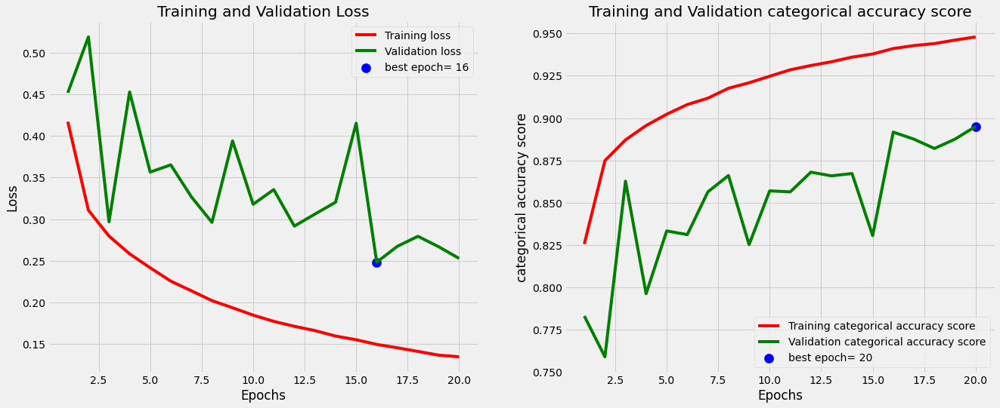

              precision    recall  f1-score   support

           0       0.78      0.95      0.85       157
           1       0.97      0.90      0.93      4044
           2       0.67      0.88      0.76       869

    accuracy                           0.90      5070
   macro avg       0.81      0.91      0.85      5070
weighted avg       0.91      0.90      0.90      5070



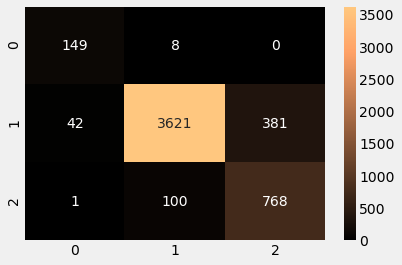

In [38]:
batch_size = 64
epochs = 20
patience = 5

# Cross-validation:
Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset, y_train_dataset, test_size=0.1, stratify = y_train_dataset, random_state = 1)
    
ros = RandomOverSampler(random_state=1)
x_ros, y_ros = ros.fit_resample(Xtrain, Ytrain)

x_ros = x_ros.reshape((-1,5, 5, 3))
x_ros =x_ros.astype('float32')
x_ros = x_ros / 255.
    
Xtest = Xtest.reshape((-1,5, 5, 3))
Xtest = Xtest.astype('float32')
Xtest = Xtest / 255.
    
y_val_ground = Ytest
    
# Convert labels into one-hot-encoding format
y_ros = to_categorical(y_ros)
Ytest = to_categorical(Ytest)
    
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)

model = Sequential()
model.add(Conv2D(filters = 32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(5, 5, 3),padding='same')) #Convolution layer
model.add(MaxPooling2D(pool_size=(2, 2),padding='same')) #Pooling layer
model.add(Conv2D(filters = 64, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

model.add(Flatten())
model.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
model.add(Dense(3, activation='softmax')) #Output layer
        
# como tf.keras.optimizers.SGD 
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False), optimizer=keras.optimizers.Adam(),metrics=['categorical_accuracy'])
    
train = model.fit(x_ros, y_ros, batch_size=batch_size, epochs=epochs, verbose = 1, callbacks=[es], validation_data=(Xtest, Ytest))
            
test_loss, test_acc = model.evaluate(Xtest,  Ytest, verbose=0)
    
# predicting the testing set
ypred = model.predict(Xtest)

y_test = []

for i in range(len(ypred)):
    y_test.append(np.argmax(ypred[i]))
    
balacc = balanced_accuracy_score(y_val_ground, y_test)

print('\nTest categorical accuracy:', test_acc)
print('\n Balanced accuracy:', balacc)
    
# ---------- plot learning curves:
# Plot the training and validation data
tacc=train.history['categorical_accuracy']
tloss=train.history['loss']
vacc=train.history['val_categorical_accuracy']
vloss=train.history['val_loss']
    
index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
val_lowest=vloss[index_loss]
index_acc=np.argmax(vacc)
acc_highest=vacc[index_acc]
    
plt.style.use('fivethirtyeight')
sc_label='best epoch= '+ str(index_loss+1)
vc_label='best epoch= '+ str(index_acc + 1)
    
fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
axes[0].set_title('Training and Validation Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training categorical accuracy score')
axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation categorical accuracy score')
axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
axes[1].set_title('Training and Validation categorical accuracy score')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('categorical accuracy score')
axes[1].legend()
plt.tight_layout
plt.show()

print(classification_report(y_val_ground,y_test))
conf_matrix = confusion_matrix(y_val_ground, y_test)
sns.heatmap(conf_matrix, annot=True,fmt='d', cmap=plt.cm.copper)
plt.show()

In [40]:
classifier = RandomForestClassifier(criterion = 'entropy', 
                                    max_depth = 25, 
                                    min_samples_split = 50,
                                    class_weight = 'balanced',
                                    random_state=1)

classifier.fit(x_train_dataset, y_train_dataset)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=25, min_samples_split=50, random_state=1)

In [42]:
from PIL import Image

image_1 = np.array(Image.open('image0006_M1.tif'))
image_2 = np.array(Image.open('image0018_Cu1.tif'))
image_3 = np.array(Image.open('image0018_M1.tif'))
image_4 = np.array(Image.open('Image0050_Cu1.tif'))
image_5 = np.array(Image.open('image00D2V_Cu1.tif'))
image_6 = np.array(Image.open('image00D3V_Cu1.tif'))
image_7 = np.array(Image.open('image00D4D_Cu1.tif'))

images_array = [image_1, image_2, image_3, image_4, image_5, image_6, image_7]


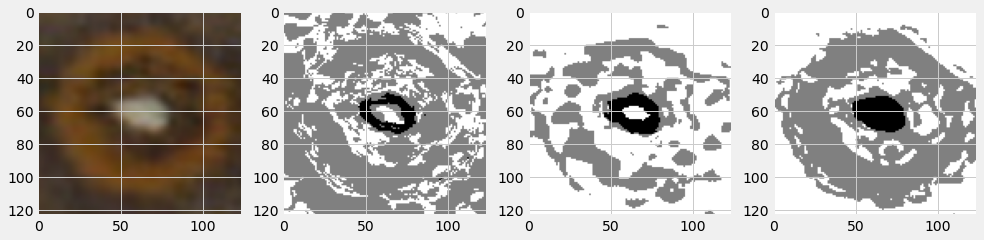

Counter({1: 10326, 2: 4659, 0: 391})
Counter({2: 10589, 1: 4288, 0: 499})
Counter({1: 7486, 2: 7352, 0: 538})


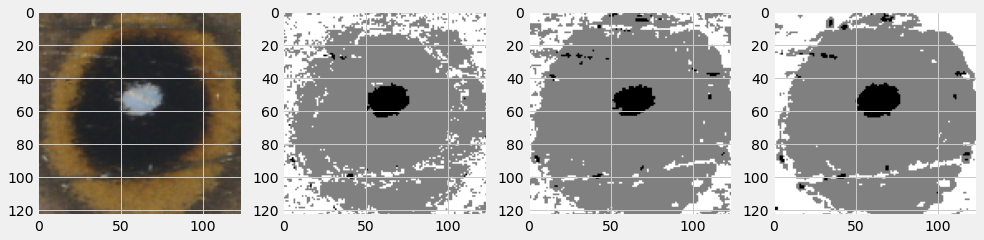

Counter({1: 10604, 2: 4350, 0: 422})
Counter({1: 12007, 2: 2899, 0: 470})
Counter({1: 10877, 2: 3945, 0: 554})


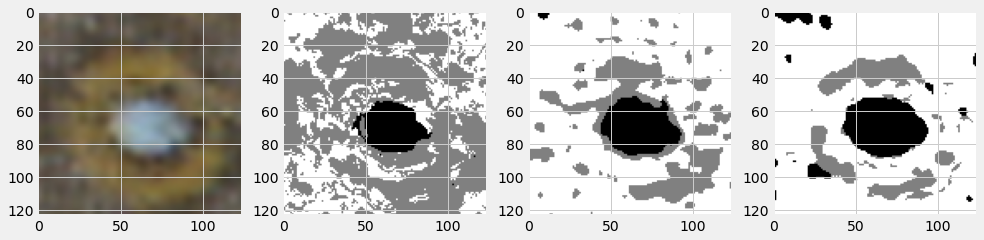

Counter({1: 9015, 2: 5404, 0: 957})
Counter({2: 10892, 1: 3218, 0: 1266})
Counter({2: 11706, 1: 1841, 0: 1829})


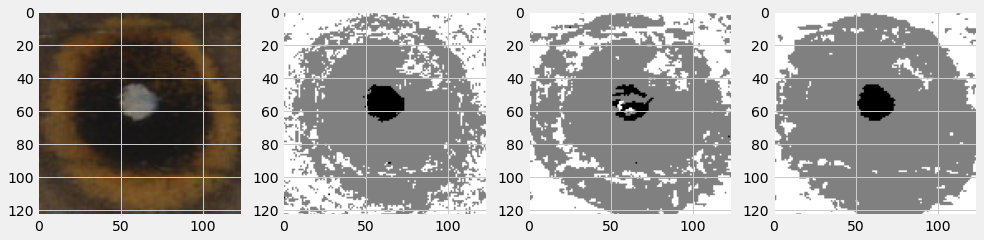

Counter({1: 9588, 2: 5403, 0: 385})
Counter({1: 10248, 2: 4888, 0: 240})
Counter({1: 11184, 2: 3828, 0: 364})


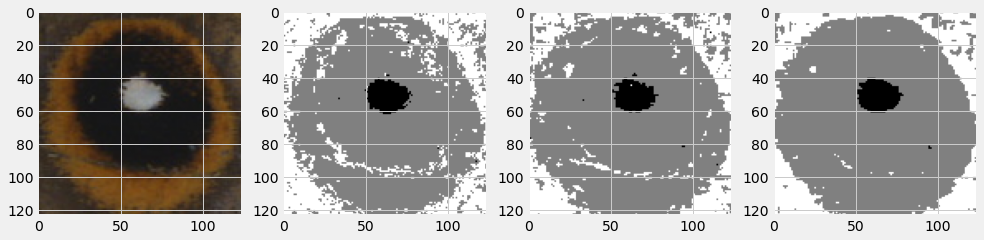

Counter({1: 10499, 2: 4455, 0: 422})
Counter({1: 11611, 2: 3368, 0: 397})
Counter({1: 11706, 2: 3245, 0: 425})


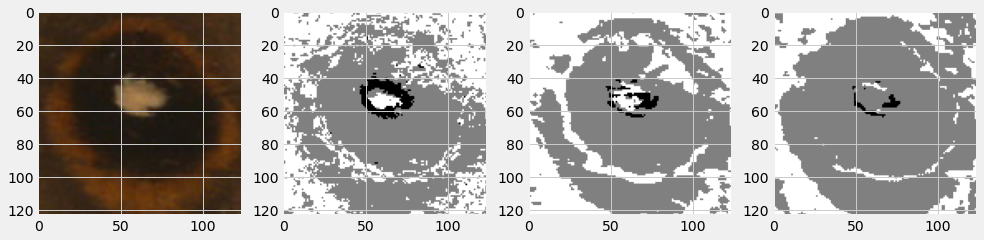

Counter({1: 9110, 2: 5868, 0: 398})
Counter({1: 9158, 2: 6017, 0: 201})
Counter({1: 11589, 2: 3684, 0: 103})


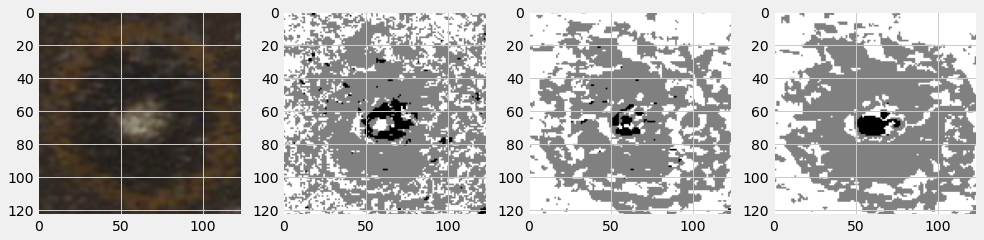

Counter({1: 9524, 2: 5327, 0: 525})
Counter({1: 7778, 2: 7400, 0: 198})
Counter({1: 8441, 2: 6708, 0: 227})


In [45]:
for im in images_array:
    patches = image.extract_patches_2d(im, (5, 5))
    
    patches_reshape = patches.reshape(-1, 75)
    patches_sn = scaler.fit_transform(patches_reshape)
    
    y_pred_bg = bagging_model.predict(patches_sn)
        
    patches_n = patches/255.
    patches_n = patches_n.astype('float32')
    
    y_pred_cnn = model.predict(patches_n)
    
    y_mask_cnn = []

    y_pred_rf = classifier.predict(patches_reshape) 
    
    for i in range(len(y_pred_cnn)):
        y_mask_cnn.append(np.argmax(y_pred_cnn[i]))
         
    fig = plt.figure(figsize=(15, 10))
    ax1 = fig.add_subplot(1,4,1)
    ax1.imshow(im[2:126, 2:126, :]/255.)
    ax2 = fig.add_subplot(1,4,2)
    ax2.imshow(y_pred_bg.reshape(124, 124), cmap='gray')
    ax3 = fig.add_subplot(1,4,3)
    ax3.imshow(np.array(y_mask_cnn).reshape(124, 124), cmap='gray')
    ax4 = fig.add_subplot(1,4,4)
    ax4.imshow(y_pred_rf.reshape(124, 124), cmap='gray')
    plt.show()
    
    print(Counter(y_pred_bg))
    print(Counter(y_mask_cnn))
    print(Counter(y_pred_rf))


### Predictions using the best model: Bagging KNN with Oversampling

In [53]:
# Load variables
x_train_dataset = np.load('Xtrain_Classification2.npy');
y_train_dataset = np.load('Ytrain_Classification2.npy');
x_test = np.load('Xtest_Classification2.npy');

x_train_dataset_n = scaler.fit_transform(x_train_dataset)
x_test_n = scaler.fit_transform(x_test)

ros = RandomOverSampler(random_state=1)
x_ros, y_ros = ros.fit_resample(x_train_dataset_n, y_train_dataset)

bagged_knn = KNeighborsClassifier(n_neighbors=3, weights='distance')

bagging_model = BaggingClassifier(bagged_knn, n_estimators=20, random_state = 1)

bagging_model.fit(x_ros, y_ros)

y_pred = bagging_model.predict(x_test_n) 

In [54]:
print(y_pred)

[1 1 2 ... 2 2 2]


In [55]:
Counter(y_pred)

Counter({1: 22521, 2: 9775, 0: 1504})

In [56]:
np.save('y_test.npy', y_pred)
print(np.shape(y_pred))

(33800,)
